# EDA

Ce notebook traite de l'analyse exploratoire des jeux de donnée en utilisant un kernel Kaggle 
--> https://www.kaggle.com/code/rishabhrao/home-credit-default-risk-extensive-eda/notebook
Les fonctions python utilisées pour l'EDA sont extraites du Kernel ci-dessus.

In [2]:
# chargement librairies
import numpy as np
import pandas as pd 
import os
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 
import datetime
import sys
import time
from datetime import datetime
# Warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
def lister_fichiers_repertoire(chemin_rep):
    '''
    Liste les noms des fichiers d'un répertoire et affiche la taille des
    fichiers en MegaBytes.
    Parameters
    ----------
    chemin_rep : chemin où se trouve le répertoire contenant les fichiers,
                 obligatoire.
    Returns
    -------
    None
    '''
    liste_fichiers = list(os.listdir(chemin_rep))
    dataframe_fic = pd.DataFrame(liste_fichiers, columns=['Nom_fichier'])
    dataframe_fic['Size_en_MB'] = dataframe_fic.Nom_fichier.apply(
        lambda x: round(os.stat(chemin_rep + x) .st_size / (1024 * 1024), 2))
    nb_fic = dataframe_fic.shape[0]
    if nb_fic > 1:
        display(str(nb_fic) + ' fichiers présents dans ce répertoire :')
    else:
        display(str() + ' fichier présent')

    return dataframe_fic.style.hide_index()

In [4]:
path=r'C:/Users/mehan/Desktop/DATA SCIENTIST/P07/data_csv/'
lister_fichiers_repertoire(path)

'12 fichiers présents dans ce répertoire :'

Nom_fichier,Size_en_MB
.ipynb_checkpoints,0.000000
application_test.csv,25.340000
application_train.csv,158.440000
bureau.csv,162.140000
bureau_balance.csv,358.190000
credit_card_balance.csv,404.910000
HomeCredit_columns_description.csv,0.040000
installments_payments.csv,689.620000
POS_CASH_balance.csv,374.510000
previous_application.csv,386.210000


In [5]:
def load_all_tables(directory_path='', verbose=True):
    '''
    Function to load all the tables required
    Input:
        directory_path: str, default = ''
            Path of directory in which tables are stored in
        verbose: bool, default = True
            Whether to keep verbosity or not
    '''
    if verbose:
        print("Chargement des jeux de donnees...")
        print("--------------------------------------------------------------------")
        start = datetime.now()

    application_train = pd.read_csv(directory_path + 'application_train.csv')
    if verbose:
        print("Fichier application_train.csv chargé -> dataframe : application_train")

    application_test = pd.read_csv(directory_path + 'application_test.csv')
    if verbose:
        print("Fichier application_test.csv chargé -> dataframe : application_test")

    bureau = pd.read_csv(directory_path + 'bureau.csv')
    if verbose:
        print("Fichier bureau.csv chargé -> dataframe : bureau")

    bureau_balance = pd.read_csv(directory_path + 'bureau_balance.csv')
    if verbose:
        print("Fichier bureau_balance.csv chargé -> dataframe : bureau_balance")

    cc_balance = pd.read_csv(directory_path + 'credit_card_balance.csv')
    if verbose:
        print("Fichier credit_card_balance.csv chargé -> dataframe : cc_balance")

    installments_payments = pd.read_csv(
        directory_path + 'installments_payments.csv')
    if verbose:
        print(
            "Fichier installments_payments.csv chargé -> dataframe : installments_payments")

    POS_CASH_balance = pd.read_csv(directory_path + 'POS_CASH_balance.csv')
    if verbose:
        print("Fichier POS_CASH_balance.csv chargé -> dataframe : POS_CASH_balance")

    HomeCredit_columns_description = pd.read_csv(
        directory_path +
        'HomeCredit_columns_description.csv',
        encoding='cp1252')
    del HomeCredit_columns_description['Unnamed: 0']
    if verbose:
        print("Fichier HomeCredit_columns_description.csv chargé -> dataframe : HomeCredit_columns_description")

    previous_application = pd.read_csv(
        directory_path + 'previous_application.csv')
    if verbose:
        print("Fichier previous_application.csv chargé -> dataframe : previous_application")

    if verbose:
        print("--------------------------------------------------------------------")
        print(
            f'Chargement des 9 jeux de donnees termineéen {datetime.now() - start} secondes')

    return application_train, application_test, bureau, bureau_balance, \
        cc_balance, installments_payments, POS_CASH_balance, previous_application, \
        HomeCredit_columns_description

In [6]:
application_train, application_test, bureau, bureau_balance, cc_balance, \
    installments_payments, POS_CASH_balance, previous_application, \
    HomeCredit_columns_description =load_all_tables(path)

Chargement des jeux de donnees...
--------------------------------------------------------------------
Fichier application_train.csv chargé -> dataframe : application_train
Fichier application_test.csv chargé -> dataframe : application_test
Fichier bureau.csv chargé -> dataframe : bureau
Fichier bureau_balance.csv chargé -> dataframe : bureau_balance
Fichier credit_card_balance.csv chargé -> dataframe : cc_balance
Fichier installments_payments.csv chargé -> dataframe : installments_payments
Fichier POS_CASH_balance.csv chargé -> dataframe : POS_CASH_balance
Fichier HomeCredit_columns_description.csv chargé -> dataframe : HomeCredit_columns_description
Fichier previous_application.csv chargé -> dataframe : previous_application
--------------------------------------------------------------------
Chargement des 9 jeux de donnees termineéen 0:00:49.871003 secondes


In [7]:
def resume_datasets(dataframes, noms):
    '''
    Résumé rapide du contenu, nom, nombre de lignes, nombre de variables,
    valeurs manquantes, variable avec valeurs manquantes... pour plusieurs
    dataframes transmis en paramètres.
    Parameters
    ----------
    dataframes : les dataframes à résumer, obligatoire.
    noms : les noms des dataframes transmis, obligatoire.
    Returns
    -------
    df_resume : dataframe de résumé
    '''
    print(f'Les données se décomposent en {len(dataframes)} fichier(s).')

    # Creating a DataFrame with useful information about all datasets
    df_resume = pd.DataFrame({})
    df_resume['Jeu de données'] = noms
    df_resume['Nb lignes'] = [df.shape[0] for df in dataframes]
    df_resume['Nb variables'] = [df.shape[1] for df in dataframes]
    df_resume['Nb nan'] = [df.isnull().sum().sum() for df in dataframes]
    df_resume['% nan'] = [(df.isnull().sum().sum() * 100 / np.product(df.shape)) for df in dataframes]
    df_resume['Nb var avec nan'] = [len(
        [col for col, null in df.isnull().sum().items() if null > 0]) for df in dataframes]
    df_resume['Var avec nan'] = [', '.join(
        [col for col, null in df.isnull().sum().items() if null > 0]) for df in dataframes]

    return df_resume.style.hide_index()

In [8]:
# Vue d'ensemble des 9 jeux de données
dataframes = [application_train, application_test, bureau, bureau_balance,
              cc_balance, installments_payments, POS_CASH_balance,
              previous_application, HomeCredit_columns_description]
noms = ['application_train', 'application_test', 'bureau', 'bureau_balance',
        'cc_balance', 'installments_payments', 'POS_CASH_balance',
        'previous_application', 'HomeCredit_columns_description']
resume_datasets(dataframes, noms)

Les données se décomposent en 9 fichier(s).


Jeu de données,Nb lignes,Nb variables,Nb nan,% nan,Nb var avec nan,Var avec nan
application_train,307511,122,9152465,24.395942,67,"AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, CNT_FAM_MEMBERS, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
application_test,48744,121,1404419,23.811687,64,"AMT_ANNUITY, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
bureau,1716428,17,3939947,13.502552,7,"DAYS_CREDIT_ENDDATE, DAYS_ENDDATE_FACT, AMT_CREDIT_MAX_OVERDUE, AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_LIMIT, AMT_ANNUITY"
bureau_balance,27299925,3,0,0.000000,0,
cc_balance,3840312,23,5877356,6.654074,9,"AMT_DRAWINGS_ATM_CURRENT, AMT_DRAWINGS_OTHER_CURRENT, AMT_DRAWINGS_POS_CURRENT, AMT_INST_MIN_REGULARITY, AMT_PAYMENT_CURRENT, CNT_DRAWINGS_ATM_CURRENT, CNT_DRAWINGS_OTHER_CURRENT, CNT_DRAWINGS_POS_CURRENT, CNT_INSTALMENT_MATURE_CUM"
installments_payments,13605401,8,5810,0.005338,2,"DAYS_ENTRY_PAYMENT, AMT_PAYMENT"
POS_CASH_balance,10001358,8,52158,0.065189,2,"CNT_INSTALMENT, CNT_INSTALMENT_FUTURE"
previous_application,1670214,37,11109336,17.976877,16,"AMT_ANNUITY, AMT_CREDIT, AMT_DOWN_PAYMENT, AMT_GOODS_PRICE, RATE_DOWN_PAYMENT, RATE_INTEREST_PRIMARY, RATE_INTEREST_PRIVILEGED, NAME_TYPE_SUITE, CNT_PAYMENT, PRODUCT_COMBINATION, DAYS_FIRST_DRAWING, DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, DAYS_TERMINATION, NFLAG_INSURED_ON_APPROVAL"
HomeCredit_columns_description,219,4,133,15.182648,1,Special


## 1-Fichier application_train.csv

In [9]:
# compréhension des variables 

In [10]:
df_var_appli_train = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'application_{train|test}.csv']
df_var_appli_train.style.hide_index()

Table,Row,Description,Special
application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,nan
application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",nan
application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,nan
application_{train|test}.csv,CODE_GENDER,Gender of the client,nan
application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,nan
application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,nan
application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,nan
application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,nan
application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,nan
application_{train|test}.csv,AMT_ANNUITY,Loan annuity,nan


In [11]:
def afficher_stats_basic(dataframe, titre='application_train'):
    print('-' * 79)
    # Taille : nombre de lignes/colonnes
    nRow, nVar = dataframe.shape
    print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')
    print('-' * 79)
    duplicate = \
        dataframe.shape[0] - dataframe.duplicated().shape[0]
    print(f'Numbre de valeurs dupliquées dans {titre} : {duplicate}')
    print('-' * 79)
    print('Contenu des 3 premières lignes :')
    display(dataframe.head(3))

In [12]:
afficher_stats_basic(application_train)

-------------------------------------------------------------------------------
Le jeu de données contient 307511 lignes et 122 variables.
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans application_train : 0
-------------------------------------------------------------------------------
Contenu des 3 premières lignes :


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
def description_variables(dataframe, type_var='all'):
    """
    Retourne la description des variables qualitatives/quantitatives
    ou toutes les variables du dataframe transmis :
    type, nombre de nan, % de nan et desc
    Parameters
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                type_var = 'all' ==> tous les types de variables (défaut)
                           'cat' ==> variables catégorielles
                           'num' ==> variables quantitative
                           facultatif
    @param OUT : dataframe de description des variables
    """
    df_taille = dataframe.shape[0]

    if type_var == 'num':
        desc_var = dataframe.describe(datetime_is_numeric=True)
    elif type_var == 'cat':
        desc_var = dataframe.describe(
            exclude=[np.number], datetime_is_numeric=True)
    else:
        desc_var = dataframe.describe(include='all', datetime_is_numeric=True)

    desc_type = pd.DataFrame(
        dataframe[desc_var.columns].dtypes, columns=['type']).T
    nb_nan = df_taille - desc_var.loc['count'].T
    pourcentage_nan = nb_nan * 100 / np.product(dataframe.shape)
    desc_nan = pd.DataFrame([nb_nan, pourcentage_nan],
                            index=['nb_nan', '%_nan'])
    desc_var = pd.concat([desc_type, desc_nan, desc_var])

    return desc_var

In [14]:
# Résumé des variables
desc_appli_train = description_variables(application_train)
desc_appli_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
type,int64,int64,object,object,object,object,int64,float64,float64,float64,...,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,...,0.0,0.0,0.0,0.0,41519.0,41519.0,41519.0,41519.0,41519.0,41519.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000032,...,0.0,0.0,0.0,0.0,0.110669,0.110669,0.110669,0.110669,0.110669,0.110669
count,307511.0,307511.0,307511,307511,307511,307511,307511.0,307511.0,307511.0,307499.0,...,307511.0,307511.0,307511.0,307511.0,265992.0,265992.0,265992.0,265992.0,265992.0,265992.0
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,168797.919297,599025.999706,27108.573909,...,0.00813,0.000595,0.000507,0.000335,0.006402,0.007,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,237123.146279,402490.776996,14493.737315,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.0,0.0,NaN,NaN,NaN,NaN,0.0,25650.0,45000.0,1615.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
# etude des NaN

In [16]:
def get_missing_values(df_work, pourcentage, affiche_heatmap):
    """Indicateurs sur les variables manquantes
       @param in : df_work dataframe obligatoire
                   pourcentage : boolean si True affiche le nombre heatmap
                   affiche_heatmap : boolean si True affiche la heatmap
       @param out : none
    """

    # 1. Nombre de valeurs manquantes totales
    nb_nan_tot = df_work.isna().sum().sum()
    nb_donnees_tot = np.product(df_work.shape)
    pourc_nan_tot = round((nb_nan_tot / nb_donnees_tot) * 100, 2)
    print(
        f'Valeurs manquantes : {nb_nan_tot} NaN pour {nb_donnees_tot} données ({pourc_nan_tot} %)')

    if pourcentage:
        print("-------------------------------------------------------------")
        print("Nombre et pourcentage de valeurs manquantes par variable\n")
        # 2. Visualisation du nombre et du pourcentage de valeurs manquantes
        # par variable
        values = df_work.isnull().sum()
        percentage = 100 * values / len(df_work)
        table = pd.concat([values, percentage.round(2)], axis=1)
        table.columns = [
            'Nombres de valeurs manquantes',
            '% de valeurs manquantes']
        display(table[table['Nombres de valeurs manquantes'] != 0]
                .sort_values('% de valeurs manquantes', ascending=False)
                .style.background_gradient('seismic'))

    if affiche_heatmap:
        print("-------------------------------------------------------------")
        print("Heatmap de visualisation des valeurs manquantes")
        # 3. Heatmap de visualisation des valeurs manquantes
        plt.figure(figsize=(20, 10))
        sns.heatmap(df_work.isna(), cbar=False)
        plt.show()


Valeurs manquantes : 9152465 NaN pour 37516342 données (24.4 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MEDI,214865,69.870000
COMMONAREA_AVG,214865,69.870000
COMMONAREA_MODE,214865,69.870000
NONLIVINGAPARTMENTS_MEDI,213514,69.430000
NONLIVINGAPARTMENTS_MODE,213514,69.430000
NONLIVINGAPARTMENTS_AVG,213514,69.430000
FONDKAPREMONT_MODE,210295,68.390000
LIVINGAPARTMENTS_MODE,210199,68.350000
LIVINGAPARTMENTS_MEDI,210199,68.350000
LIVINGAPARTMENTS_AVG,210199,68.350000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


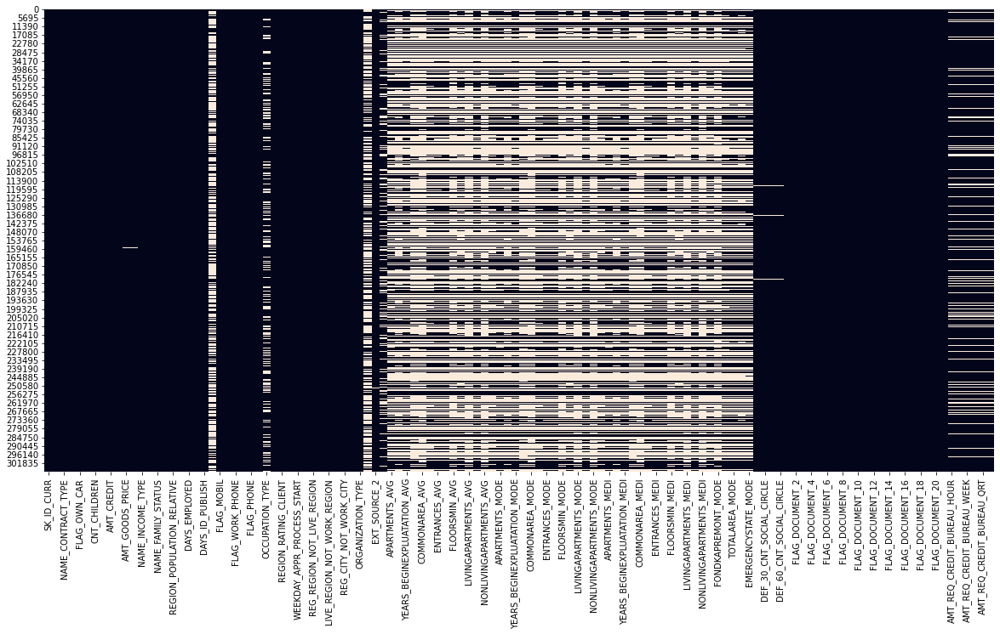

In [17]:
get_missing_values(application_train, True, True)

In [18]:
def nan_df_create(data):
    '''
    Function to create a dataframe of percentage of NaN values for each column of the dataframe
    Inputs:
        data:
            DataFrame
    Returns:
        DataFrame of NaN percentages
    '''
    nan_percentages = data.isna().sum() * 100 / len(data)
    df = pd.DataFrame({'column': nan_percentages.index,
                       'percent': nan_percentages.values})

    # sorting the dataframe by decreasing order of percentage of NaN values
    df.sort_values(by='percent', ascending=False, inplace=True)

    return df

In [19]:
def plot_nan_percent(df_nan, title_name, tight_layout=True, figsize=(20, 8),
                     grid=False, rotation=90, fontsize=16):
    '''
    Function to plot Bar Plots of NaN percentages for each Column with missing values
    Inputs:
        df_nan:
            DataFrame of NaN percentages
        title_name:
            Name of table to be displayed in title of plot
        tight_layout: bool, default = True
            Whether to keep tight layout or not
        figsize: tuple, default = (20,8)
            Figure size of plot
        grid: bool, default = False
            Whether to draw gridlines to plot or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
    '''
    sns.set(style='white', font_scale=1.2)
    # checking if there is any column with NaNs or not.
    if df_nan.percent.sum() != 0:
        print(
            f"Nombre de variables avec valeurs manquantes : {df_nan[df_nan['percent'] != 0].shape[0]}")

        # plotting the Bar-Plot for NaN percentages (only for columns with
        # Non-Zero percentage of NaN values)
        plt.figure(figsize=figsize, tight_layout=tight_layout)
        sns.barplot(x='column', y='percent',
                    data=df_nan[df_nan['percent'] > 0])
        plt.xticks(rotation=rotation)
        plt.xlabel('Nom de variable', fontsize=fontsize)
        plt.ylabel('% de valeurs NaN', fontsize=fontsize)
        plt.xticks(fontsize=fontsize)
        plt.yticks(fontsize=fontsize)
        plt.title(f'Pourcentage de valeurs NaN dans {title_name}', fontsize=fontsize+4)
        if grid:
            plt.grid()
        plt.show()
    else:
        print(
            f"Le dataframe {title_name} ne contient pas de valeurs manquantes.")

Nombre de variables avec valeurs manquantes : 67


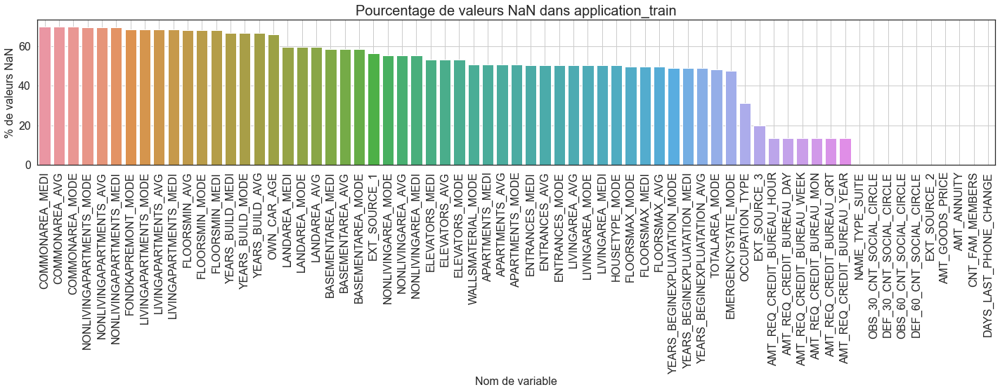

In [20]:
# Réprésentation visuelle des valeurs manquantes
df_nan =nan_df_create(application_train)
plot_nan_percent(df_nan, 'application_train',
                                      grid=True)

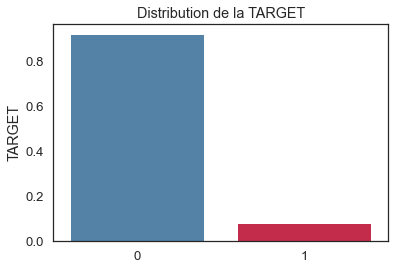

In [21]:
# distribution de la target
sns.barplot(x=[0, 1],
            y=application_train['TARGET'].value_counts(normalize=True),
            palette=['SteelBlue', 'crimson'])
plt.title('Distribution de la TARGET')
plt.show()

### VARIABLES QUALI

In [22]:
# Liste des variables qualitatives
cols_cat = \
    application_train.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [23]:
def print_unique_categories(data, column_name, show_counts=False):
    '''
    Function to print the basic stats such as unique categories and their counts for categorical variables
        Inputs:
        data: DataFrame
            The DataFrame from which to print statistics
        column_name: str
            Column's name whose stats are to be printed
        show_counts: bool, default = False
            Whether to show counts of each category or not
    '''

    print('-' * 79)
    print(
        f"Les catégories uniques de la variable '{column_name}' sont :\n{data[column_name].unique()}")
    print('-' * 79)

    if show_counts:
        print(
            f"Répartition dans chaque catégorie :\n{data[column_name].value_counts()}")
        print('-' * 79)

In [24]:
print_unique_categories(application_train, 'NAME_CONTRACT_TYPE')


-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CONTRACT_TYPE' sont :
['Cash loans' 'Revolving loans']
-------------------------------------------------------------------------------


In [25]:
def plot_barplot_comp_target(dataframe, feature_name,
                             labels=['Non-défaillant', 'Défaillant'],
                             palette=['SteelBlue', 'crimson'],
                             rotation=0):
    '''
    Barplot de comparaison des catégories par target.
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    feature_name : variable, obligatoire.
    Returns
    -------
    None.
    '''
    sns.countplot(x=dataframe[feature_name], hue=dataframe.TARGET,
                  data=dataframe, palette=palette)
    plt.xticks(rotation=rotation)
    plt.title(f'Distribution de {feature_name} par défaillant/non-défaillant')
    plt.legend(labels=labels,
               bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()

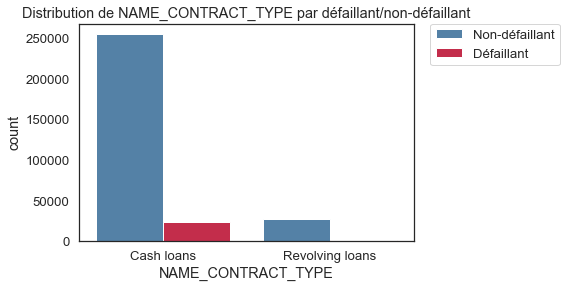

In [26]:
plot_barplot_comp_target(application_train,'NAME_CONTRACT_TYPE')

In [27]:
print_unique_categories(application_train,'CODE_GENDER',show_counts=True)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CODE_GENDER' sont :
['M' 'F' 'XNA']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
-------------------------------------------------------------------------------


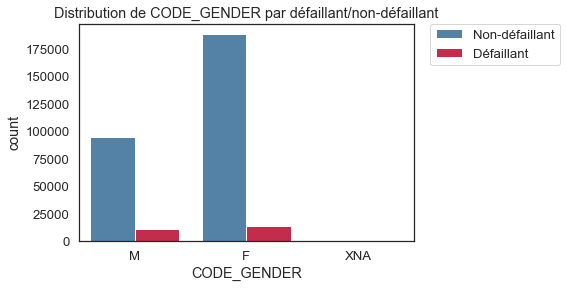

In [28]:
plot_barplot_comp_target(application_train,'CODE_GENDER')

In [29]:
print_unique_categories(application_train,'FLAG_EMP_PHONE')

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'FLAG_EMP_PHONE' sont :
[1 0]
-------------------------------------------------------------------------------


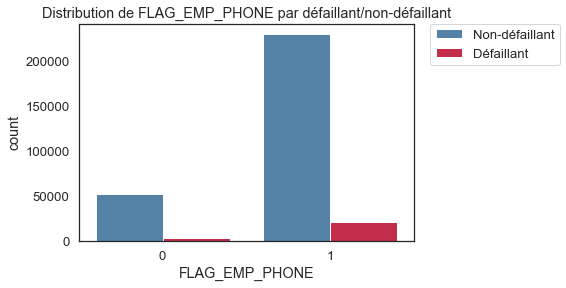

In [30]:
plot_barplot_comp_target(application_train,'FLAG_EMP_PHONE')

In [31]:
print_unique_categories(application_train, 'REGION_RATING_CLIENT_W_CITY')

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'REGION_RATING_CLIENT_W_CITY' sont :
[2 1 3]
-------------------------------------------------------------------------------


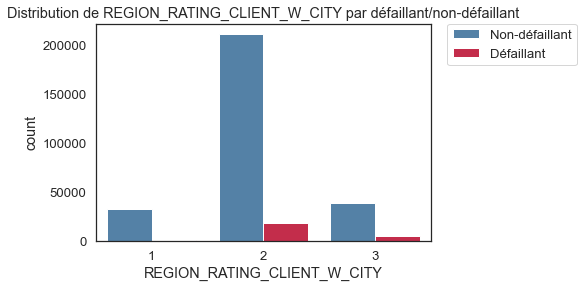

In [32]:
plot_barplot_comp_target(application_train,'REGION_RATING_CLIENT_W_CITY')

In [33]:
print_unique_categories(application_train,'NAME_EDUCATION_TYPE',show_counts=True)


-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_EDUCATION_TYPE' sont :
['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64
-------------------------------------------------------------------------------


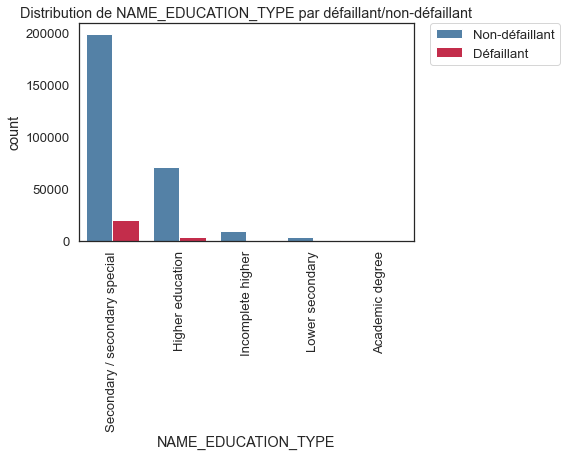

In [34]:
plot_barplot_comp_target(application_train,'NAME_EDUCATION_TYPE',rotation=90) 

In [35]:
print_unique_categories(application_train,'OCCUPATION_TYPE')

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'OCCUPATION_TYPE' sont :
['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers'
 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries'
 'IT staff' 'HR staff']
-------------------------------------------------------------------------------


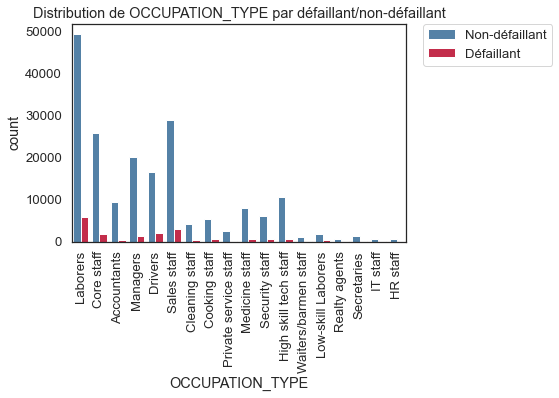

In [36]:
plot_barplot_comp_target(application_train,'OCCUPATION_TYPE', rotation=90)

Nombre de catégorie de la variable ORGANIZATION_TYPE = 58


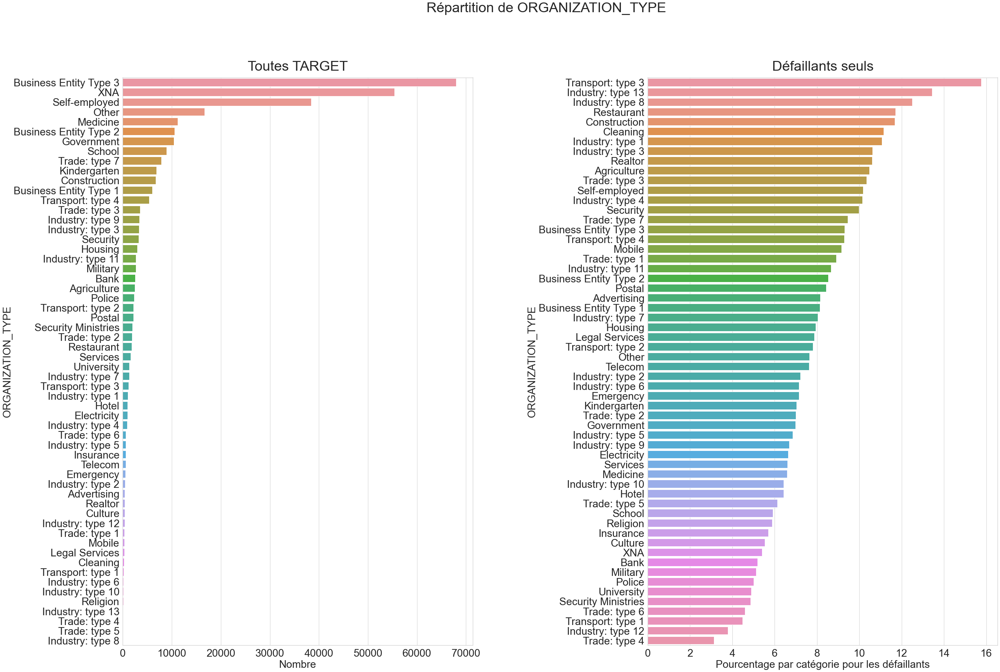

In [37]:
print(f"Nombre de catégorie de la variable ORGANIZATION_TYPE = \
{len(application_train.ORGANIZATION_TYPE.unique())}")

plt.figure(figsize=(45, 30))
sns.set(style='whitegrid', font_scale=1.2)
plt.subplots_adjust(wspace=0.5)

plt.subplot(1, 2, 1)
count_organization = application_train.ORGANIZATION_TYPE.value_counts() \
    .sort_values(ascending=False)
sns.barplot(x=count_organization, y=count_organization.index)
plt.title('Toutes TARGET', pad=20, fontsize=40)
plt.xlabel('Nombre', fontsize=30)
plt.ylabel('ORGANIZATION_TYPE', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(1, 2, 2)
percentage_default_per_organization = \
    application_train[application_train.TARGET == 1].ORGANIZATION_TYPE. \
    value_counts() * 100 / count_organization
percentage_default_per_organization = \
    percentage_default_per_organization.dropna(). \
    sort_values(ascending=False)
sns.barplot(x=percentage_default_per_organization,
            y=percentage_default_per_organization.index)
plt.title('Défaillants seuls', pad=20, fontsize=40)
plt.xlabel('Pourcentage par catégorie pour les défaillants', fontsize=30)
plt.ylabel('ORGANIZATION_TYPE', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.suptitle(f'Répartition de ORGANIZATION_TYPE', fontsize=40)
plt.show()

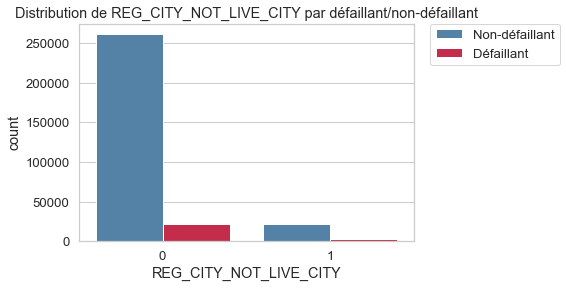

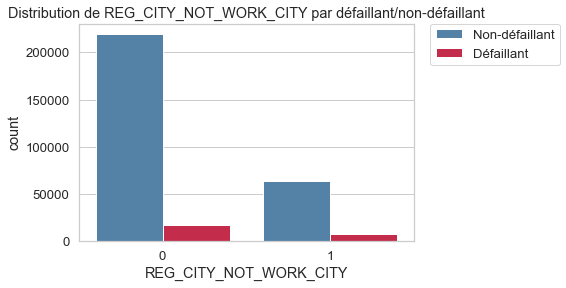

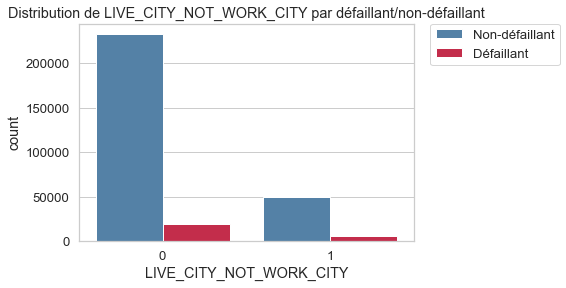

In [38]:
plot_barplot_comp_target(application_train, 'REG_CITY_NOT_LIVE_CITY')
plot_barplot_comp_target(application_train, 'REG_CITY_NOT_WORK_CITY')
plot_barplot_comp_target(application_train, 'LIVE_CITY_NOT_WORK_CITY')


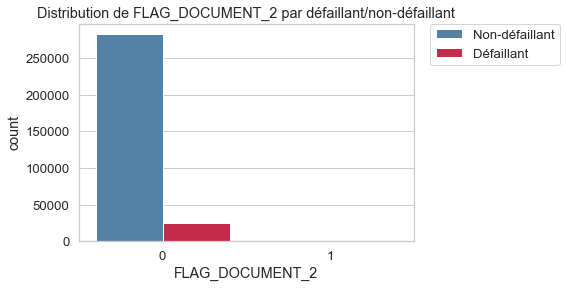

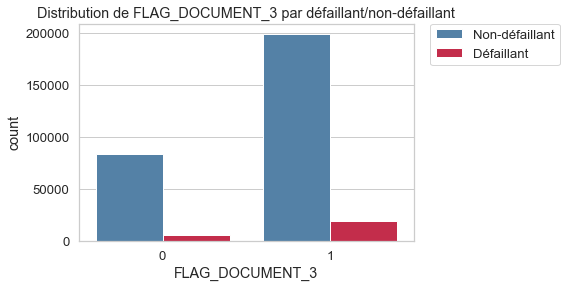

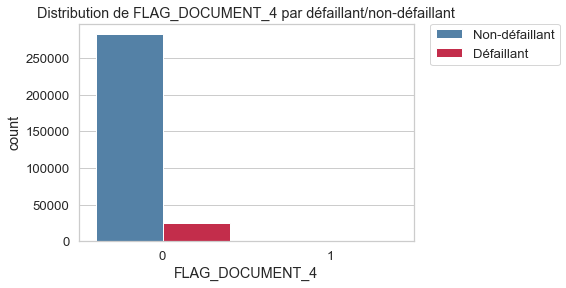

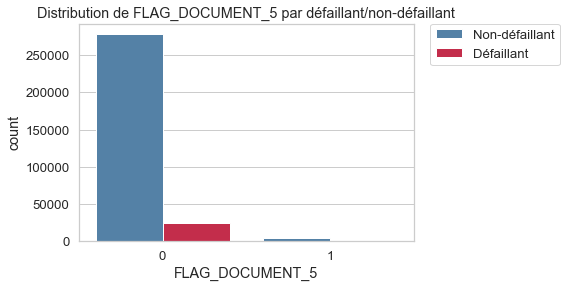

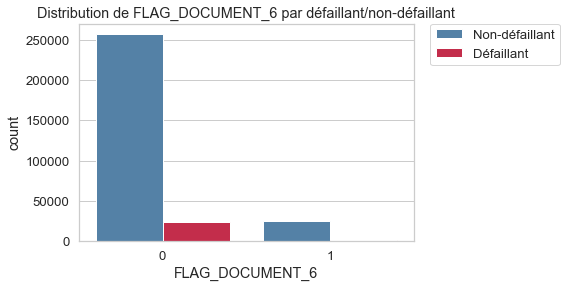

...

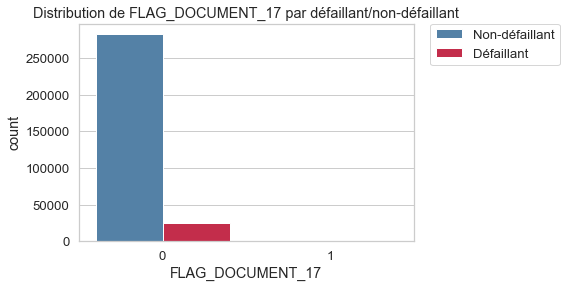

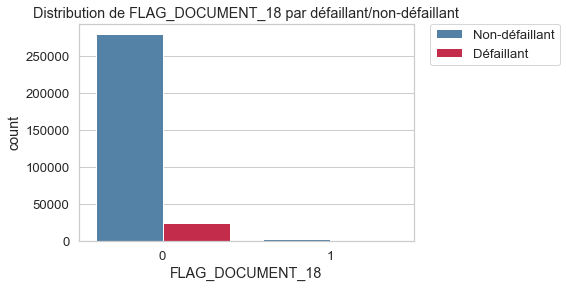

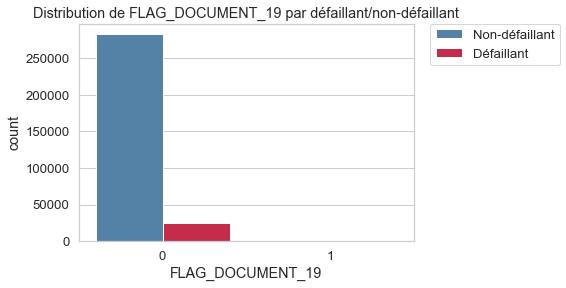

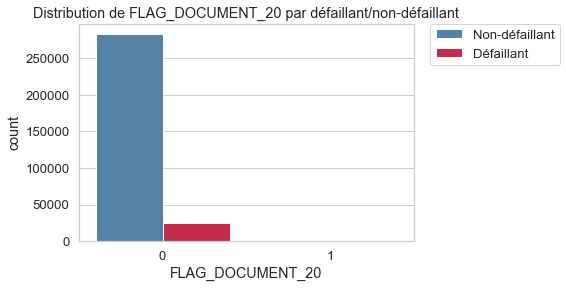

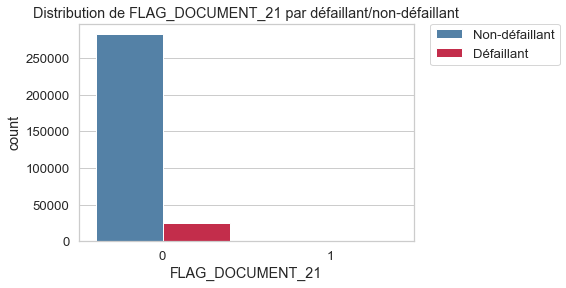

In [39]:
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_2')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_3')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_4')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_5')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_6')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_7')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_8')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_9')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_10')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_11')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_12')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_13')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_14')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_15')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_16')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_17')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_18')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_19')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_20')
plot_barplot_comp_target(application_train,'FLAG_DOCUMENT_21')


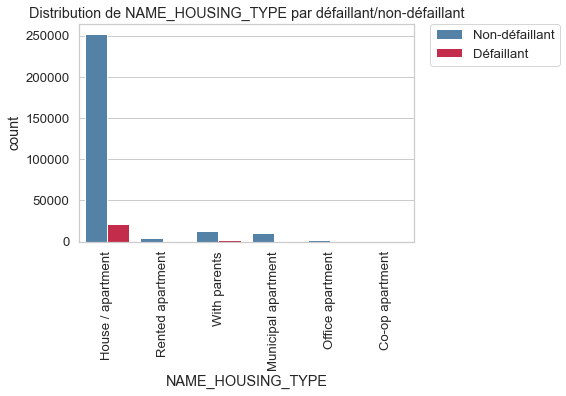

In [40]:
plot_barplot_comp_target(application_train,'NAME_HOUSING_TYPE', rotation=90)

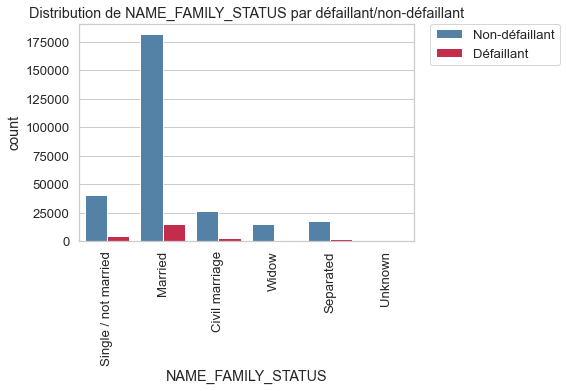

In [41]:
plot_barplot_comp_target(application_train,'NAME_FAMILY_STATUS',rotation=90)

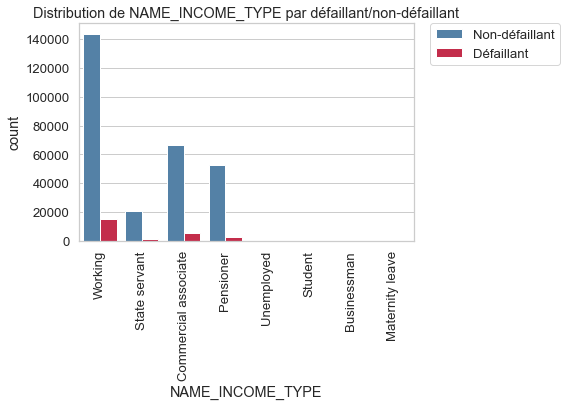

In [42]:
plot_barplot_comp_target(application_train, 'NAME_INCOME_TYPE', rotation=90)

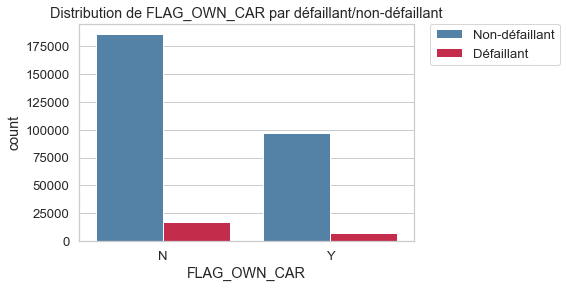

In [43]:
plot_barplot_comp_target(application_train,'FLAG_OWN_CAR')

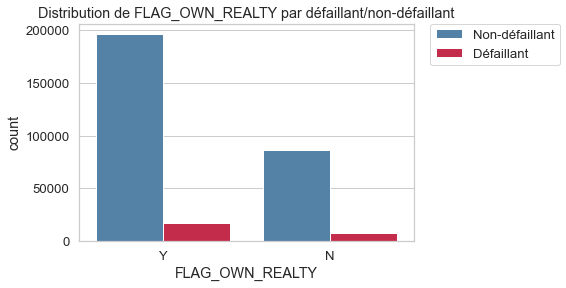

In [44]:
plot_barplot_comp_target(application_train,'FLAG_OWN_REALTY')

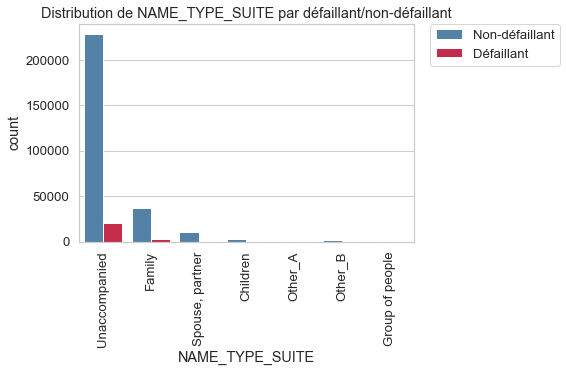

In [45]:
plot_barplot_comp_target(application_train,'NAME_TYPE_SUITE',rotation=90)

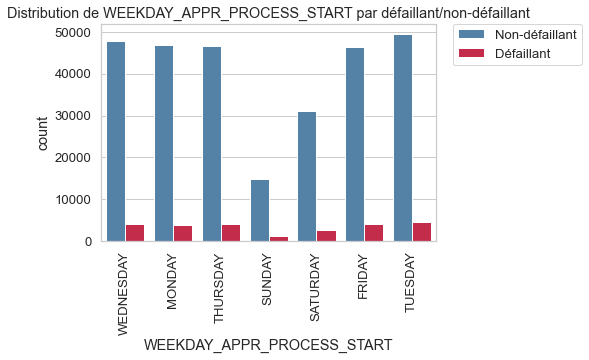

In [46]:
plot_barplot_comp_target(application_train,'WEEKDAY_APPR_PROCESS_START', rotation=90)

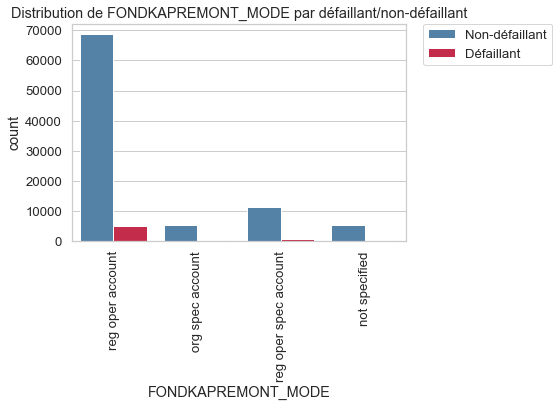

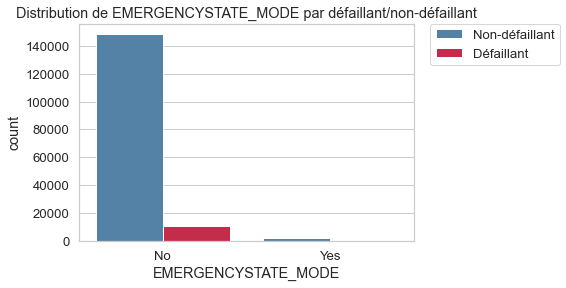

In [47]:
plot_barplot_comp_target(application_train,'FONDKAPREMONT_MODE', rotation=90)
plot_barplot_comp_target(application_train,'EMERGENCYSTATE_MODE')

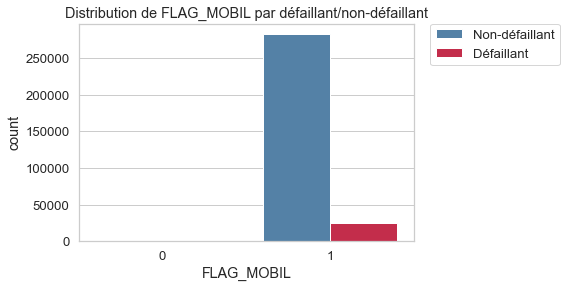

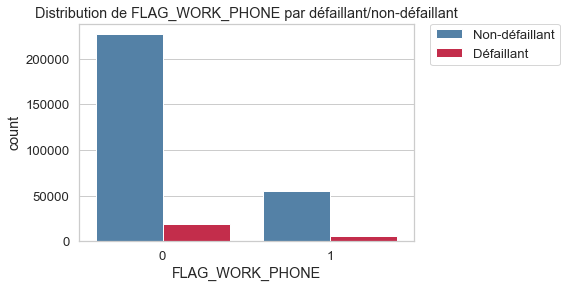

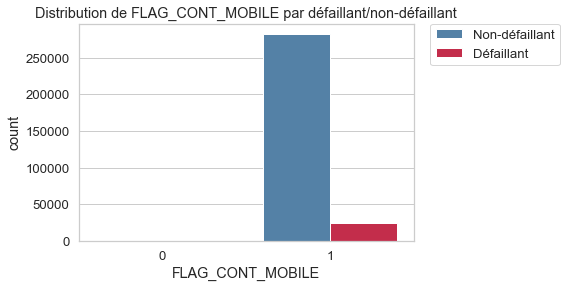

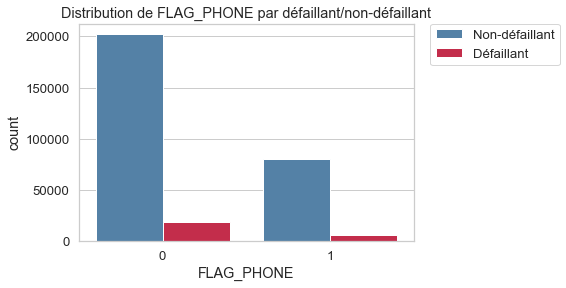

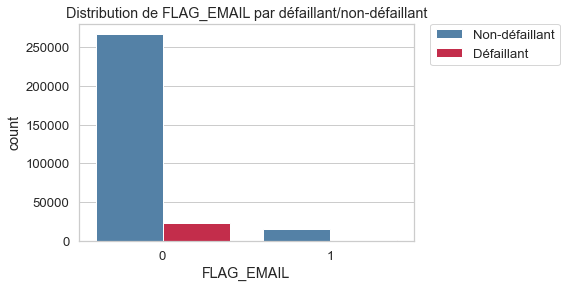

In [48]:
plot_barplot_comp_target(application_train,'FLAG_MOBIL')
plot_barplot_comp_target(application_train,'FLAG_WORK_PHONE') # tél de taf
plot_barplot_comp_target(application_train,'FLAG_CONT_MOBILE')# joignable?
plot_barplot_comp_target(application_train, 'FLAG_PHONE')# Fix de maison?
plot_barplot_comp_target(application_train, 'FLAG_EMAIL')# Email?



### VARIABLES QUANTI

In [49]:
# Liste des variables quantitatives
cols_num = application_train.select_dtypes(include=[np.number]).columns.to_list()
cols_num

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAR

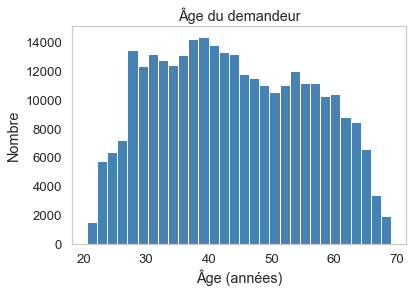

In [50]:
plt.hist(application_train['DAYS_BIRTH']*-1/365, color='SteelBlue',
         bins=30)
plt.title('Âge du demandeur')
plt.xlabel('Âge (années)')
plt.ylabel('Nombre')
plt.grid(False)
plt.show()

In [51]:
# Transformer l'âge en années à partir du nombre de jours
application_train['AGE_YEARS'] = \
    application_train['DAYS_BIRTH'] * -1 / 365

In [52]:
percentiles = list(range(0, 80, 25)) + list(range(90, 101, 2))

In [53]:
def plot_continuous_variables(data, column_name,
                              plots=['distplot', 'CDF', 'box', 'violin'], 
                              scale_limits=None, figsize=(20, 9),
                              histogram=True, log_scale=False,
                              palette=['SteelBlue', 'Crimson']):
    '''
    Function to plot continuous variables distribution
    Inputs:
        data: DataFrame
            The DataFrame from which to plot.
        column_name: str
            Column's name whose distribution is to be plotted.
        plots: list, default = ['distplot', 'CDF', box', 'violin']
            List of plots to plot for Continuous Variable.
        scale_limits: tuple (left, right), default = None
            To control the limits of values to be plotted in case of outliers.
        figsize: tuple, default = (20,8)
            Size of the figure to be plotted.
        histogram: bool, default = True
            Whether to plot histogram along with distplot or not.
        log_scale: bool, default = False
            Whether to use log-scale for variables with outlying points.
    '''
    data_to_plot = data.copy()
    if scale_limits:
        # taking only the data within the specified limits
        data_to_plot[column_name] = data[column_name][(
            data[column_name] > scale_limits[0]) & (data[column_name] < scale_limits[1])]

    number_of_subplots = len(plots)
    plt.figure(figsize=figsize)
    sns.set_style('whitegrid')

    for i, ele in enumerate(plots):
        plt.subplot(1, number_of_subplots, i + 1)
        plt.subplots_adjust(wspace=0.25)

        if ele == 'CDF':
            # making the percentile DataFrame for both positive and negative
            # Class Labels
            percentile_values_0 = data_to_plot[data_to_plot.TARGET == 0][[
                column_name]].dropna().sort_values(by=column_name)
            percentile_values_0['Percentile'] = [
                ele / (len(percentile_values_0) - 1) for ele in range(len(percentile_values_0))]

            percentile_values_1 = data_to_plot[data_to_plot.TARGET == 1][[
                column_name]].dropna().sort_values(by=column_name)
            percentile_values_1['Percentile'] = [
                ele / (len(percentile_values_1) - 1) for ele in range(len(percentile_values_1))]

            plt.plot(
                percentile_values_0[column_name],
                percentile_values_0['Percentile'],
                color='SteelBlue',
                label='Non-Défaillants')
            plt.plot(
                percentile_values_1[column_name],
                percentile_values_1['Percentile'],
                color='crimson',
                label='Défaillants')
            plt.xlabel(column_name, fontsize=16)
            plt.ylabel('Probabilité', fontsize=16)
            plt.title('CDF de {}'.format(column_name), fontsize=18)
            plt.legend(fontsize='medium')
            if log_scale:
                plt.xscale('log')
                plt.xlabel(column_name + ' - (log-scale)')

        if ele == 'distplot':
            sns.distplot(data_to_plot[column_name][data['TARGET'] == 0].dropna(
            ), label='Non-Défaillants', hist=False, color='SteelBlue')
            sns.distplot(data_to_plot[column_name][data['TARGET'] == 1].dropna(
            ), label='Défaillants', hist=False, color='Crimson')
            plt.xlabel(column_name, fontsize=16)
            plt.ylabel('Probability Density', fontsize=16)
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)
            plt.legend(fontsize=18)
            plt.title("Dist-Plot de {}".format(column_name), fontsize=18)
            if log_scale:
                plt.xscale('log')
                plt.xlabel(f'{column_name} (log scale)', fontsize=16)

        if ele == 'violin':
            sns.violinplot(x='TARGET', y=column_name, data=data_to_plot, palette=palette)
            plt.title("Violin-Plot de {}".format(column_name), fontsize=18)
            if log_scale:
                plt.yscale('log')
                plt.ylabel(f'{column_name} (log Scale)')

        if ele == 'box':
            sns.boxplot(x='TARGET', y=column_name, data=data_to_plot, palette=palette)
            plt.title("Box-Plot de {}".format(column_name), fontsize=18)
            if log_scale:
                plt.yscale('log')
                plt.ylabel(f'{column_name} (log Scale)', fontsize=16)
            plt.xlabel('TARGET', fontsize=16)
            plt.ylabel(f'{column_name}', fontsize=16)
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)

    plt.show()

In [54]:
for i in percentiles:
    print(f'Pecentile {i} = {np.percentile(application_train.AGE_YEARS.dropna(), i)}')
    

Pecentile 0 = 20.517808219178082
Pecentile 25 = 34.00821917808219
Pecentile 50 = 43.15068493150685
Pecentile 75 = 53.92328767123288
Pecentile 90 = 60.76986301369863
Pecentile 92 = 61.87397260273973
Pecentile 94 = 62.99452054794521
Pecentile 96 = 64.1945205479452
Pecentile 98 = 65.6027397260274
Pecentile 100 = 69.12054794520547


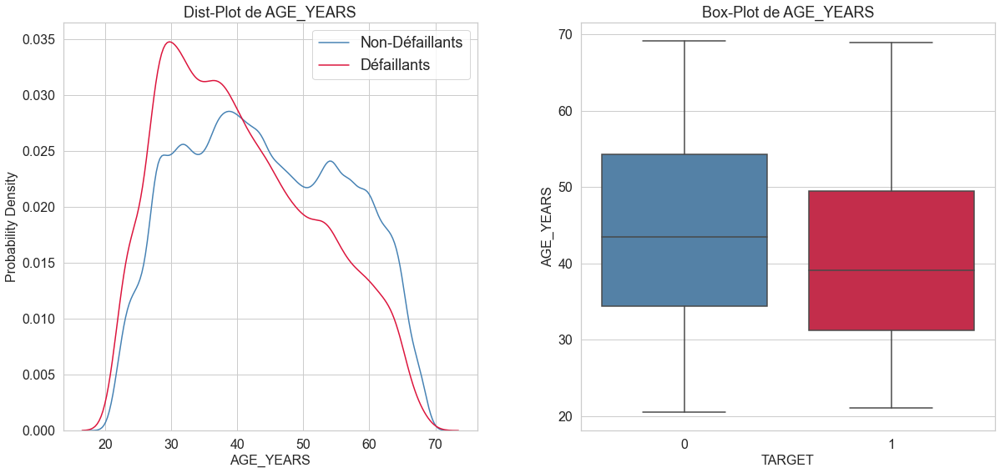

In [55]:
plot_continuous_variables(application_train, 'AGE_YEARS',plots=['distplot', 'box'])

In [56]:
# Transformer en années à partir du nombre de jours
application_train['YEARS_EMPLOYED'] = \
    application_train['DAYS_EMPLOYED'] * -1 / 365

In [57]:
for i in percentiles:
    print(f'Pecentile {i} = {np.percentile(application_train.YEARS_EMPLOYED.dropna(), i)}')

Pecentile 0 = -1000.6657534246575
Pecentile 25 = 0.7917808219178082
Pecentile 50 = 3.3232876712328765
Pecentile 75 = 7.561643835616438
Pecentile 90 = 13.372602739726027
Pecentile 92 = 14.726027397260275
Pecentile 94 = 16.958904109589042
Pecentile 96 = 20.134246575342466
Pecentile 98 = 25.15068493150685
Pecentile 100 = 49.07397260273972


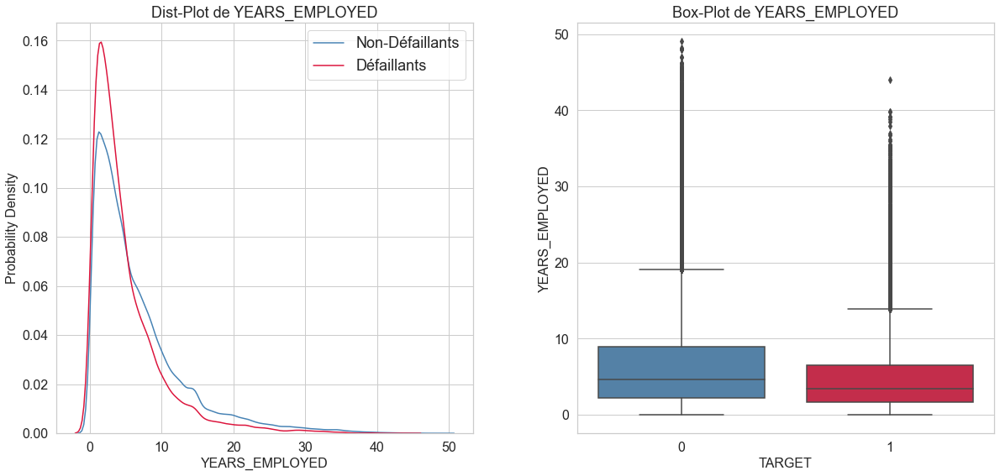

In [58]:
plot_continuous_variables(application_train, 'YEARS_EMPLOYED',plots=['distplot', 'box'], scale_limits=[0, 70])

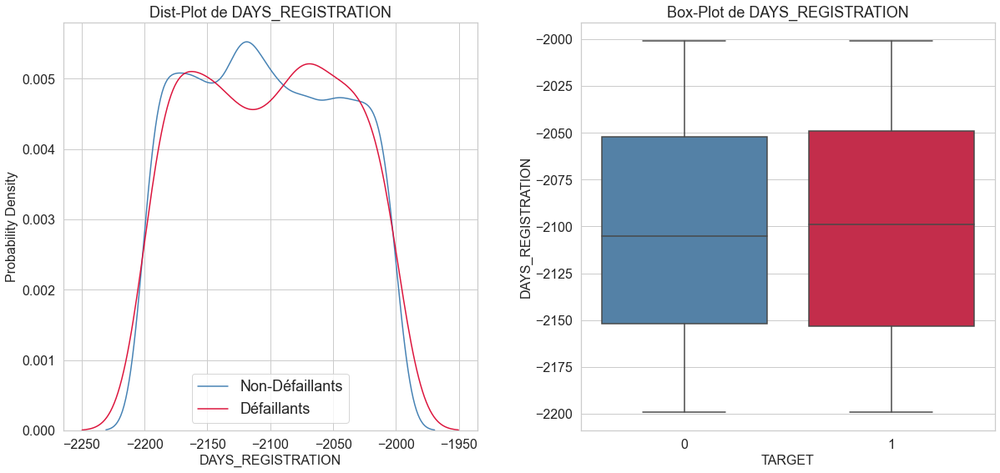

In [59]:
# nombre de jours depuis la dernière modification
plot_continuous_variables(application_train,'DAYS_REGISTRATION', plots=['distplot', 'box'],scale_limits=[-2200, -2000]) 


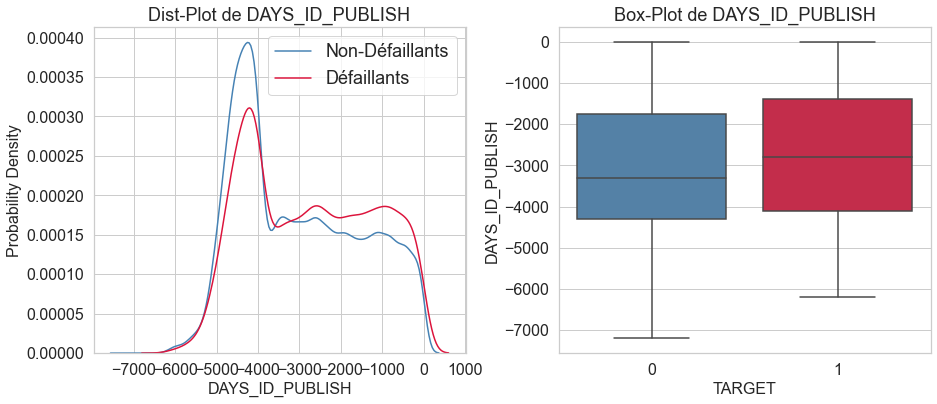

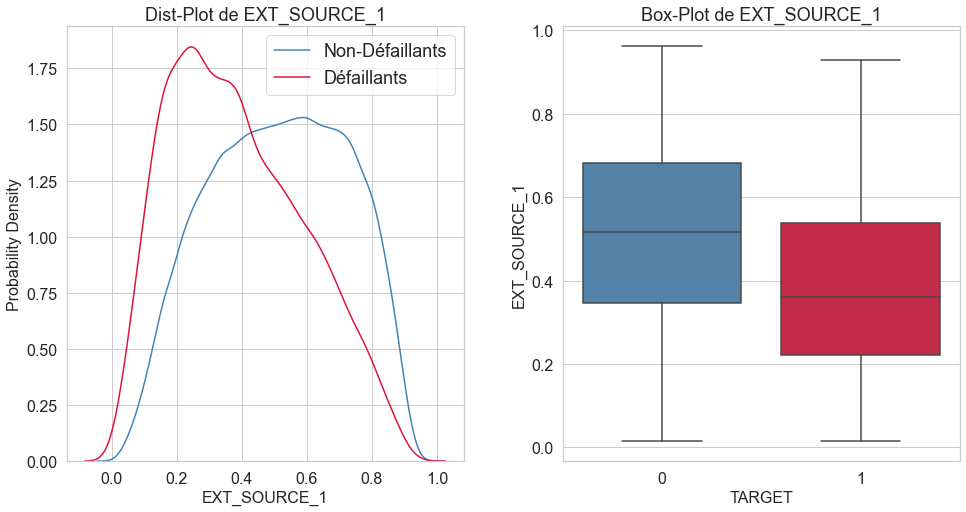

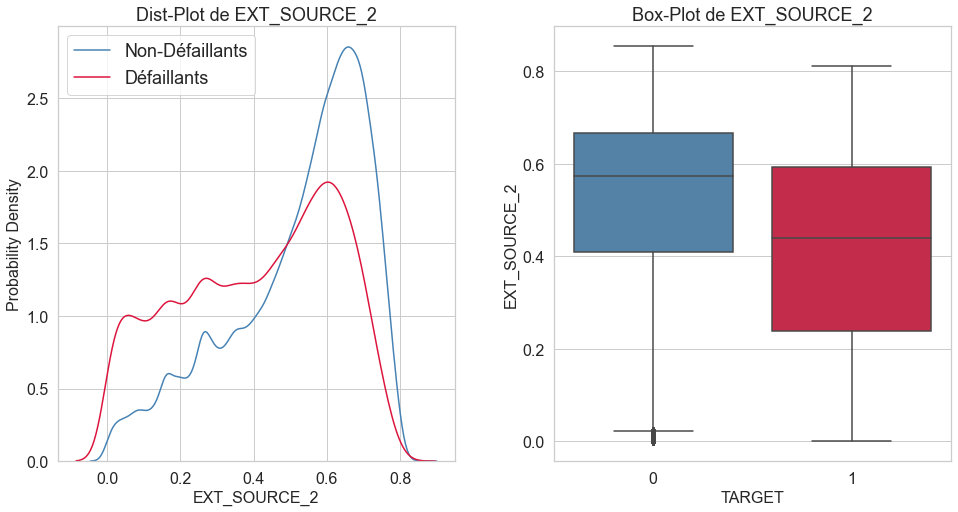

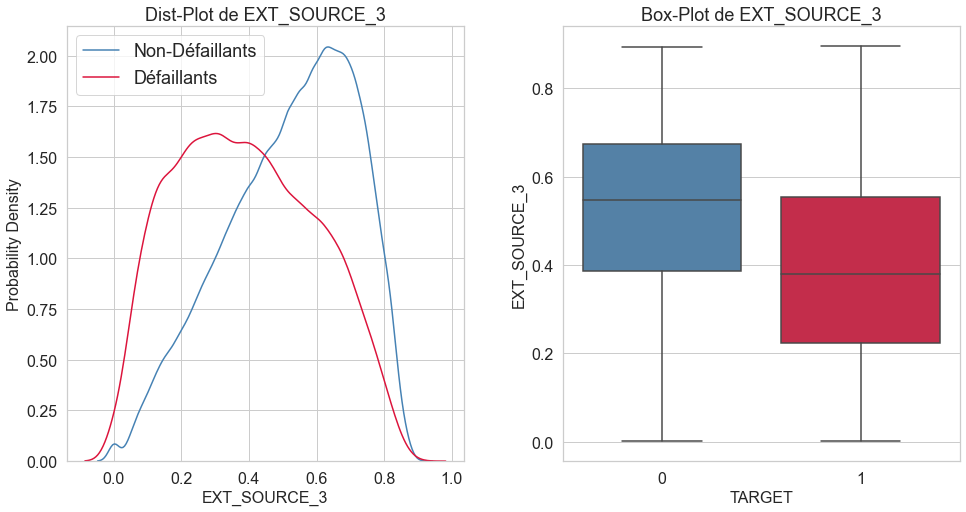

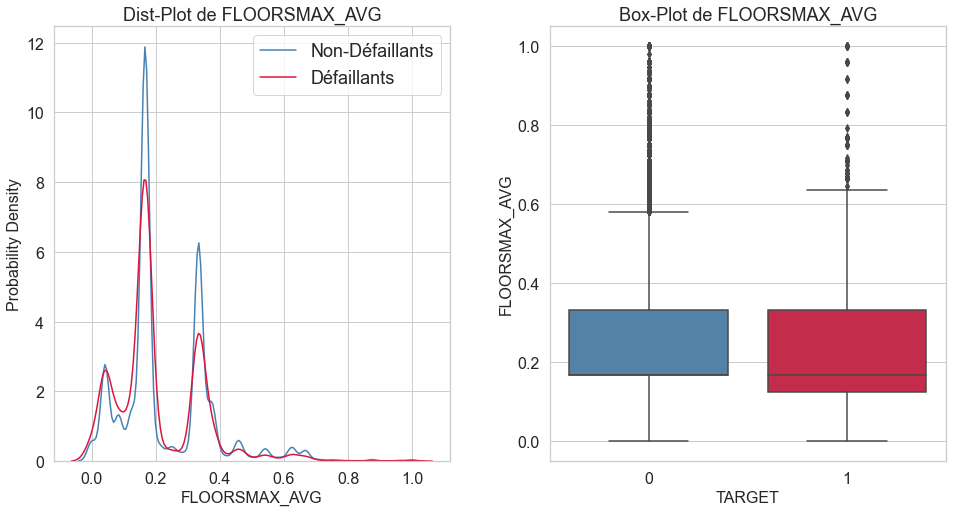

...

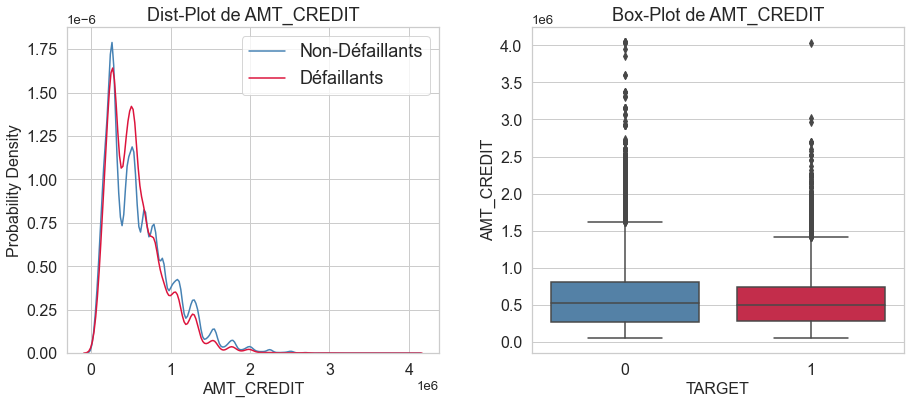

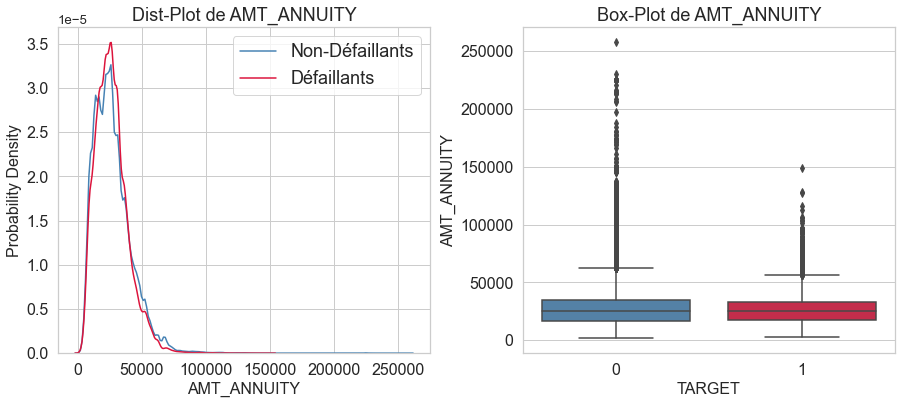

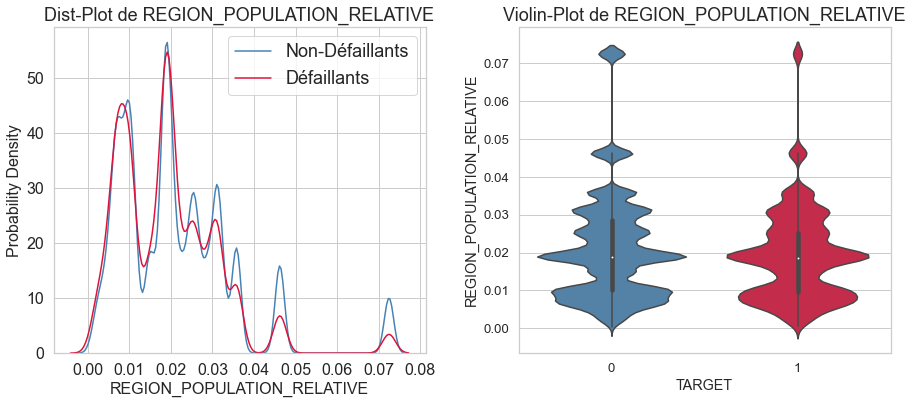

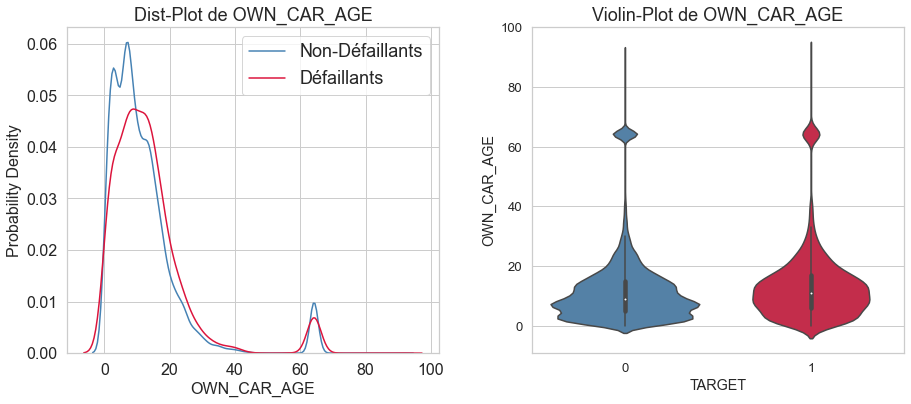

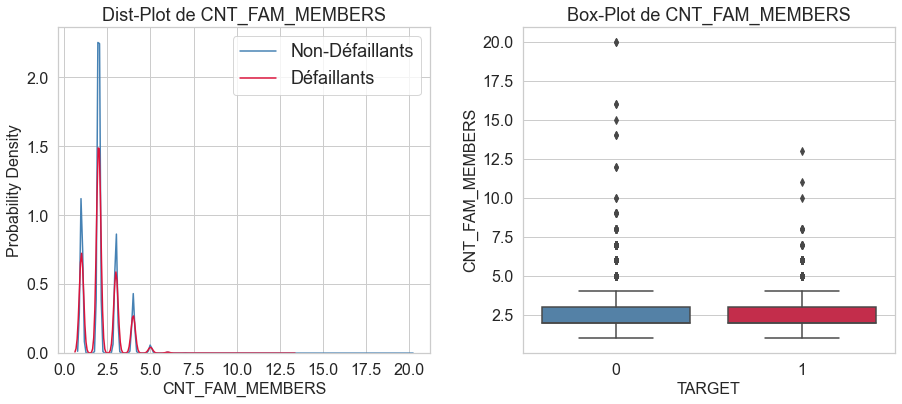

In [60]:
# combien de jours, à partir du jour de l'enregistrement, le demandeur a changé le document             
plot_continuous_variables(application_train, 'DAYS_ID_PUBLISH',plots=['distplot', 'box'],figsize=(15, 6))
# ?
plot_continuous_variables(application_train, 'EXT_SOURCE_1', plots=['distplot', 'box'],figsize=(16, 8))
plot_continuous_variables(application_train, 'EXT_SOURCE_2', plots=['distplot', 'box'],figsize=(16, 8))
plot_continuous_variables(application_train, 'EXT_SOURCE_3', plots=['distplot', 'box'],figsize=(16, 8))
# Nbre max d'étage
plot_continuous_variables(application_train, 'FLOORSMAX_AVG', plots=['distplot', 'box'],figsize=(16, 8))
plot_continuous_variables(application_train, 'FLOORSMAX_MEDI', plots=['distplot', 'box'],figsize=(16, 8))
plot_continuous_variables(application_train, 'FLOORSMAX_MODE', plots=['distplot', 'box'],figsize=(16, 8))
plot_continuous_variables(application_train, 'FLOORSMIN_MODE', plots=['distplot', 'box'],figsize=(16, 8))
plot_continuous_variables(application_train, 'FLOORSMIN_AVG', plots=['distplot', 'box'],figsize=(16, 8))
plot_continuous_variables(application_train, 'FLOORSMIN_MEDI', plots=['distplot', 'box'],figsize=(16, 8))
# prix du bien sur demande précedente
plot_continuous_variables(application_train, 'AMT_GOODS_PRICE', plots=['distplot', 'violin'],figsize=(16, 8))
# nbre enfants
plot_continuous_variables(application_train, 'CNT_CHILDREN', plots=['distplot', 'violin'],figsize=(16, 8))
# revenu demandeur
plot_continuous_variables(application_train, 'AMT_INCOME_TOTAL', plots=['distplot', 'box'], scale_limits=[0, 33e3])
# montant credit
plot_continuous_variables(application_train, 'AMT_CREDIT',plots=['distplot', 'box'],figsize=(15, 6))
#annuité
plot_continuous_variables(application_train, 'AMT_ANNUITY',plots=['distplot', 'box'], figsize=(15, 6)) 
# densité ville d'habitation du demandeur 
plot_continuous_variables(application_train, 'REGION_POPULATION_RELATIVE', plots=['distplot', 'violin'], figsize=(15, 6))
# age voiture demandeur
plot_continuous_variables(application_train, 'OWN_CAR_AGE', plots=['distplot', 'violin'],figsize=(15, 6))
# composition famille
plot_continuous_variables(application_train,'CNT_FAM_MEMBERS', plots=['distplot', 'box'], figsize=(15, 6))
                          

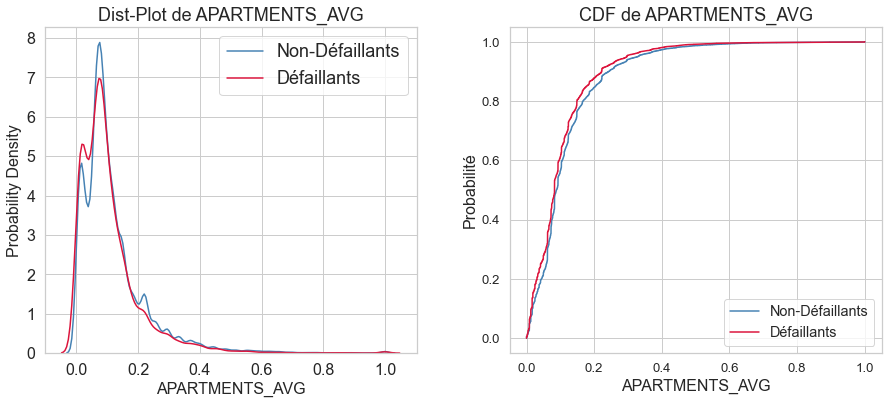

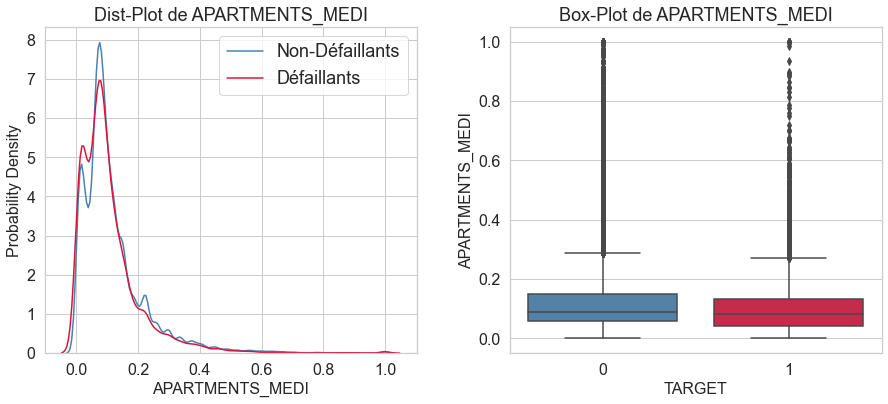

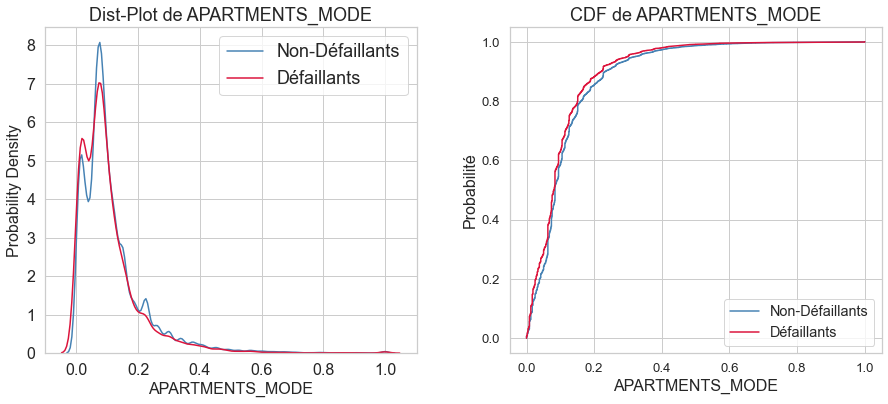

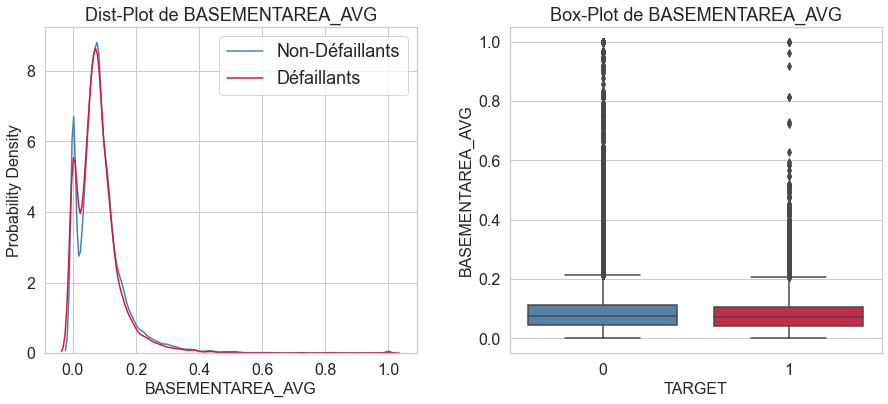

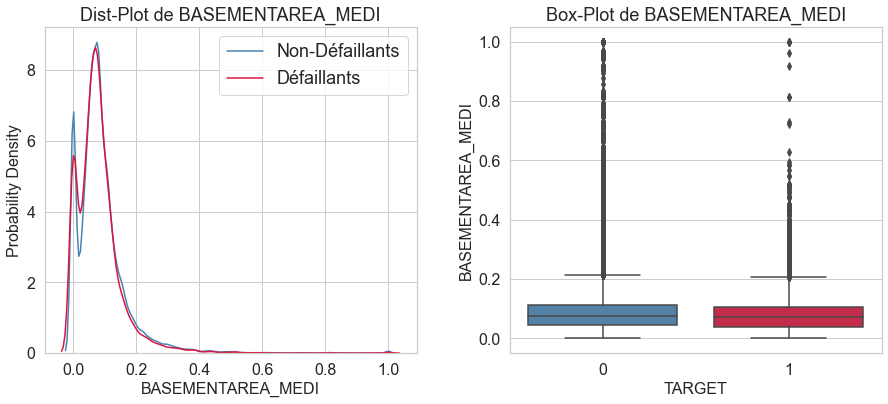

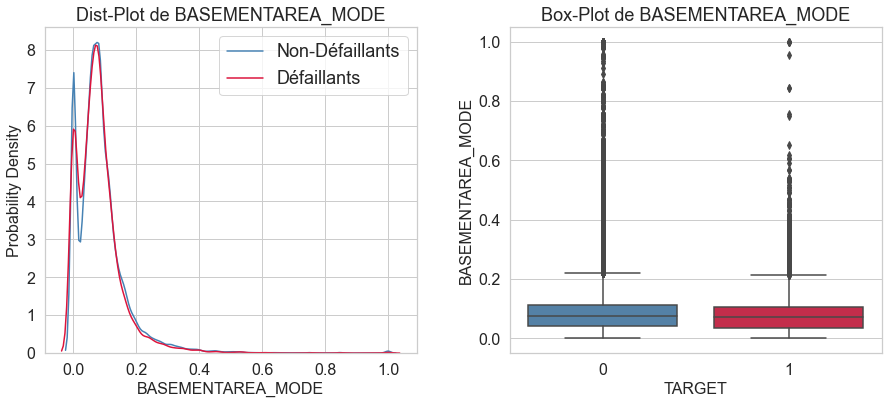

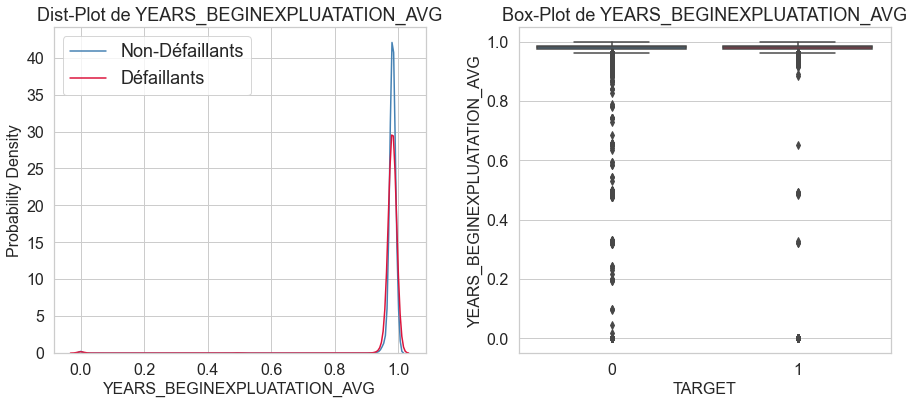

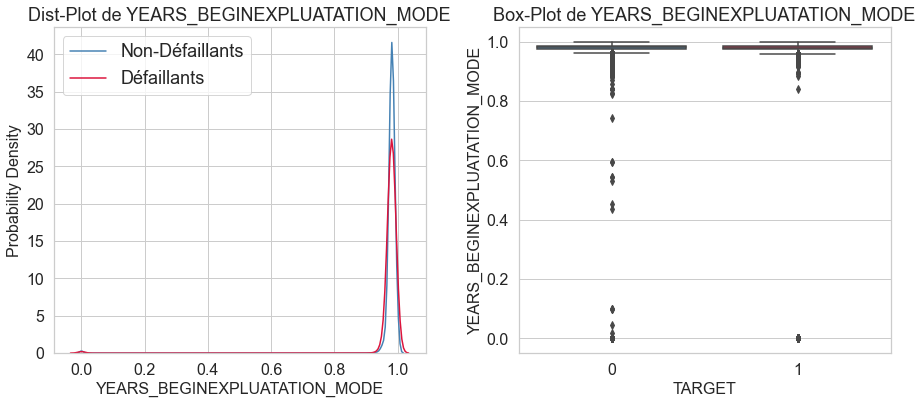

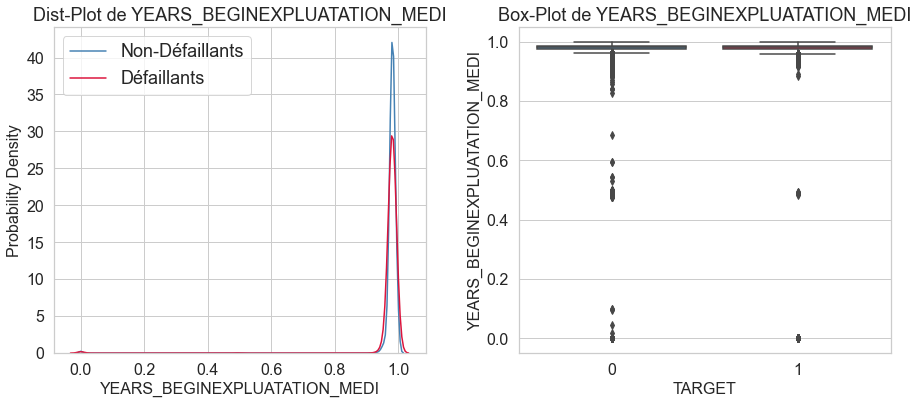

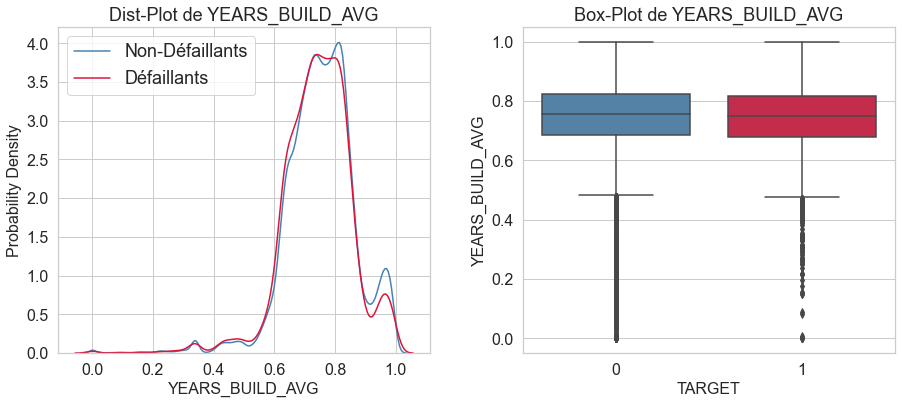

In [61]:
# taille appartement
plot_continuous_variables(application_train, 'APARTMENTS_AVG', plots=['distplot', 'CDF'],figsize=(15, 6))
plot_continuous_variables(application_train, 'APARTMENTS_MEDI', plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train, 'APARTMENTS_MODE', plots=['distplot', 'CDF'],figsize=(15, 6))
# Taille immeuble
plot_continuous_variables(application_train, 'BASEMENTAREA_AVG', plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train, 'BASEMENTAREA_MEDI', plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train, 'BASEMENTAREA_MODE', plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train, 'YEARS_BEGINEXPLUATATION_AVG', plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train, 'YEARS_BEGINEXPLUATATION_MODE', plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train, 'YEARS_BEGINEXPLUATATION_MEDI', plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train, 'YEARS_BUILD_AVG', plots=['distplot', 'box'],figsize=(15, 6))


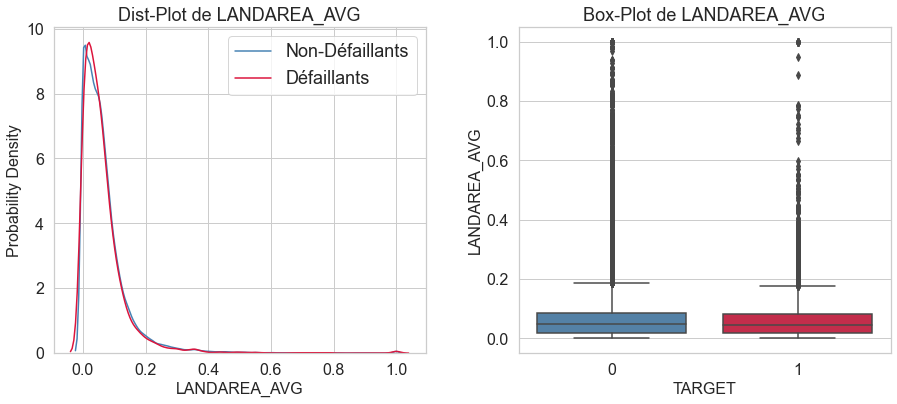

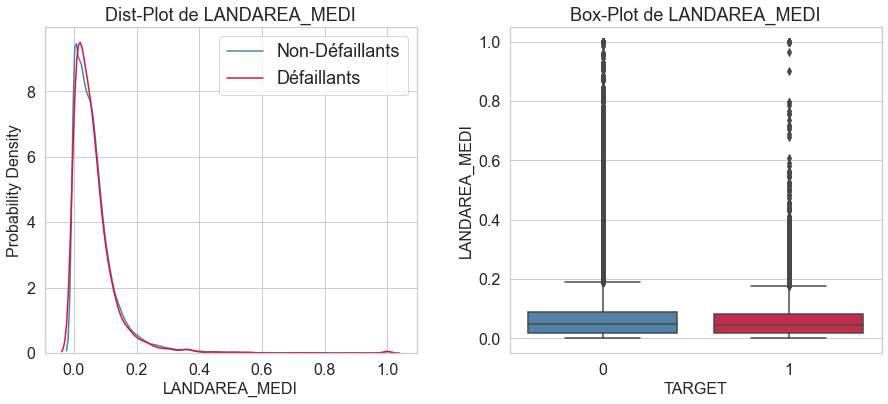

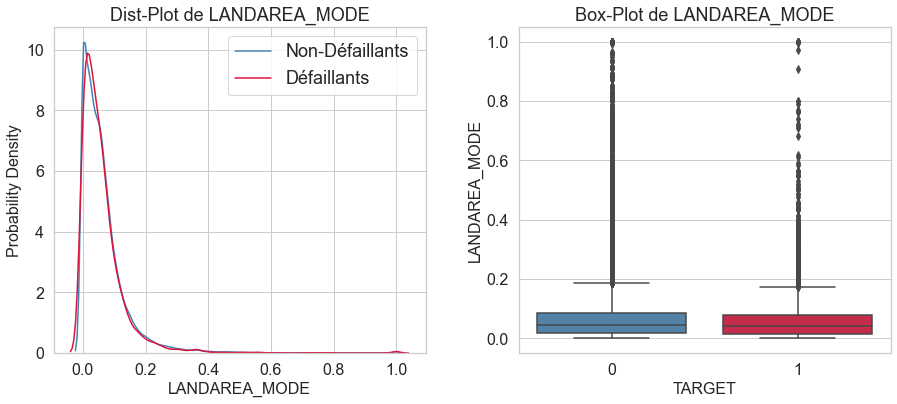

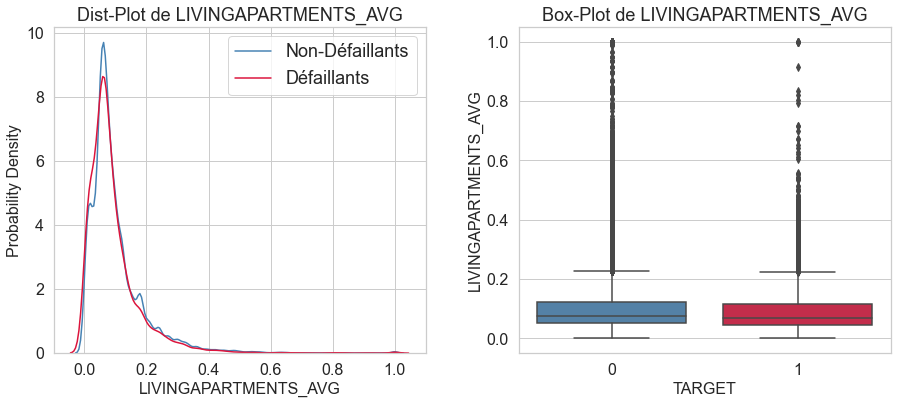

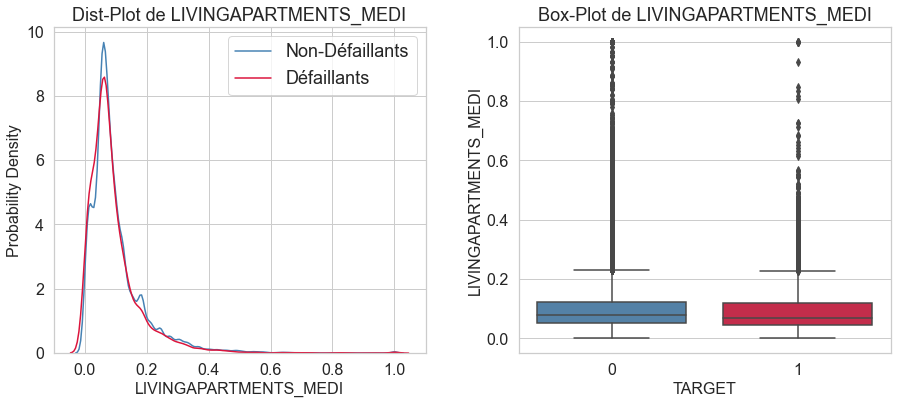

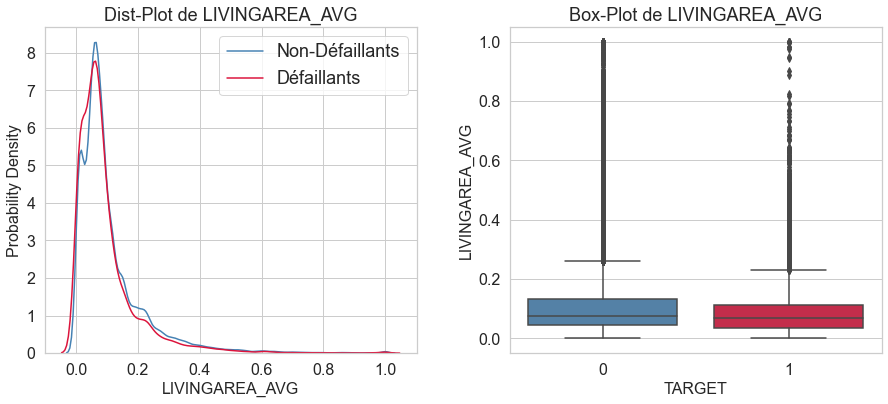

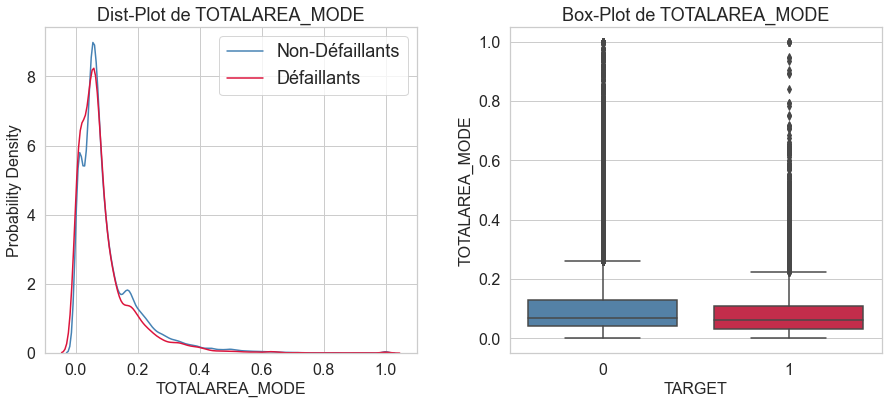

In [62]:
# Info sur la surface...
plot_continuous_variables(application_train,'LANDAREA_AVG',plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train,'LANDAREA_MEDI',plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train,'LANDAREA_MODE',plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train,'LIVINGAPARTMENTS_AVG',plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train,'LIVINGAPARTMENTS_MEDI',plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train,'LIVINGAREA_AVG',plots=['distplot', 'box'],figsize=(15, 6))
plot_continuous_variables(application_train,'TOTALAREA_MODE',plots=['distplot', 'box'],figsize=(15, 6))

### CORRELATIONS ENTRE VARIABLES CATEGORIELLES

In [63]:
categorical_columns = ['TARGET', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
                       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
                       'FLAG_EMAIL', 'REGION_RATING_CLIENT',
                       'REGION_RATING_CLIENT_W_CITY',
                       'REG_REGION_NOT_LIVE_REGION',
                       'REG_REGION_NOT_WORK_REGION',
                       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
                       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY'] \
    + ['FLAG_DOCUMENT_' + str(i) for i in range(2, 22)] \
    + application_train.dtypes[application_train.dtypes == 'object'] .index.tolist()

In [64]:
!pip install phik

In [65]:
import phik

In [66]:
def plot_phik_matrix(data, categorical_columns, figsize=(20, 20),
                     mask_upper=True, tight_layout=True, linewidth=0.1,
                     fontsize=10, cmap='Blues', show_target_top_corr=True,
                     target_top_columns=10):
    '''
    Function to Phi_k matrix for categorical features
    Nous allons tracer une carte thermique des valeurs du coefficient de
    corrélation Phi-K entre les 2 variables.
    Le coefficient Phi-K est similaire au coefficient de corrélation sauf
    qu'il peut être utilisé avec une paire de caractéristiques catégorielles
    pour vérifier si une varaible montre une sorte d'association avec l'autre
    variable catégorielle. Sa valeur maximale peut être de 1, ce qui indique
    une association maximale entre deux variables catégorielles.
    Inputs:
        data: DataFrame
            The DataFrame from which to build correlation matrix
        categorical_columns: list
            List of categorical columns whose PhiK values are to be plotted
        figsize: tuple, default = (25,23)
            Size of the figure to be plotted
        mask_upper: bool, default = True
            Whether to plot only the lower triangle of heatmap or plot full.
        tight_layout: bool, default = True
            Whether to keep tight layout or not
        linewidth: float/int, default = 0.1
            The linewidth to use for heatmap
        fontsize: int, default = 10
            The font size for the X and Y tick labels
        cmap: str, default = 'Blues'
            The colormap to be used for heatmap
        show_target_top_corr: bool, default = True
            Whether to show top/highly correlated features with Target.
        target_top_columns: int, default = 10
            The number of top correlated features with target to display
    '''
    # first fetching only the categorical features
    data_for_phik = data[categorical_columns].astype('object')
    phik_matrix = data_for_phik.phik_matrix()

    print('-' * 79)

    if mask_upper:
        mask_array = np.ones(phik_matrix.shape)
        mask_array = np.triu(mask_array)
    else:
        mask_array = np.zeros(phik_matrix.shape)

    plt.figure(figsize=figsize, tight_layout=tight_layout)
    sns.heatmap(
        phik_matrix,
        annot=False,
        mask=mask_array,
        linewidth=linewidth,
        cmap=cmap)
    plt.xticks(rotation=90, fontsize=fontsize)
    plt.yticks(rotation=0, fontsize=fontsize)
    plt.title("Phi-K Correlation Heatmap des variables catégorielles",
              fontsize=fontsize+4)
    plt.show()
    
    print("-" * 79)

    if show_target_top_corr:
        # Seeing the top columns with highest correlation with the target
        # variable in application_train
        print("Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :")
        phik_df = pd.DataFrame(
            {'Variable': phik_matrix.TARGET.index[1:], 'Phik-Correlation': phik_matrix.TARGET.values[1:]})
        phik_df = phik_df.sort_values(by='Phik-Correlation', ascending=False)
        display(phik_df.head(target_top_columns).style.hide_index())
        print("-" * 79)

-------------------------------------------------------------------------------


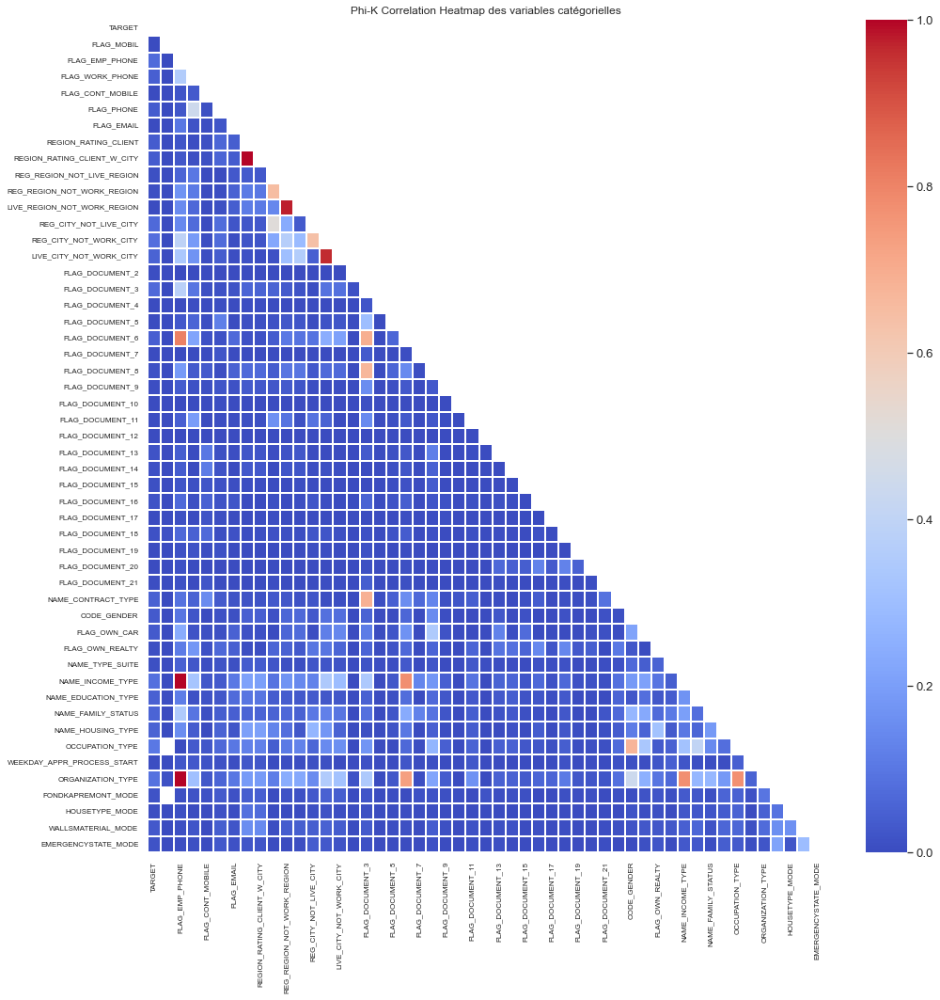

-------------------------------------------------------------------------------
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
OCCUPATION_TYPE,0.102846
ORGANIZATION_TYPE,0.089164
NAME_INCOME_TYPE,0.084831
REG_CITY_NOT_WORK_CITY,0.079946
FLAG_EMP_PHONE,0.072087
REG_CITY_NOT_LIVE_CITY,0.069588
FLAG_DOCUMENT_3,0.069525
NAME_FAMILY_STATUS,0.056043
NAME_HOUSING_TYPE,0.051107
LIVE_CITY_NOT_WORK_CITY,0.050956


-------------------------------------------------------------------------------


In [67]:
plot_phik_matrix(application_train, categorical_columns,figsize=(15, 15), fontsize=8, cmap='coolwarm')

### CORRELATIONS ENTRE LES VARIABLES QUANTITATIVES 

In [68]:
columns_to_drop = ['SK_ID_CURR'] + list(set(categorical_columns) - set(['TARGET']))

In [69]:
class correlation_matrix:
    '''
    Class to plot heatmap of Correlation Matrix and print Top Correlated Features with Target.
    Contains three methods:
        1. init method
        2. plot_correlation_matrix method
        3. target_top_corr method
    '''

    def __init__(
            self,
            data,
            columns_to_drop,
            figsize=(
                25,
                23),
            mask_upper=True,
            tight_layout=True,
            linewidth=0.1,
            fontsize=10,
            cmap='Blues'):
        '''
        Function to initialize the class members.
        Inputs:
            data: DataFrame
                The DataFrame from which to build correlation matrix
            columns_to_drop: list
                Columns which have to be dropped while building the correlation matrix (for example the Loan ID)
            figsize: tuple, default = (25,23)
                Size of the figure to be plotted
            mask_upper: bool, default = True
                Whether to plot only the lower triangle of heatmap or plot full.
            tight_layout: bool, default = True
                Whether to keep tight layout or not
            linewidth: float/int, default = 0.1
                The linewidth to use for heatmap
            fontsize: int, default = 10
                The font size for the X and Y tick labels
            cmap: str, default = 'Blues'
                The colormap to be used for heatmap
        Returns:
            None
        '''

        self.data = data
        self.columns_to_drop = columns_to_drop
        self.figsize = figsize
        self.mask_upper = mask_upper
        self.tight_layout = tight_layout
        self.linewidth = linewidth
        self.fontsize = fontsize
        self.cmap = cmap

    def plot_correlation_matrix(self):
        '''
        Function to plot the Correlation Matrix Heatmap
        Inputs:
            self
        Returns:
            None
        '''

        # print('-' * 79)
        # building the correlation dataframe
        self.corr_data = self.data.drop(
            self.columns_to_drop + ['TARGET'], axis=1).corr()

        if self.mask_upper:
            # masking the heatmap to show only lower triangle. This is to save
            # the RAM.
            mask_array = np.ones(self.corr_data.shape)
            mask_array = np.triu(mask_array)
        else:
            mask_array = np.zeros(self.corr_data.shape)

        plt.figure(figsize=self.figsize, tight_layout=self.tight_layout)
        sns.heatmap(
            self.corr_data,
            annot=False,
            mask=mask_array,
            linewidth=self.linewidth,
            cmap=self.cmap)
        plt.xticks(rotation=90, fontsize=self.fontsize)
        plt.yticks(fontsize=self.fontsize)
        plt.title("Heatmap de corrélation des variables numériques", fontsize=20)
        plt.show()
        # print("-" * 100)

    def target_top_corr(self, target_top_columns=10):
        '''
        Function to return the Top Correlated features with the Target
        Inputs:
            self
            target_top_columns: int, default = 10
                The number of top correlated features with target to display
        Returns:
            Top correlated features DataFrame.
        '''

        phik_target_arr = np.zeros(self.corr_data.shape[1])
        # calculating the Phik-Correlation with Target
        for index, column in enumerate(self.corr_data.columns):
            phik_target_arr[index] = self.data[[
                'TARGET', column]].phik_matrix().iloc[0, 1]
        # getting the top correlated columns and their values
        top_corr_target_df = pd.DataFrame(
            {'Column Name': self.corr_data.columns, 'Phik-Correlation': phik_target_arr})
        top_corr_target_df = top_corr_target_df.sort_values(
            by='Phik-Correlation', ascending=False)

        return top_corr_target_df.iloc[:target_top_columns]


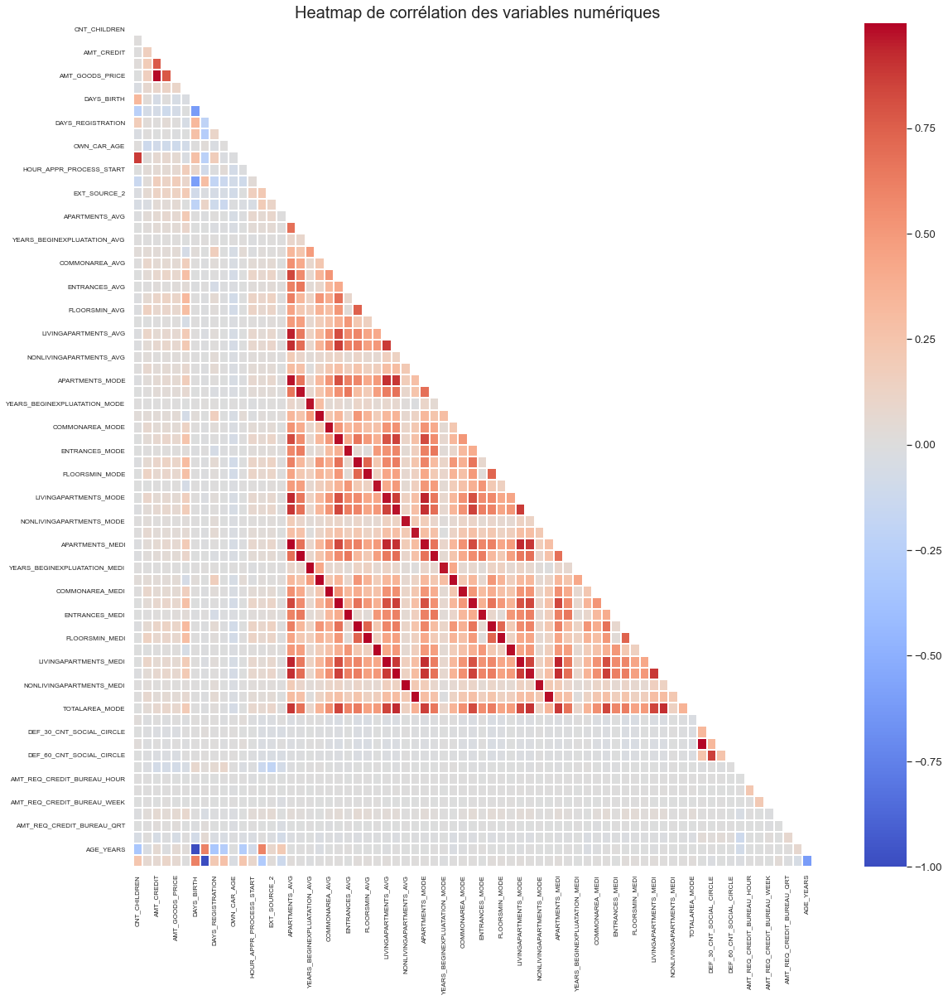

In [70]:
corr_mat =correlation_matrix(application_train, columns_to_drop, figsize=(17, 17), fontsize=8, cmap='coolwarm')
corr_mat.plot_correlation_matrix()

In [71]:
# Voir les colonnes supérieures avec la plus haute corrélation phik avec
# la variable cible dans la table application_train
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print("-"*79)

interval columns not set, guessing: ['TARGET', 'CNT_CHILDREN']
interval columns not set, guessing: ['TARGET', 'AMT_INCOME_TOTAL']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_GOODS_PRICE']
interval columns not set, guessing: ['TARGET', 'REGION_POPULATION_RELATIVE']
interval columns not set, guessing: ['TARGET', 'DAYS_BIRTH']
interval columns not set, guessing: ['TARGET', 'DAYS_EMPLOYED']
interval columns not set, guessing: ['TARGET', 'DAYS_REGISTRATION']
interval columns not set, guessing: ['TARGET', 'DAYS_ID_PUBLISH']
interval columns not set, guessing: ['TARGET', 'OWN_CAR_AGE']
interval columns not set, guessing: ['TARGET', 'CNT_FAM_MEMBERS']
interval columns not set, guessing: ['TARGET', 'HOUR_APPR_PROCESS_START']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_1']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_2']
interval columns 

Column Name,Phik-Correlation
EXT_SOURCE_3,0.247680
EXT_SOURCE_1,0.217846
EXT_SOURCE_2,0.213965
AGE_YEARS,0.102380
DAYS_BIRTH,0.102378
DAYS_LAST_PHONE_CHANGE,0.073218
DAYS_EMPLOYED,0.072095
DAYS_ID_PUBLISH,0.067766
AMT_GOODS_PRICE,0.059094
FLOORSMAX_AVG,0.058826


-------------------------------------------------------------------------------


## 2-Fichier application_test.csv

In [72]:
df_var_appli_test = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'application_{train|test}.csv']
df_var_appli_test.style.hide_index()

Table,Row,Description,Special
application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,nan
application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",nan
application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,nan
application_{train|test}.csv,CODE_GENDER,Gender of the client,nan
application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,nan
application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,nan
application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,nan
application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,nan
application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,nan
application_{train|test}.csv,AMT_ANNUITY,Loan annuity,nan


In [73]:
description_variables(application_test)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
type,int64,object,object,object,object,int64,float64,float64,float64,float64,...,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,0.0,...,0.0,0.0,0.0,0.0,6049.0,6049.0,6049.0,6049.0,6049.0,6049.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000407,0.0,...,0.0,0.0,0.0,0.0,0.10256,0.10256,0.10256,0.10256,0.10256,0.10256
count,48744.0,48744,48744,48744,48744,48744.0,48744.0,48744.0,48720.0,48744.0,...,48744.0,48744.0,48744.0,48744.0,42695.0,42695.0,42695.0,42695.0,42695.0,42695.0
unique,NaN,2,2,2,2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,48305,32678,32311,33658,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,277796.67635,NaN,NaN,NaN,NaN,0.397054,178431.805855,516740.435561,29426.240209,462618.840473,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,NaN,NaN,NaN,NaN,0.709047,101522.591536,365397.004174,16016.368315,336710.21504,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.0,NaN,NaN,NaN,NaN,0.0,26941.5,45000.0,2295.0,45000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Valeurs manquantes : 1404419 NaN pour 5898024 données (23.81 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MODE,33495,68.720000
COMMONAREA_MEDI,33495,68.720000
COMMONAREA_AVG,33495,68.720000
NONLIVINGAPARTMENTS_MEDI,33347,68.410000
NONLIVINGAPARTMENTS_AVG,33347,68.410000
NONLIVINGAPARTMENTS_MODE,33347,68.410000
FONDKAPREMONT_MODE,32797,67.280000
LIVINGAPARTMENTS_MODE,32780,67.250000
LIVINGAPARTMENTS_MEDI,32780,67.250000
LIVINGAPARTMENTS_AVG,32780,67.250000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


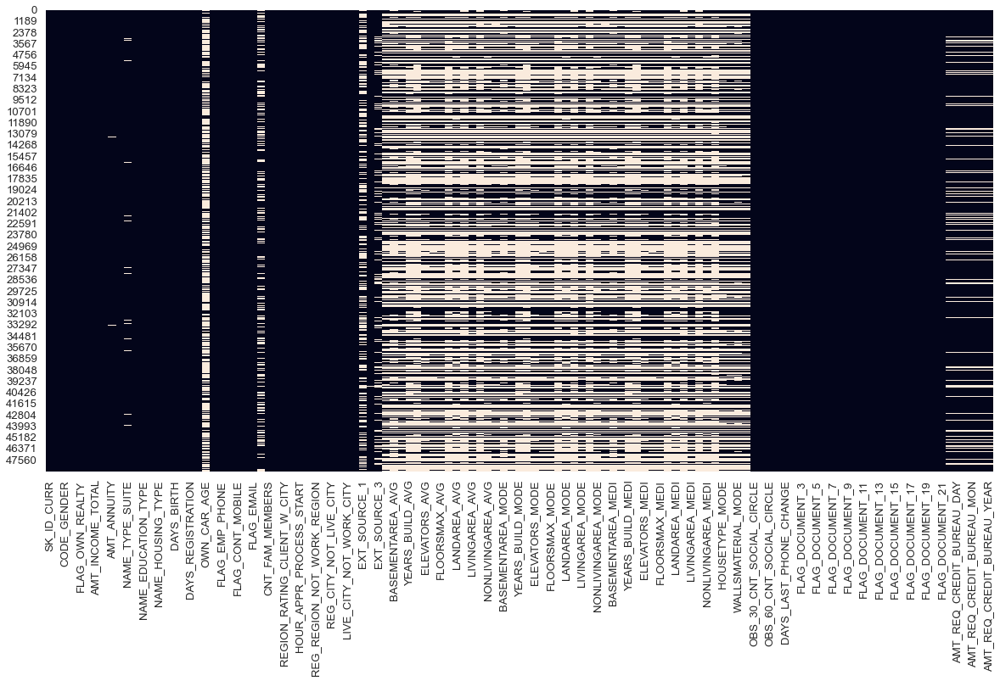

In [74]:
get_missing_values(application_test, True, True)

Nombre de variables avec valeurs manquantes : 64


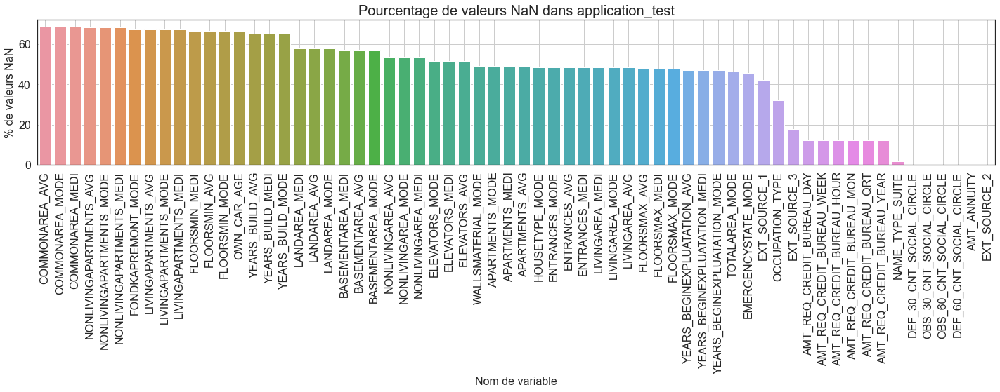

In [75]:
# Réprésentation visuelle des valeurs manquantes
df_nan_test = nan_df_create(application_test)
plot_nan_percent(df_nan_test, 'application_test',
                                      grid=True)

## 3- Fichier bureau.csv

In [76]:
df_var_bureau = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'bureau.csv']
df_var_bureau.style.hide_index()

Table,Row,Description,Special
bureau.csv,SK_ID_CURR,"ID of loan in our sample - one loan in our sample can have 0,1,2 or more related previous credits in credit bureau",hashed
bureau.csv,SK_BUREAU_ID,Recoded ID of previous Credit Bureau credit related to our loan (unique coding for each loan application),hashed
bureau.csv,CREDIT_ACTIVE,Status of the Credit Bureau (CB) reported credits,nan
bureau.csv,CREDIT_CURRENCY,Recoded currency of the Credit Bureau credit,recoded
bureau.csv,DAYS_CREDIT,How many days before current application did client apply for Credit Bureau credit,time only relative to the application
bureau.csv,CREDIT_DAY_OVERDUE,Number of days past due on CB credit at the time of application for related loan in our sample,nan
bureau.csv,DAYS_CREDIT_ENDDATE,Remaining duration of CB credit (in days) at the time of application in Home Credit,time only relative to the application
bureau.csv,DAYS_ENDDATE_FACT,Days since CB credit ended at the time of application in Home Credit (only for closed credit),time only relative to the application
bureau.csv,AMT_CREDIT_MAX_OVERDUE,Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample),nan
bureau.csv,CNT_CREDIT_PROLONG,How many times was the Credit Bureau credit prolonged,nan


In [77]:
description_variables(bureau)

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
type,int64,int64,object,object,int64,int64,float64,float64,float64,int64,float64,float64,float64,float64,object,int64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,105553.0,633653.0,1124488.0,0.0,13.0,257669.0,591780.0,0.0,0.0,0.0,1226791.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.36174,2.171586,3.853721,0.0,0.000045,0.883055,2.028083,0.0,0.0,0.0,4.204323
count,1716428.0,1716428.0,1716428,1716428,1716428.0,1716428.0,1610875.0,1082775.0,591940.0,1716428.0,1716415.0,1458759.0,1124648.0,1716428.0,1716428,1716428.0,489637.0
unique,NaN,NaN,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,NaN,NaN
top,NaN,NaN,Closed,currency 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer credit,NaN,NaN
freq,NaN,NaN,1079273,1715020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1251615,NaN,NaN
mean,278214.933645,5924434.489032,NaN,NaN,-1142.107685,0.818167,510.517362,-1017.437148,3825.417661,0.00641,354994.591918,137085.119952,6229.51498,37.912758,NaN,-593.74832,15712.7577
std,102938.558112,532265.728552,NaN,NaN,795.164928,36.544428,4994.219837,714.010626,206031.606207,0.096224,1149811.34398,677401.130952,45032.031476,5937.650035,NaN,720.747312,325826.949053
min,100001.0,5000000.0,NaN,NaN,-2922.0,0.0,-42060.0,-42023.0,0.0,0.0,0.0,-4705600.32,-586406.115,0.0,NaN,-41947.0,0.0


Valeurs manquantes : 3939947 NaN pour 29179276 données (13.5 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
AMT_ANNUITY,1226791,71.470000
AMT_CREDIT_MAX_OVERDUE,1124488,65.510000
DAYS_ENDDATE_FACT,633653,36.920000
AMT_CREDIT_SUM_LIMIT,591780,34.480000
AMT_CREDIT_SUM_DEBT,257669,15.010000
DAYS_CREDIT_ENDDATE,105553,6.150000
AMT_CREDIT_SUM,13,0.000000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


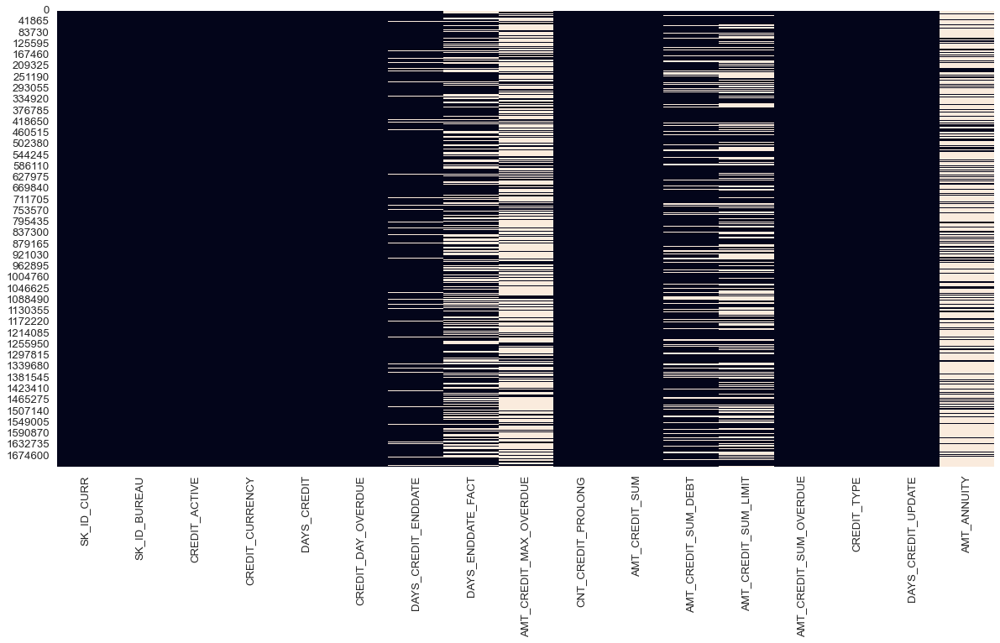

In [78]:
get_missing_values(bureau, True, True)

Nombre de variables avec valeurs manquantes : 7


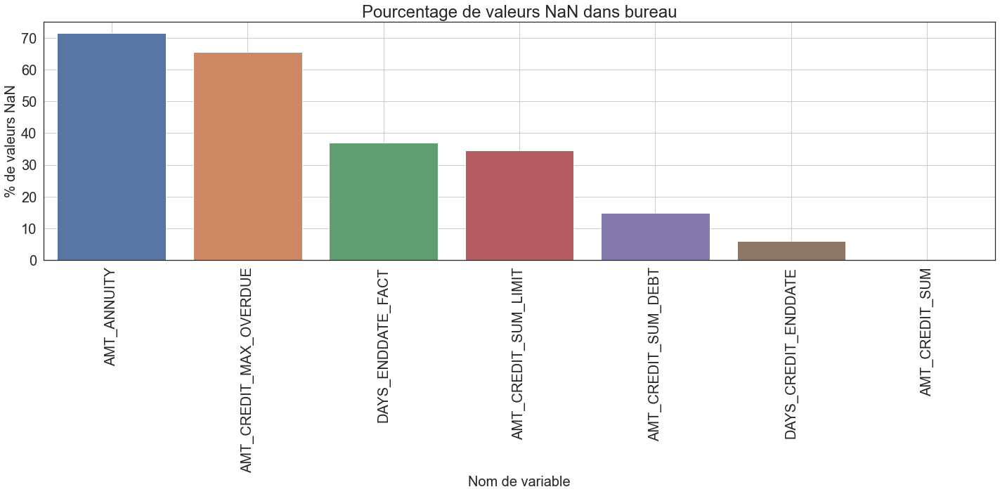

In [79]:
# Réprésentation visuelle des valeurs manquantes
df_nan_bureau =nan_df_create(bureau)
plot_nan_percent(df_nan_bureau, 'bureau',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

In [80]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants

print('Création dataframe de travail : merge TARGET avec dataframe bureau')
bureau_merged = application_train.iloc[:, :2].merge(bureau,
                                                    on='SK_ID_CURR',
                                                    how='left')

Création dataframe de travail : merge TARGET avec dataframe bureau


In [81]:
# Liste des variables qualitatives
cols_cat_bureau = \
    bureau.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_bureau

['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']

In [82]:
print_unique_categories(bureau_merged, 'CREDIT_ACTIVE',show_counts=True)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CREDIT_ACTIVE' sont :
['Closed' 'Active' nan 'Sold' 'Bad debt']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Closed      917733
Active      541919
Sold          5653
Bad debt        20
Name: CREDIT_ACTIVE, dtype: int64
-------------------------------------------------------------------------------


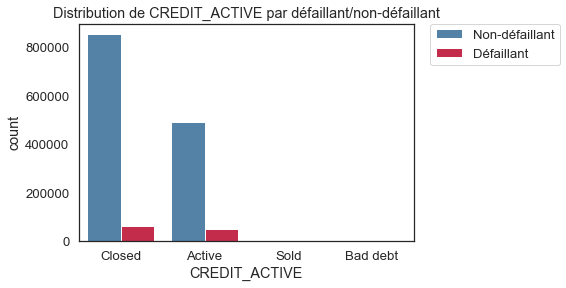

In [83]:
plot_barplot_comp_target(bureau_merged,'CREDIT_ACTIVE')

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CREDIT_CURRENCY' sont :
['currency 1' nan 'currency 2' 'currency 3' 'currency 4']
-------------------------------------------------------------------------------


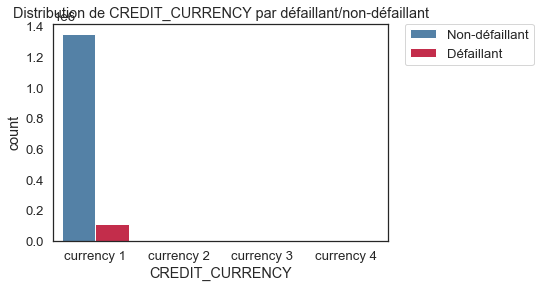

In [84]:
print_unique_categories(bureau_merged,'CREDIT_CURRENCY')
plot_barplot_comp_target(bureau_merged,'CREDIT_CURRENCY')

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CREDIT_TYPE' sont :
['Credit card' 'Consumer credit' nan 'Loan for business development'
 'Microloan' 'Mortgage' 'Car loan'
 'Loan for working capital replenishment' 'Another type of loan'
 'Unknown type of loan' 'Loan for the purchase of equipment'
 'Cash loan (non-earmarked)' 'Real estate loan' 'Interbank credit'
 'Loan for purchase of shares (margin lending)' 'Mobile operator loan']
-------------------------------------------------------------------------------


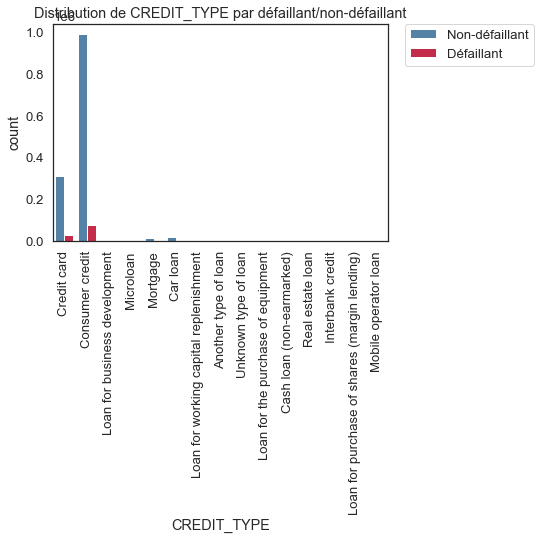

In [85]:
print_unique_categories(bureau_merged,'CREDIT_TYPE')
plot_barplot_comp_target(bureau_merged,'CREDIT_TYPE',rotation=90)

In [86]:
# Liste des variables quantitatives
cols_num_bureau = \
    bureau.select_dtypes(include=[np.number]).columns.to_list()
cols_num_bureau

['SK_ID_CURR',
 'SK_ID_BUREAU',
 'DAYS_CREDIT',
 'CREDIT_DAY_OVERDUE',
 'DAYS_CREDIT_ENDDATE',
 'DAYS_ENDDATE_FACT',
 'AMT_CREDIT_MAX_OVERDUE',
 'CNT_CREDIT_PROLONG',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_OVERDUE',
 'DAYS_CREDIT_UPDATE',
 'AMT_ANNUITY']

In [87]:
bureau_merged['YEARS_CREDIT'] = \
    bureau_merged['DAYS_CREDIT'] * -1 / 365

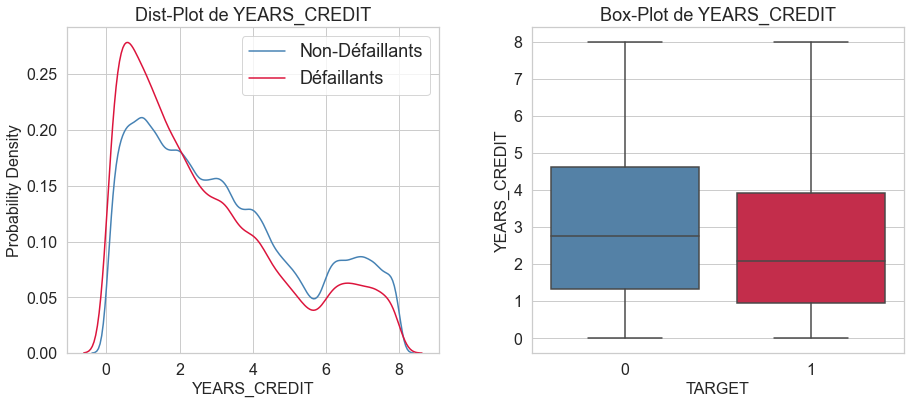

In [88]:
plot_continuous_variables(bureau_merged, 'YEARS_CREDIT', plots=['distplot', 'box'],figsize=(15, 6))


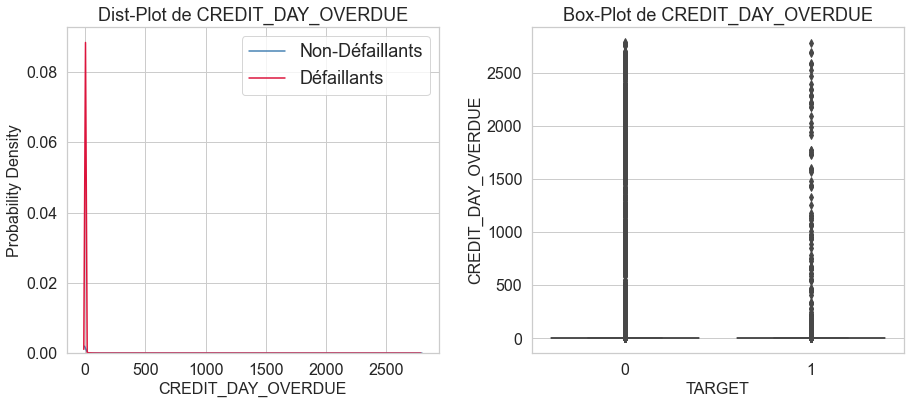

In [89]:
plot_continuous_variables(bureau_merged, 'CREDIT_DAY_OVERDUE', plots=['distplot', 'box'],figsize=(15, 6))


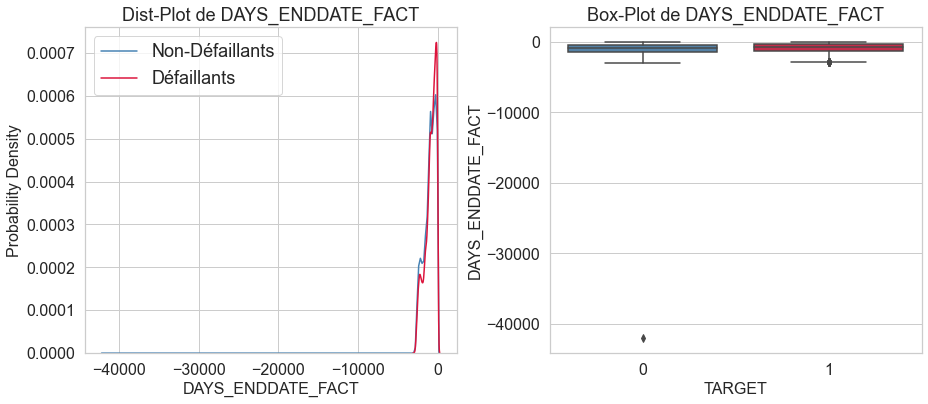

In [90]:
plot_continuous_variables(bureau_merged, 'DAYS_ENDDATE_FACT', plots=['distplot', 'box'],figsize=(15, 6))


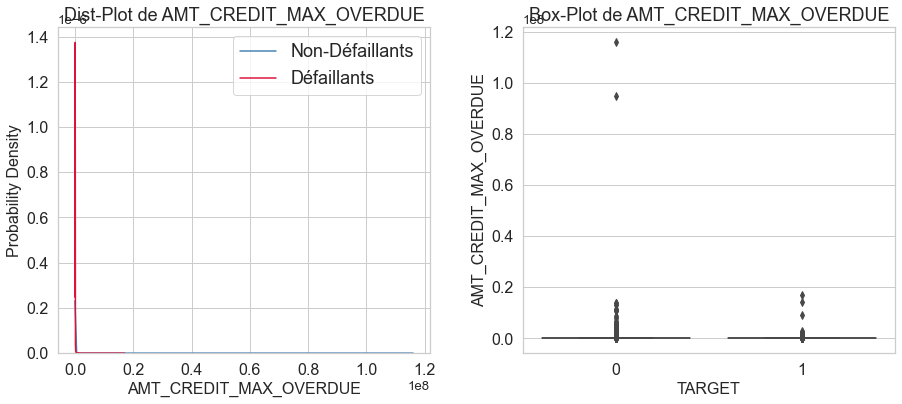

In [91]:
plot_continuous_variables(bureau_merged, 'AMT_CREDIT_MAX_OVERDUE', plots=['distplot', 'box'],figsize=(15, 6))



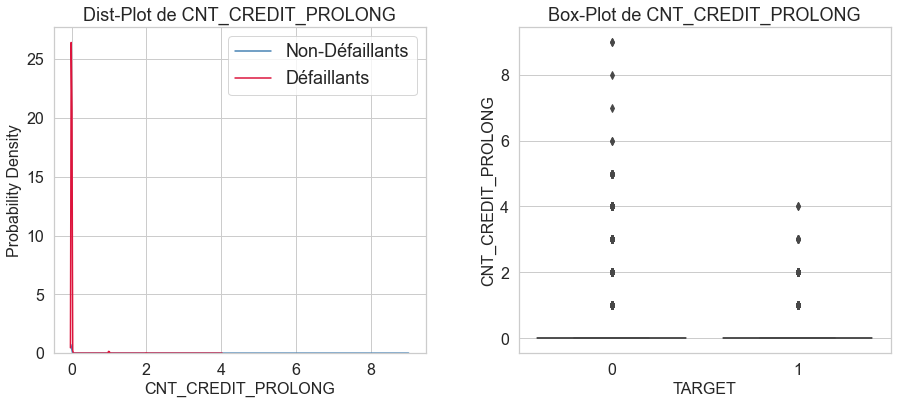

In [92]:
plot_continuous_variables(bureau_merged, 'CNT_CREDIT_PROLONG', plots=['distplot', 'box'],figsize=(15, 6))


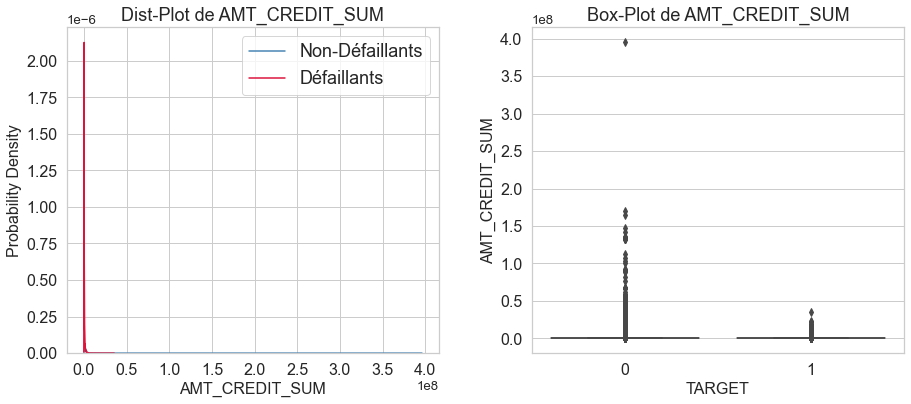

In [93]:
plot_continuous_variables(bureau_merged, 'AMT_CREDIT_SUM', plots=['distplot', 'box'],figsize=(15, 6))


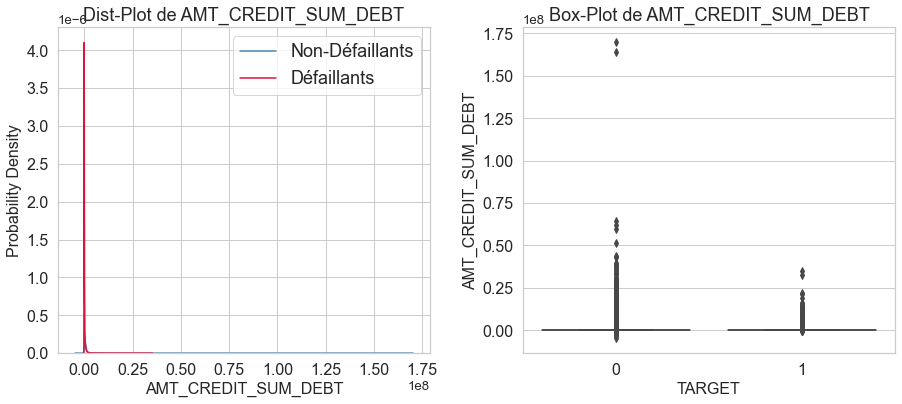

In [94]:
plot_continuous_variables(bureau_merged, 'AMT_CREDIT_SUM_DEBT', plots=['distplot','box'],figsize=(15, 6))


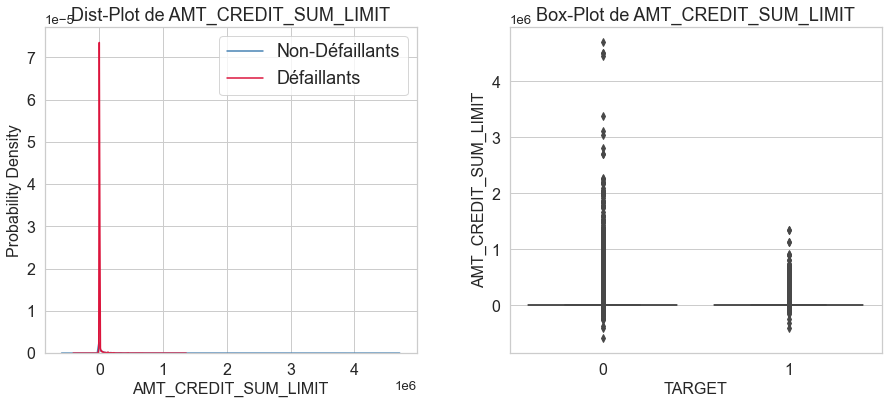

In [95]:
plot_continuous_variables(bureau_merged, 'AMT_CREDIT_SUM_LIMIT', plots=['distplot','box'],figsize=(15,6))


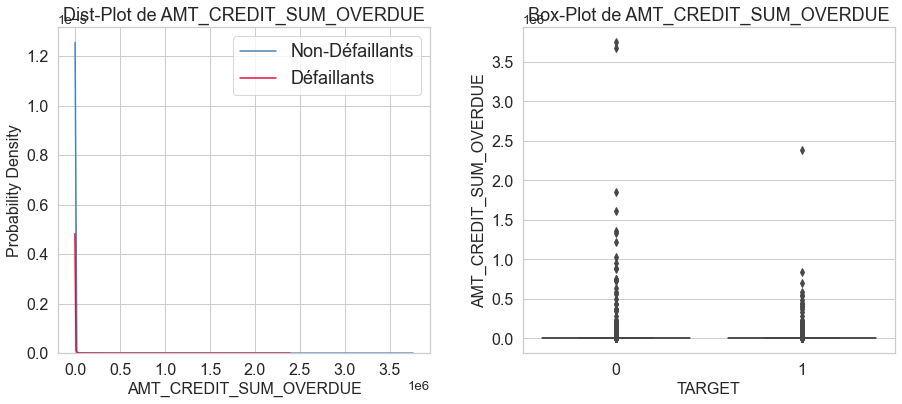

In [96]:
plot_continuous_variables(bureau_merged, 'AMT_CREDIT_SUM_OVERDUE', plots=['distplot','box'],figsize=(15, 6))                                                     


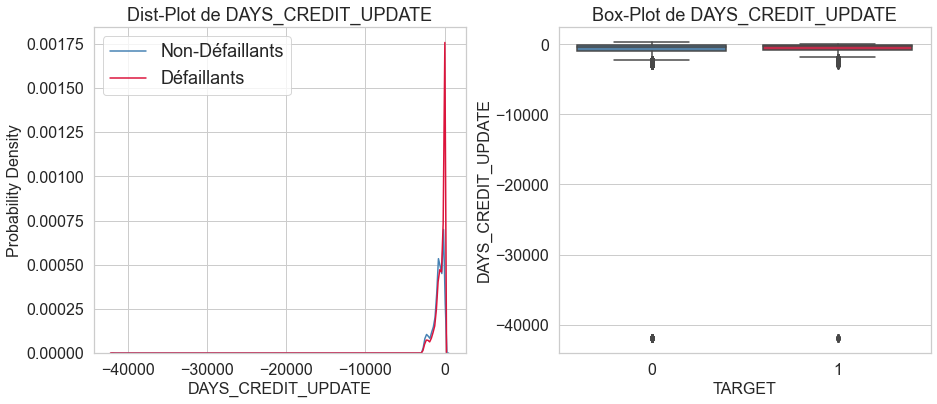

In [97]:
plot_continuous_variables(bureau_merged, 'DAYS_CREDIT_UPDATE', plots=['distplot', 'box'],figsize=(15, 6))


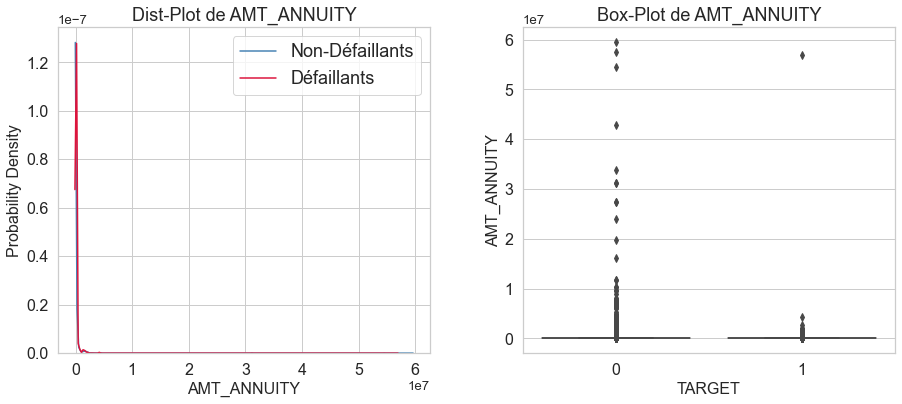

In [98]:
plot_continuous_variables(bureau_merged, 'AMT_ANNUITY', plots=['distplot', 'box'],figsize=(15, 6))

### CORRELATION VARIABLES CATEGORIELLES

-------------------------------------------------------------------------------


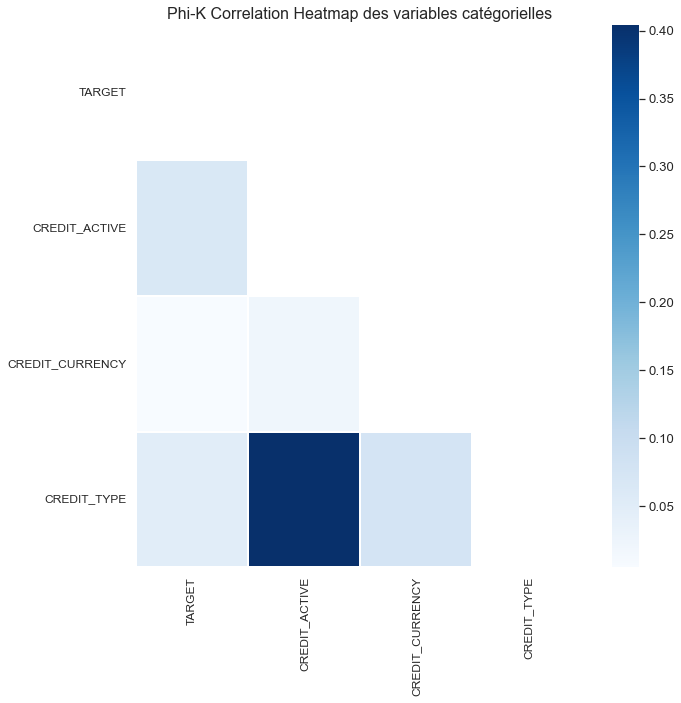

-------------------------------------------------------------------------------
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
CREDIT_ACTIVE,0.064481
CREDIT_TYPE,0.049954
CREDIT_CURRENCY,0.004993


-------------------------------------------------------------------------------


In [99]:
cols_for_phik = ['TARGET', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
                 'CREDIT_TYPE']
plot_phik_matrix(bureau_merged, cols_for_phik, figsize=(10, 10), fontsize=12)

### CORRELATION VARIABLES QUANTI

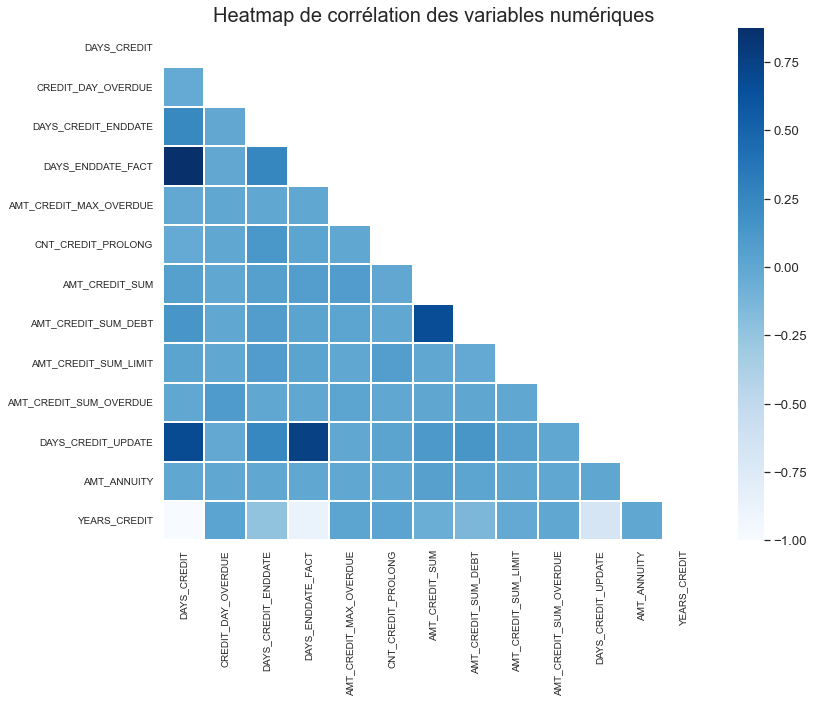

In [100]:
corr_mat = correlation_matrix(bureau_merged,
                                            ['SK_ID_CURR', 'SK_ID_BUREAU'],
                                            cmap='Blues',
                                            figsize=(12, 10))
corr_mat.plot_correlation_matrix()

In [101]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()

titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())


interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT']
interval columns not set, guessing: ['TARGET', 'CREDIT_DAY_OVERDUE']
interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT_ENDDATE']
interval columns not set, guessing: ['TARGET', 'DAYS_ENDDATE_FACT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_MAX_OVERDUE']
interval columns not set, guessing: ['TARGET', 'CNT_CREDIT_PROLONG']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_DEBT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_LIMIT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_OVERDUE']
interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT_UPDATE']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'YEARS_CREDIT']
Les variables ayant les valeurs les plus élevées de Phik-corrélation avec la variable cible sont les suivantes :


Column Name,Phik-Correlation
DAYS_CREDIT,0.088651
YEARS_CREDIT,0.088649
DAYS_CREDIT_ENDDATE,0.018980
AMT_CREDIT_SUM_OVERDUE,0.005654
AMT_CREDIT_SUM_LIMIT,0.005192
AMT_CREDIT_MAX_OVERDUE,0.004280
CNT_CREDIT_PROLONG,0.003862
CREDIT_DAY_OVERDUE,0.002528
DAYS_CREDIT_UPDATE,0.002219
AMT_CREDIT_SUM_DEBT,0.001695


## 4-Fichier bureau_balance.csv

In [102]:
df_var_bureau_bal = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'bureau_balance.csv']
df_var_bureau_bal.style.hide_index()

Table,Row,Description,Special
bureau_balance.csv,SK_BUREAU_ID,Recoded ID of Credit Bureau credit (unique coding for each application) - use this to join to CREDIT_BUREAU table,hashed
bureau_balance.csv,MONTHS_BALANCE,Month of balance relative to application date (-1 means the freshest balance date),time only relative to the application
bureau_balance.csv,STATUS,"Status of Credit Bureau loan during the month (active, closed, DPD0-30,… [C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 1-30, 2 means DPD 31-60,… 5 means DPD 120+ or sold or written off ] )",nan


In [103]:
afficher_stats_basic(bureau_balance, 'bureau_balance')

-------------------------------------------------------------------------------
Le jeu de données contient 27299925 lignes et 3 variables.
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans bureau_balance : 0
-------------------------------------------------------------------------------
Contenu des 3 premières lignes :


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C


In [104]:
description_variables(bureau_balance)

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
type,int64,int64,object
nb_nan,0.0,0.0,0.0
%_nan,0.0,0.0,0.0
count,27299925.0,27299925.0,27299925
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,13646993
mean,6036297.332974,-30.741687,NaN
std,492348.856904,23.864509,NaN
min,5001709.0,-96.0,NaN


Valeurs manquantes : 0 NaN pour 81899775 données (0.0 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


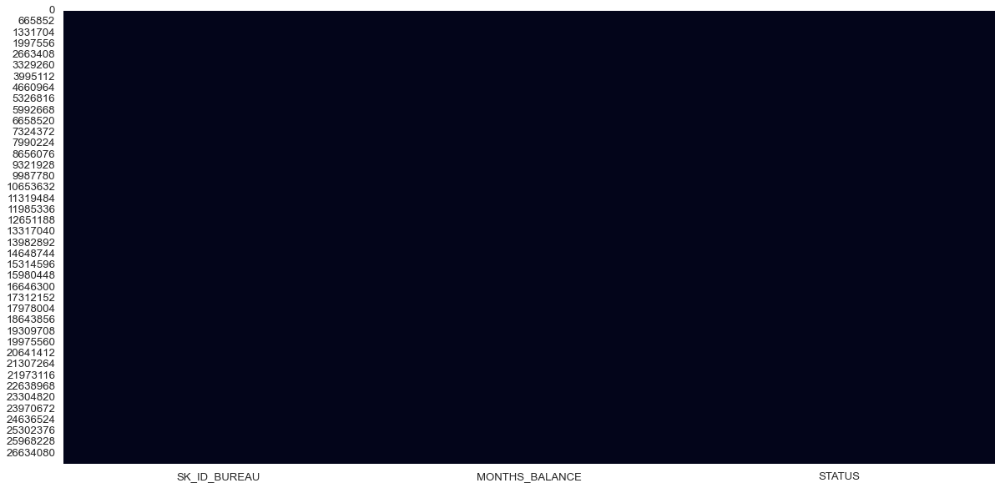

In [105]:
get_missing_values(bureau_balance, True, True)

In [106]:
# Réprésentation visuelle des valeurs manquantes
df_nan_bureau_bal = nan_df_create(bureau_balance)
plot_nan_percent(df_nan_bureau_bal, 'bureau_balance',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

Le dataframe bureau_balance ne contient pas de valeurs manquantes.


In [107]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants

print('Création dataframe de travail : merge TARGET avec dataframe bureau')
bureau_merged = application_train.iloc[:, :2].merge(bureau,
                                                    on='SK_ID_CURR',
                                                    how='left')

Création dataframe de travail : merge TARGET avec dataframe bureau


In [108]:
# Liste des variables qualitatives
cols_cat_bureau_bal = \
    bureau_balance.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_bureau_bal

['STATUS']

In [109]:
print_unique_categories(bureau_balance,'STATUS',show_counts=True)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'STATUS' sont :
['C' '0' 'X' '1' '2' '3' '5' '4']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: STATUS, dtype: int64
-------------------------------------------------------------------------------


In [110]:
def plot_categorical_variable_bar(data, column_name, figsize=(18, 6),
                                  percentage_display=True, rotation=0,
                                  horizontal_adjust=0,
                                  fontsize_percent='xx-small',
                                  palette1='Set1'):
    '''
    Function to plot Categorical Variables Bar Plots
    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        figsize: tuple, default = (18,6)
            Size of the figure to be plotted
        percentage_display: bool, default = True
            Whether to display the percentages on top of Bars in Bar-Plot
        plot_defaulter: bool
            Whether to plot the Bar Plots for Defaulters or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
        horizontal_adjust: int, default = 0
            Horizontal adjustment parameter for percentages displayed on the top of Bars of Bar-Plot
        fontsize_percent: str, default = 'xx-small'
            Fontsize for percentage Display
    '''

    print(
        f"Nombre de catégories uniques pour {column_name} = {len(data[column_name].unique())}")

    plt.figure(figsize=figsize, tight_layout=True)
    sns.set(style='whitegrid', font_scale=1.2)

    data_to_plot = data[column_name].value_counts().sort_values(ascending=False)
    ax = sns.barplot(x=data_to_plot.index, y=data_to_plot, palette=palette1)

    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(
                p.get_x() +
                horizontal_adjust,
                p.get_height() +
                0.005 *
                total_datapoints,
                '{:1.02f}%'.format(
                    p.get_height() *
                    100 /
                    total_datapoints),
                fontsize=fontsize_percent)

    plt.xlabel(column_name, labelpad=10)
    plt.title(f'Barplot de {column_name}', pad=20, fontsize=30)
    plt.xticks(rotation=rotation, fontsize=20)
    plt.yticks(fontsize=20)
    plt.ylabel('Nombre', fontsize=20)

    plt.show()


Nombre de catégories uniques pour STATUS = 8


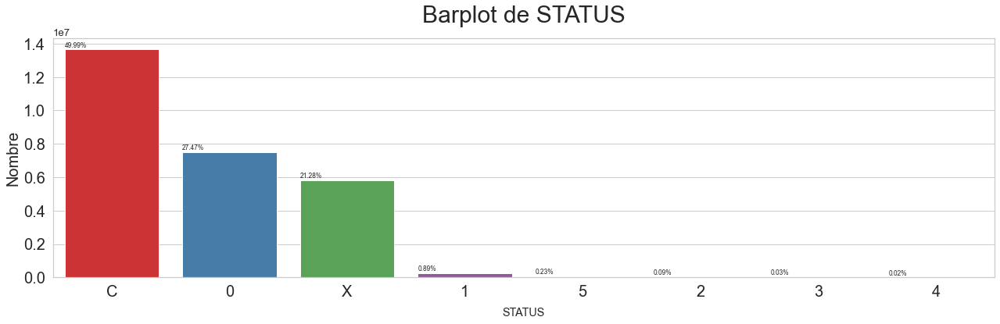

In [111]:
 plot_categorical_variable_bar(bureau_balance,'STATUS')

In [112]:
# Liste des variables quantitatives
cols_num = \
    bureau_balance.select_dtypes(include=[np.number]).columns.to_list()
cols_num

['SK_ID_BUREAU', 'MONTHS_BALANCE']

## 5- Fichier credit_card_balance.csv

In [158]:
df_var_ccbal = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'credit_card_balance.csv']
df_var_ccbal.style.hide_index()

Table,Row,Description,Special
credit_card_balance.csv,SK_ID_PREV,"ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)",hashed
credit_card_balance.csv,SK_ID_CURR,ID of loan in our sample,hashed
credit_card_balance.csv,MONTHS_BALANCE,Month of balance relative to application date (-1 means the freshest balance date),time only relative to the application
credit_card_balance.csv,AMT_BALANCE,Balance during the month of previous credit,nan
credit_card_balance.csv,AMT_CREDIT_LIMIT_ACTUAL,Credit card limit during the month of the previous credit,nan
credit_card_balance.csv,AMT_DRAWINGS_ATM_CURRENT,Amount drawing at ATM during the month of the previous credit,nan
credit_card_balance.csv,AMT_DRAWINGS_CURRENT,Amount drawing during the month of the previous credit,nan
credit_card_balance.csv,AMT_DRAWINGS_OTHER_CURRENT,Amount of other drawings during the month of the previous credit,nan
credit_card_balance.csv,AMT_DRAWINGS_POS_CURRENT,Amount drawing or buying goods during the month of the previous credit,nan
credit_card_balance.csv,AMT_INST_MIN_REGULARITY,Minimal installment for this month of the previous credit,nan


In [159]:
description_variables(cc_balance)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
type,int64,int64,int64,float64,int64,float64,float64,float64,float64,float64,...,float64,float64,float64,int64,float64,float64,float64,object,int64,int64
nb_nan,0.0,0.0,0.0,0.0,0.0,749816.0,0.0,749816.0,749816.0,305236.0,...,0.0,0.0,749816.0,0.0,749816.0,749816.0,305236.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.848907,0.0,0.848907,0.848907,0.345574,...,0.0,0.0,0.848907,0.0,0.848907,0.848907,0.345574,0.0,0.0,0.0
count,3840312.0,3840312.0,3840312.0,3840312.0,3840312.0,3090496.0,3840312.0,3090496.0,3090496.0,3535076.0,...,3840312.0,3840312.0,3090496.0,3840312.0,3090496.0,3090496.0,3535076.0,3840312,3840312.0,3840312.0
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3698436,NaN,NaN
mean,1904503.5899,278324.207289,-34.521921,58300.155262,153807.9574,5961.324822,7433.388179,288.169582,2968.804848,3540.204129,...,58088.811177,58098.285489,0.309449,0.703144,0.004812,0.559479,20.825084,NaN,9.283667,0.331622
std,536469.470563,102704.475133,26.667751,106307.031025,165145.699523,28225.688579,33846.077334,8201.989345,20796.887047,5600.154122,...,105965.369908,105971.801103,1.100401,3.190347,0.082639,3.240649,20.051494,NaN,97.5157,21.479231
min,1000018.0,100006.0,-96.0,-420250.185,0.0,-6827.31,-6211.62,0.0,0.0,0.0,...,-420250.185,-420250.185,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0


Valeurs manquantes : 5877356 NaN pour 88327176 données (6.65 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
AMT_PAYMENT_CURRENT,767988,20.000000
AMT_DRAWINGS_ATM_CURRENT,749816,19.520000
AMT_DRAWINGS_OTHER_CURRENT,749816,19.520000
AMT_DRAWINGS_POS_CURRENT,749816,19.520000
CNT_DRAWINGS_ATM_CURRENT,749816,19.520000
CNT_DRAWINGS_OTHER_CURRENT,749816,19.520000
CNT_DRAWINGS_POS_CURRENT,749816,19.520000
AMT_INST_MIN_REGULARITY,305236,7.950000
CNT_INSTALMENT_MATURE_CUM,305236,7.950000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


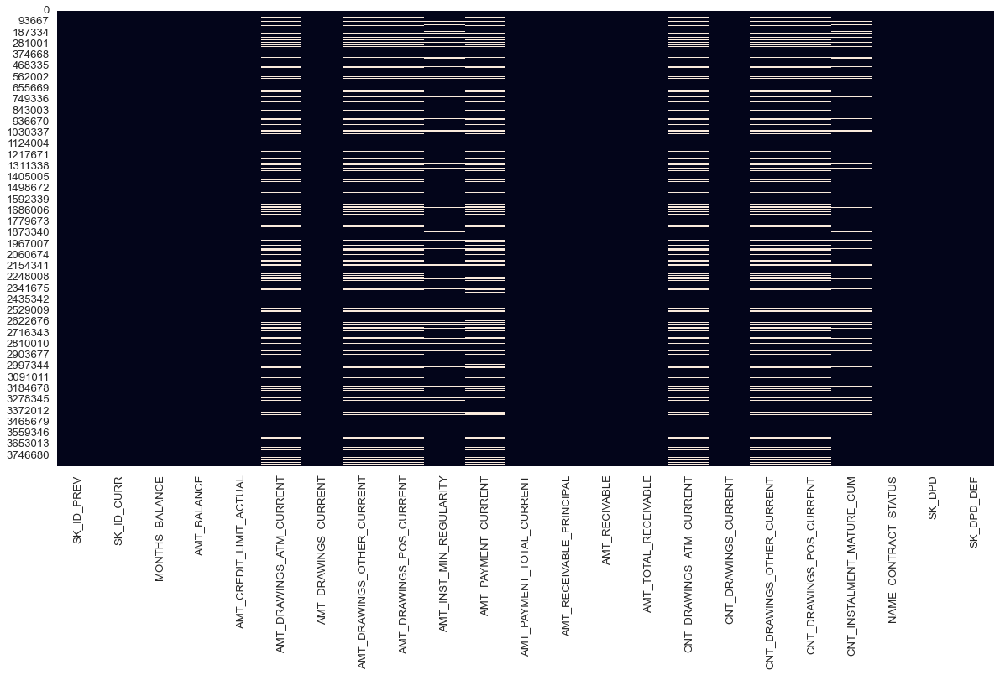

In [147]:
get_missing_values(cc_balance, True, True)

Nombre de variables avec valeurs manquantes : 9


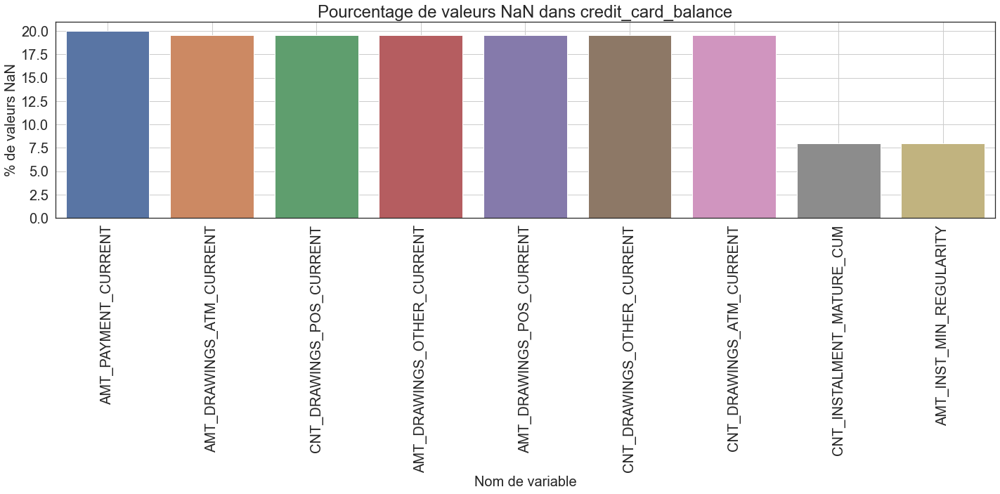

In [160]:
# Réprésentation visuelle des valeurs manquantes
df_nan_ccbal = nan_df_create(cc_balance)
plot_nan_percent(df_nan_ccbal, 'credit_card_balance',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

In [162]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
print('Création dataframe de travail : merge TARGET avec dataframe cc_balance')
cc_balance_merged = application_train.iloc[:, :2].merge(cc_balance,
                                                        on='SK_ID_CURR',
                                                        how='left')
print("-"*79)

-------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe cc_balance
-------------------------------------------------------------------------------


In [163]:
# Liste des variables qualitatives
cols_cat_ccbal = \
    cc_balance_merged.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_ccbal

['NAME_CONTRACT_STATUS']

In [164]:
print_unique_categories(cc_balance_merged, 'NAME_CONTRACT_STATUS', show_counts=True)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CONTRACT_STATUS' sont :
[nan 'Active' 'Completed' 'Signed' 'Sent proposal' 'Refused' 'Demand'
 'Approved']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Active           3116673
Completed         100031
Signed              9939
Demand               843
Sent proposal        460
Refused               14
Approved               5
Name: NAME_CONTRACT_STATUS, dtype: int64
-------------------------------------------------------------------------------


In [126]:
def plot_categorical_variables_bar(data, column_name, figsize=(18, 6),
                                   percentage_display=True,
                                   plot_defaulter=True, rotation=90,
                                   horizontal_adjust=0,
                                   fontsize_percent='xx-small',
                                   palette1='Set1',
                                   palette2='Set2'):
    '''
    Function to plot Categorical Variables Bar Plots
    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        figsize: tuple, default = (18,6)
            Size of the figure to be plotted
        percentage_display: bool, default = True
            Whether to display the percentages on top of Bars in Bar-Plot
        plot_defaulter: bool
            Whether to plot the Bar Plots for Defaulters or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
        horizontal_adjust: int, default = 0
            Horizontal adjustment parameter for percentages displayed on the top of Bars of Bar-Plot
        fontsize_percent: str, default = 'xx-small'
            Fontsize for percentage Display
    '''

    print(
        f"Nombre de catégories uniques pour {column_name} = {len(data[column_name].unique())}")

    plt.figure(figsize=figsize, tight_layout=True)
    sns.set(style='whitegrid', font_scale=1.2)

    # plotting overall distribution of category
    plt.subplot(1, 2, 1)
    data_to_plot = data[column_name].value_counts().sort_values(ascending=False)
    ax = sns.barplot(x=data_to_plot.index, y=data_to_plot, palette=palette1)

    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(
                p.get_x() +
                horizontal_adjust,
                p.get_height() +
                0.005 *
                total_datapoints,
                '{:1.02f}%'.format(
                    p.get_height() *
                    100 /
                    total_datapoints),
                fontsize=fontsize_percent)

    plt.xlabel(column_name, labelpad=10)
    plt.title('Toutes TARGET', pad=20, fontsize=30)
    plt.xticks(rotation=rotation, fontsize=20)
    plt.yticks(fontsize=20)
    plt.ylabel('Nombre', fontsize=20)

    # plotting distribution of category for Defaulters
    if plot_defaulter:
        percentage_defaulter_per_category = (data[column_name][data.TARGET == 1].value_counts(
        ) * 100 / data[column_name].value_counts()).dropna().sort_values(ascending=False)

        plt.subplot(1, 2, 2)
        sns.barplot(x=percentage_defaulter_per_category.index,
                    y=percentage_defaulter_per_category, palette=palette2)
        plt.ylabel(
            'Pourcentage par catégorie pour les défaillants',
            fontsize=20)
        plt.xlabel(column_name, labelpad=10)
        plt.xticks(rotation=rotation, fontsize=20)
        plt.yticks(fontsize=20)
        plt.title('Défaillants seuls', pad=20, fontsize=30)

    plt.suptitle(f'Répartition de {column_name}', fontsize=40)
    plt.show()


def plot_categorical_variable_bar(data, column_name, figsize=(18, 6),
                                  percentage_display=True, rotation=0,
                                  horizontal_adjust=0,
                                  fontsize_percent='xx-small',
                                  palette1='Set1'):
    '''
    Function to plot Categorical Variables Bar Plots
    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        figsize: tuple, default = (18,6)
            Size of the figure to be plotted
        percentage_display: bool, default = True
            Whether to display the percentages on top of Bars in Bar-Plot
        plot_defaulter: bool
            Whether to plot the Bar Plots for Defaulters or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
        horizontal_adjust: int, default = 0
            Horizontal adjustment parameter for percentages displayed on the top of Bars of Bar-Plot
        fontsize_percent: str, default = 'xx-small'
            Fontsize for percentage Display
    '''

    print(
        f"Nombre de catégories uniques pour {column_name} = {len(data[column_name].unique())}")

    plt.figure(figsize=figsize, tight_layout=True)
    sns.set(style='whitegrid', font_scale=1.2)

    data_to_plot = data[column_name].value_counts().sort_values(ascending=False)
    ax = sns.barplot(x=data_to_plot.index, y=data_to_plot, palette=palette1)

    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(
                p.get_x() +
                horizontal_adjust,
                p.get_height() +
                0.005 *
                total_datapoints,
                '{:1.02f}%'.format(
                    p.get_height() *
                    100 /
                    total_datapoints),
                fontsize=fontsize_percent)

    plt.xlabel(column_name, labelpad=10)
    plt.title(f'Barplot de {column_name}', pad=20, fontsize=30)
    plt.xticks(rotation=rotation, fontsize=20)
    plt.yticks(fontsize=20)
    plt.ylabel('Nombre', fontsize=20)

    plt.show()


Nombre de catégories uniques pour NAME_CONTRACT_STATUS = 8


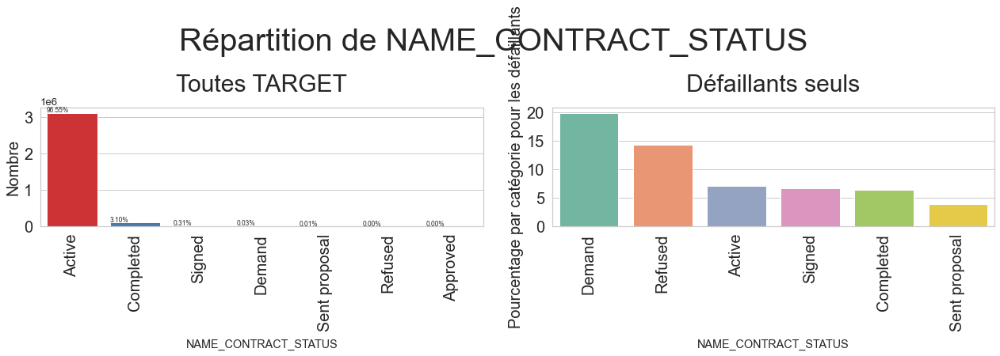

In [165]:
plot_categorical_variables_bar(cc_balance_merged,
                                   column_name='NAME_CONTRACT_STATUS')

In [166]:
# Liste des variables quantitatives
cols_num = \
    cc_balance_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'MONTHS_BALANCE',
 'AMT_BALANCE',
 'AMT_CREDIT_LIMIT_ACTUAL',
 'AMT_DRAWINGS_ATM_CURRENT',
 'AMT_DRAWINGS_CURRENT',
 'AMT_DRAWINGS_OTHER_CURRENT',
 'AMT_DRAWINGS_POS_CURRENT',
 'AMT_INST_MIN_REGULARITY',
 'AMT_PAYMENT_CURRENT',
 'AMT_PAYMENT_TOTAL_CURRENT',
 'AMT_RECEIVABLE_PRINCIPAL',
 'AMT_RECIVABLE',
 'AMT_TOTAL_RECEIVABLE',
 'CNT_DRAWINGS_ATM_CURRENT',
 'CNT_DRAWINGS_CURRENT',
 'CNT_DRAWINGS_OTHER_CURRENT',
 'CNT_DRAWINGS_POS_CURRENT',
 'CNT_INSTALMENT_MATURE_CUM',
 'SK_DPD',
 'SK_DPD_DEF']

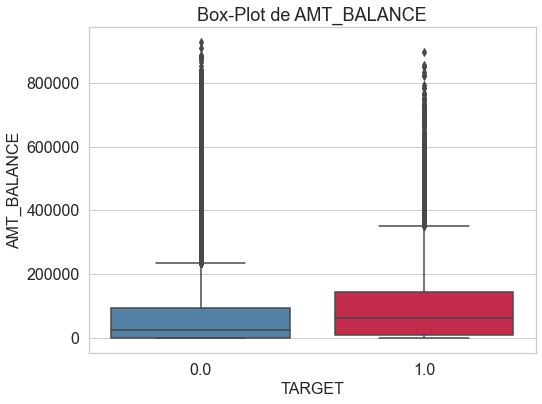

In [139]:
# Affiche boxplot
plot_continuous_variables(cc_balance_merged,
                                               'AMT_BALANCE',
                                               plots=['box'],
                                               figsize=(8, 6))

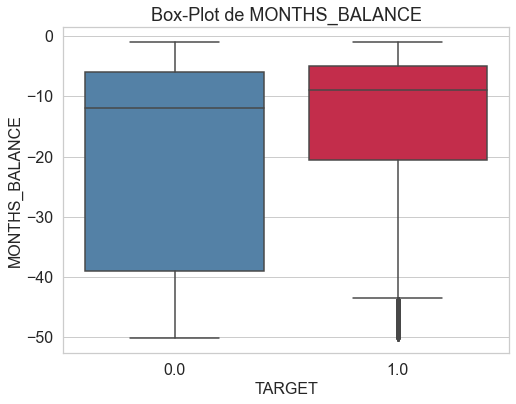

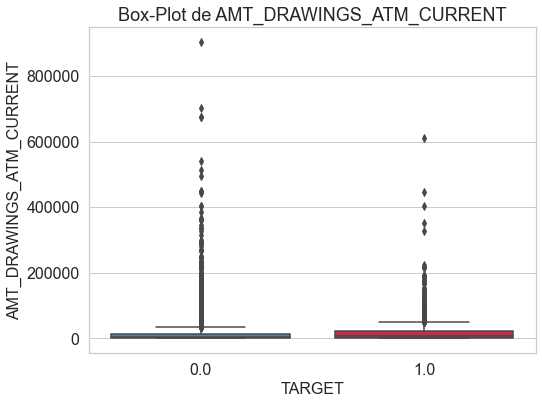

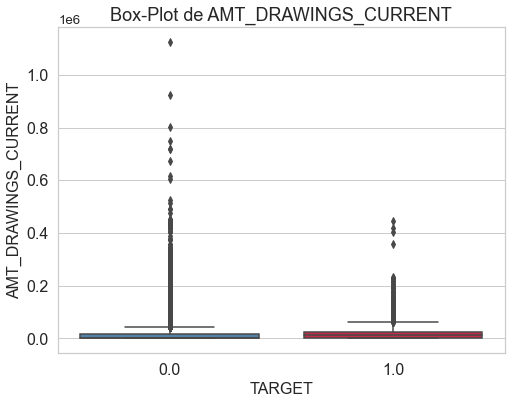

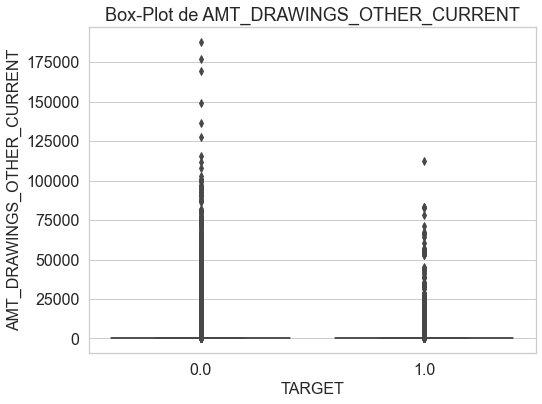

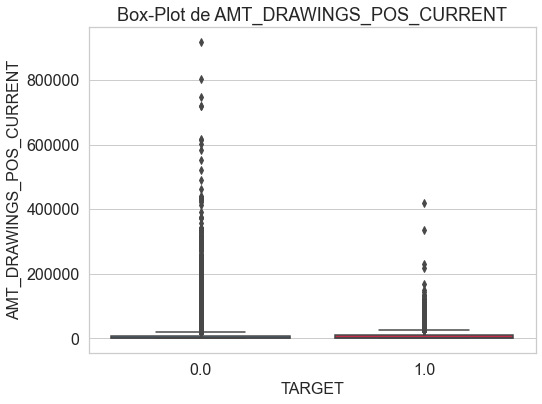

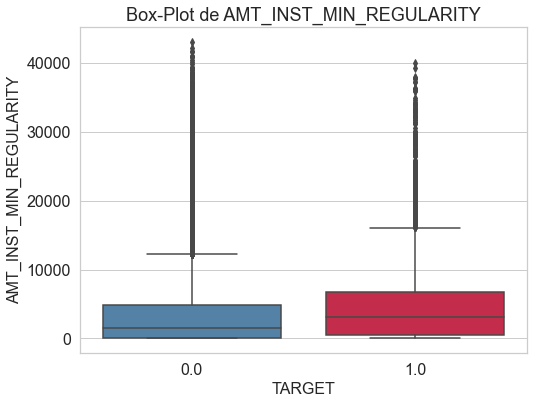

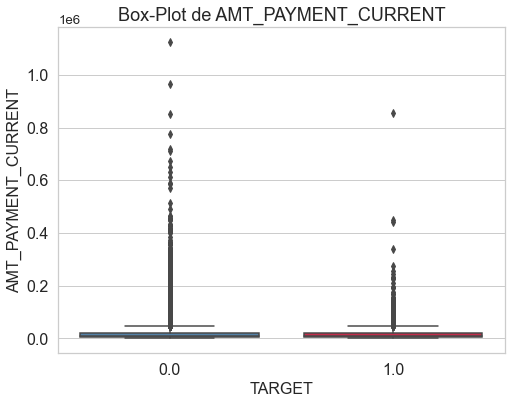

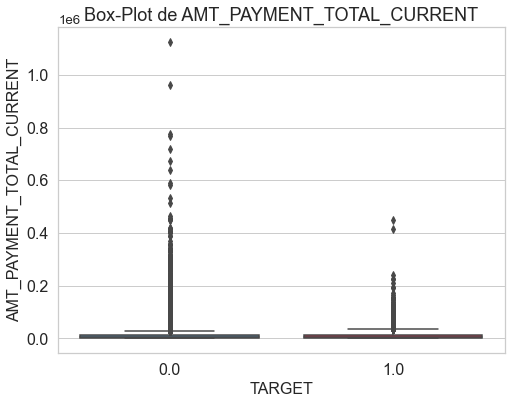

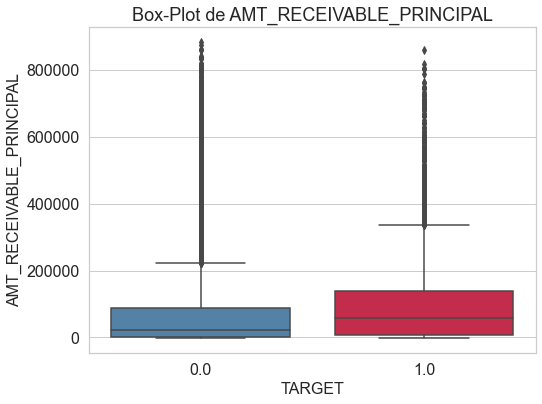

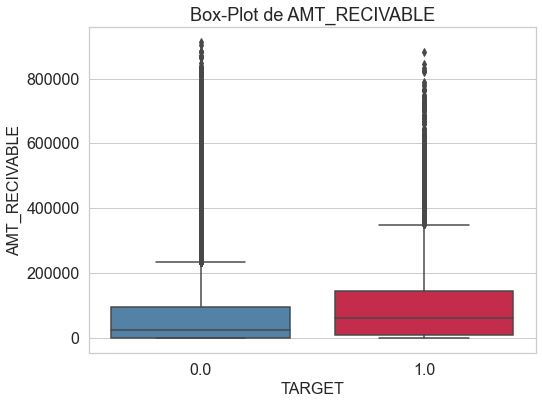

In [132]:
plot_continuous_variables(cc_balance_merged,'MONTHS_BALANCE', plots=['box'], figsize=(8, 6))
plot_continuous_variables(cc_balance_merged,'AMT_DRAWINGS_ATM_CURRENT', plots=['box'], figsize=(8, 6))
plot_continuous_variables(cc_balance_merged,'AMT_DRAWINGS_CURRENT', plots=['box'], figsize=(8, 6))
plot_continuous_variables(cc_balance_merged,'AMT_DRAWINGS_OTHER_CURRENT', plots=['box'], figsize=(8, 6))
plot_continuous_variables(cc_balance_merged,'AMT_DRAWINGS_POS_CURRENT', plots=['box'], figsize=(8, 6))
plot_continuous_variables(cc_balance_merged,'AMT_INST_MIN_REGULARITY', plots=['box'], figsize=(8, 6))
plot_continuous_variables(cc_balance_merged,'AMT_PAYMENT_CURRENT', plots=['box'], figsize=(8, 6))
plot_continuous_variables(cc_balance_merged,'AMT_PAYMENT_TOTAL_CURRENT', plots=['box'], figsize=(8, 6))
plot_continuous_variables(cc_balance_merged,'AMT_RECEIVABLE_PRINCIPAL', plots=['box'], figsize=(8, 6))
plot_continuous_variables(cc_balance_merged,'AMT_RECIVABLE', plots=['box'], figsize=(8, 6))

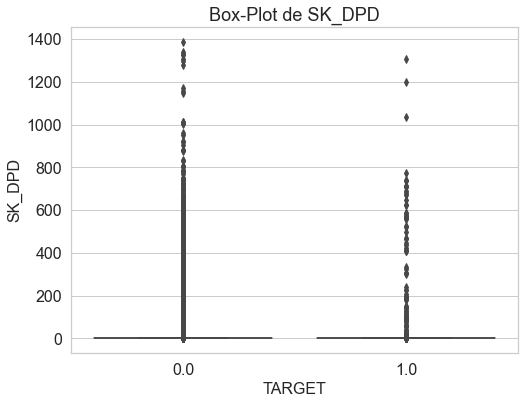

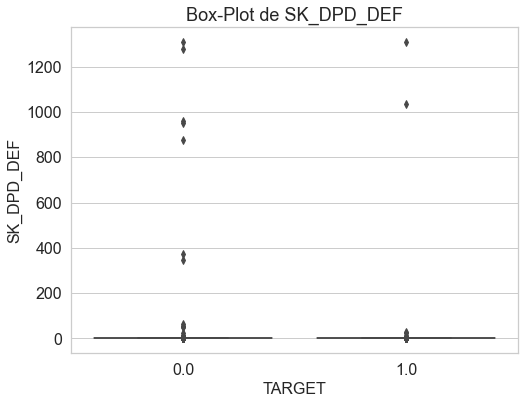

In [133]:
plot_continuous_variables(cc_balance_merged,'SK_DPD', plots=['box'], figsize=(8, 6))
plot_continuous_variables(cc_balance_merged,'SK_DPD_DEF', plots=['box'], figsize=(8, 6))


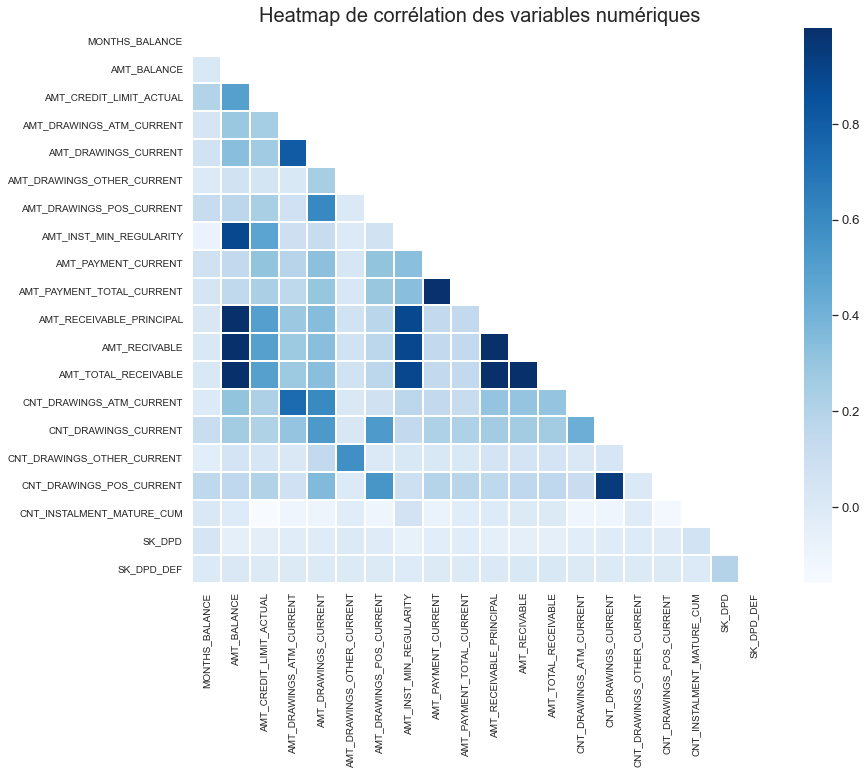

In [167]:
corr_mat = correlation_matrix(cc_balance_merged,['SK_ID_CURR', 'SK_ID_PREV'],
                                            cmap='Blues',
                                            figsize=(13, 11))
corr_mat.plot_correlation_matrix()

In [168]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE']
interval columns not set, guessing: ['TARGET', 'AMT_BALANCE']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_LIMIT_ACTUAL']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_ATM_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_OTHER_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_POS_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_INST_MIN_REGULARITY']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT_TOTAL_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_RECEIVABLE_PRINCIPAL']
interval columns not set, guessing: ['TARGET', 'AMT_RECIVABLE']
interval columns not set, guessing: ['TARGET', 'AMT_TOTAL_RECEIVABLE']
interval columns not set, guessing: ['TARGET', 'CNT_DRAWINGS_ATM_CURREN

Column Name,Phik-Correlation
AMT_BALANCE,0.059838
AMT_RECIVABLE,0.059311
AMT_TOTAL_RECEIVABLE,0.059287
AMT_RECEIVABLE_PRINCIPAL,0.058895
MONTHS_BALANCE,0.050360
AMT_INST_MIN_REGULARITY,0.042174
CNT_INSTALMENT_MATURE_CUM,0.038261
CNT_DRAWINGS_ATM_CURRENT,0.030052
AMT_CREDIT_LIMIT_ACTUAL,0.028752
CNT_DRAWINGS_CURRENT,0.027868


-------------------------------------------------------------------------------


## 6-Fichier installments_payments.csv

In [179]:
df_var_instpaie = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'installments_payments.csv']
df_var_instpaie.style.hide_index()

Table,Row,Description,Special
installments_payments.csv,SK_ID_PREV,"ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)",hashed
installments_payments.csv,SK_ID_CURR,ID of loan in our sample,hashed
installments_payments.csv,NUM_INSTALMENT_VERSION,Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some parameter of payment calendar has changed,nan
installments_payments.csv,NUM_INSTALMENT_NUMBER,On which installment we observe payment,nan
installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was supposed to be paid (relative to application date of current loan),time only relative to the application
installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit paid actually (relative to application date of current loan),time only relative to the application
installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of previous credit on this installment,nan
installments_payments.csv,AMT_PAYMENT,What the client actually paid on previous credit on this installment,nan


In [180]:
description_variables(installments_payments)

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
type,int64,int64,float64,int64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,2905.0,0.0,2905.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.002669,0.0,0.002669
count,13605401.0,13605401.0,13605401.0,13605401.0,13605401.0,13602496.0,13605401.0,13602496.0
mean,1903364.969549,278444.881738,0.856637,18.870896,-1042.269992,-1051.113684,17050.906989,17238.22325
std,536202.905546,102718.310411,1.035216,26.664067,800.946284,800.585883,50570.254429,54735.783981
min,1000001.0,100001.0,0.0,1.0,-2922.0,-4921.0,0.0,0.0
25%,1434191.0,189639.0,0.0,4.0,-1654.0,-1662.0,4226.085,3398.265
50%,1896520.0,278685.0,1.0,8.0,-818.0,-827.0,8884.08,8125.515
75%,2369094.0,367530.0,1.0,19.0,-361.0,-370.0,16710.21,16108.425


Valeurs manquantes : 5810 NaN pour 108843208 données (0.01 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
DAYS_ENTRY_PAYMENT,2905,0.020000
AMT_PAYMENT,2905,0.020000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


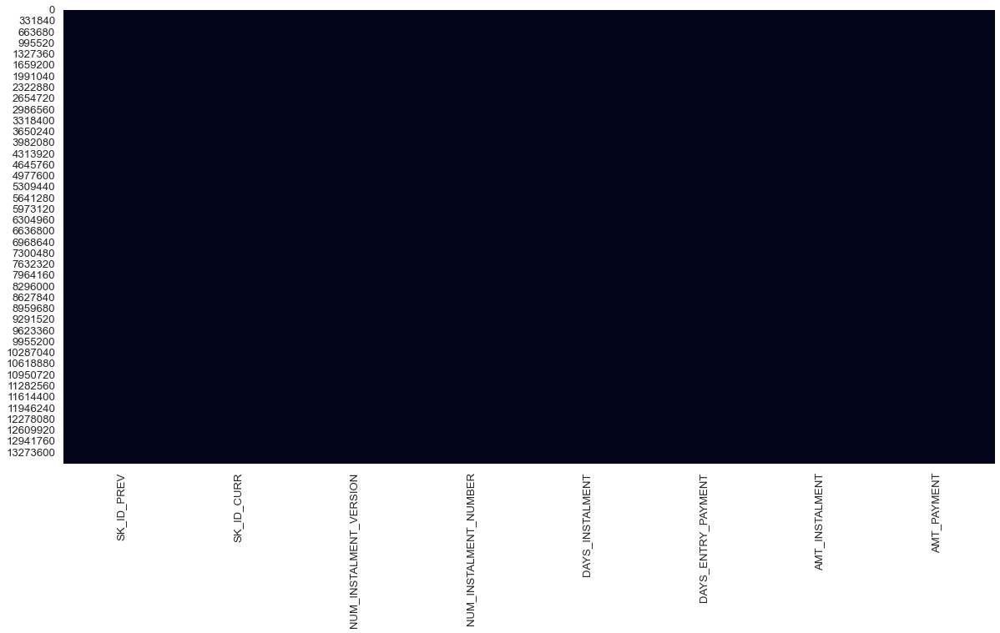

In [171]:
get_missing_values(installments_payments, True, True)

Nombre de variables avec valeurs manquantes : 2


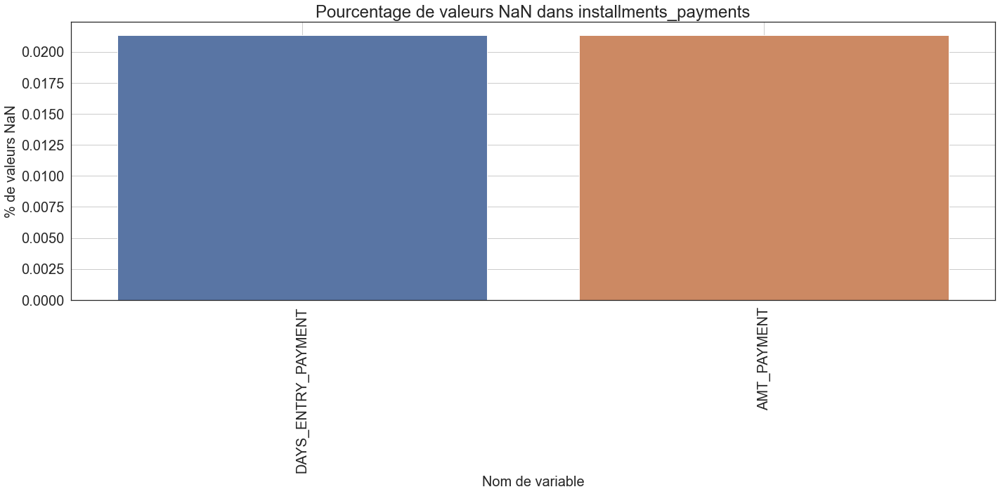

In [181]:
# Réprésentation visuelle des valeurs manquantes
df_nan_instpaie =nan_df_create(installments_payments)
plot_nan_percent(df_nan_instpaie, 'installments_payments',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

In [182]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
part1 = 'Création dataframe de travail : merge TARGET '
print(part1 + 'avec dataframe installments_payments')
installments_merged = \
    application_train.iloc[:, :2].merge(installments_payments,
                                        on='SK_ID_CURR',
                                        how='left')
print("-"*79)

-------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe installments_payments
-------------------------------------------------------------------------------


In [183]:
# Liste des variables quantitatives
cols_num_instpaie = \
    installments_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num_instpaie

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'NUM_INSTALMENT_VERSION',
 'NUM_INSTALMENT_NUMBER',
 'DAYS_INSTALMENT',
 'DAYS_ENTRY_PAYMENT',
 'AMT_INSTALMENT',
 'AMT_PAYMENT']

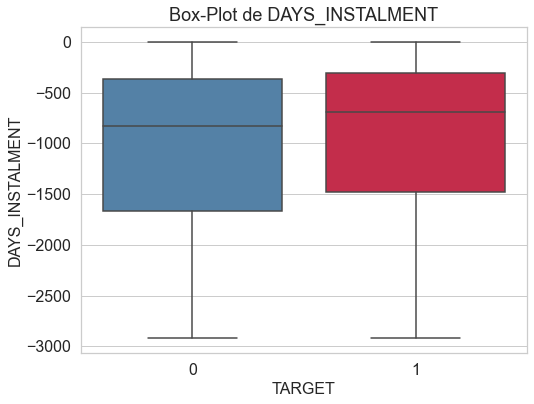

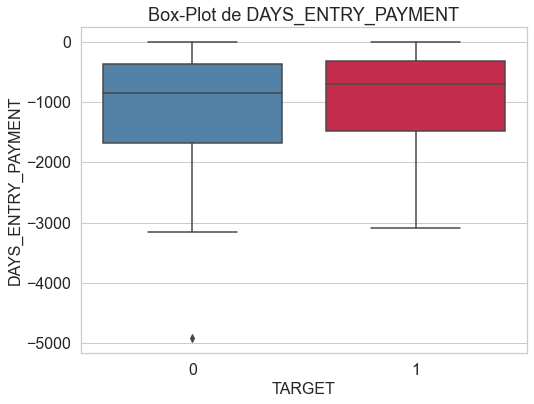

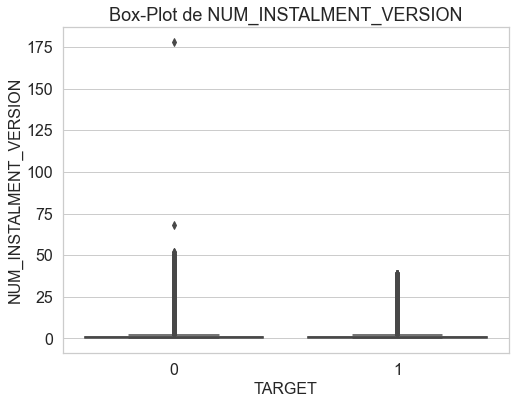

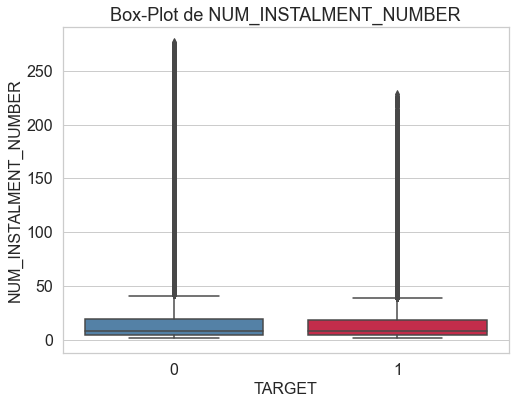

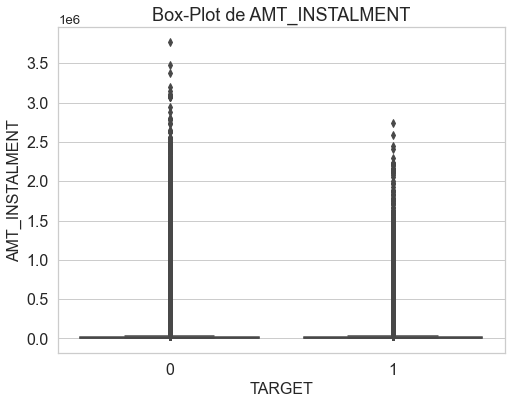

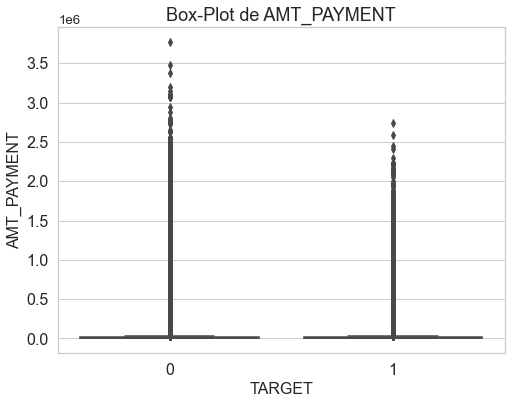

In [184]:
plot_continuous_variables(installments_merged,'DAYS_INSTALMENT',plots=['box'], figsize=(8, 6))
plot_continuous_variables(installments_merged,'DAYS_ENTRY_PAYMENT',plots=['box'], figsize=(8, 6))
plot_continuous_variables(installments_merged,'NUM_INSTALMENT_VERSION',plots=['box'], figsize=(8, 6))
plot_continuous_variables(installments_merged,'NUM_INSTALMENT_NUMBER',plots=['box'], figsize=(8, 6))
plot_continuous_variables(installments_merged,'AMT_INSTALMENT',plots=['box'], figsize=(8, 6))
plot_continuous_variables(installments_merged,'AMT_PAYMENT',plots=['box'], figsize=(8, 6))


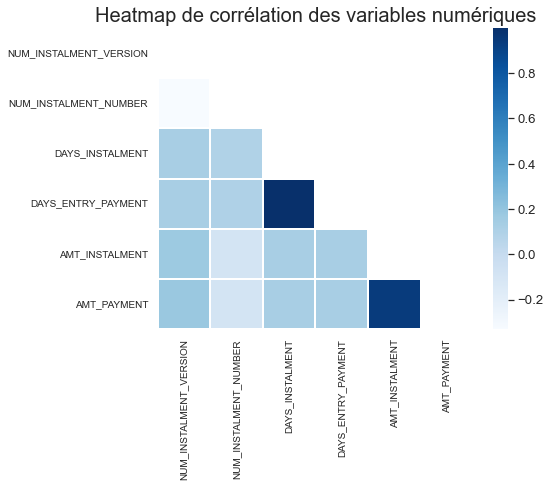

In [185]:
corr_mat = correlation_matrix(installments_merged,
                                            ['SK_ID_CURR', 'SK_ID_PREV'],
                                            cmap='Blues',
                                            figsize=(8, 7))
corr_mat.plot_correlation_matrix()

In [186]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

interval columns not set, guessing: ['TARGET', 'NUM_INSTALMENT_VERSION']
interval columns not set, guessing: ['TARGET', 'NUM_INSTALMENT_NUMBER']
interval columns not set, guessing: ['TARGET', 'DAYS_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'DAYS_ENTRY_PAYMENT']
interval columns not set, guessing: ['TARGET', 'AMT_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT']
-------------------------------------------------------------------------------
Les variables ayant les valeurs les plus élevées de Phik-corrélation avec la variable cible sont les suivantes :


Column Name,Phik-Correlation
DAYS_INSTALMENT,0.046824
DAYS_ENTRY_PAYMENT,0.033128
NUM_INSTALMENT_NUMBER,0.022993
AMT_INSTALMENT,0.004125
AMT_PAYMENT,0.003084
NUM_INSTALMENT_VERSION,0.002198


-------------------------------------------------------------------------------


## 7- Fichier POS_CASH_balance.csv

In [187]:
df_var_posh = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'POS_CASH_balance.csv']
df_var_posh.style.hide_index()

Table,Row,Description,Special
POS_CASH_balance.csv,SK_ID_PREV,"ID of previous credit in Home Credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)",nan
POS_CASH_balance.csv,SK_ID_CURR,ID of loan in our sample,nan
POS_CASH_balance.csv,MONTHS_BALANCE,"Month of balance relative to application date (-1 means the information to the freshest monthly snapshot, 0 means the information at application - often it will be the same as -1 as many banks are not updating the information to Credit Bureau regularly )",time only relative to the application
POS_CASH_balance.csv,CNT_INSTALMENT,Term of previous credit (can change over time),nan
POS_CASH_balance.csv,CNT_INSTALMENT_FUTURE,Installments left to pay on the previous credit,nan
POS_CASH_balance.csv,NAME_CONTRACT_STATUS,Contract status during the month,nan
POS_CASH_balance.csv,SK_DPD,DPD (days past due) during the month of previous credit,nan
POS_CASH_balance.csv,SK_DPD_DEF,DPD during the month with tolerance (debts with low loan amounts are ignored) of the previous credit,nan


In [188]:
description_variables(POS_CASH_balance)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
type,int64,int64,int64,float64,float64,object,int64,int64
nb_nan,0.0,0.0,0.0,26071.0,26087.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.032584,0.032604,0.0,0.0,0.0
count,10001358.0,10001358.0,10001358.0,9975287.0,9975271.0,10001358,10001358.0,10001358.0
unique,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,9151119,NaN,NaN
mean,1903216.598957,278403.863306,-35.012588,17.08965,10.48384,NaN,11.606928,0.654468
std,535846.530722,102763.74509,26.06657,11.995056,11.109058,NaN,132.714043,32.762491
min,1000001.0,100001.0,-96.0,1.0,0.0,NaN,0.0,0.0


Valeurs manquantes : 52158 NaN pour 80010864 données (0.07 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
CNT_INSTALMENT,26071,0.260000
CNT_INSTALMENT_FUTURE,26087,0.260000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


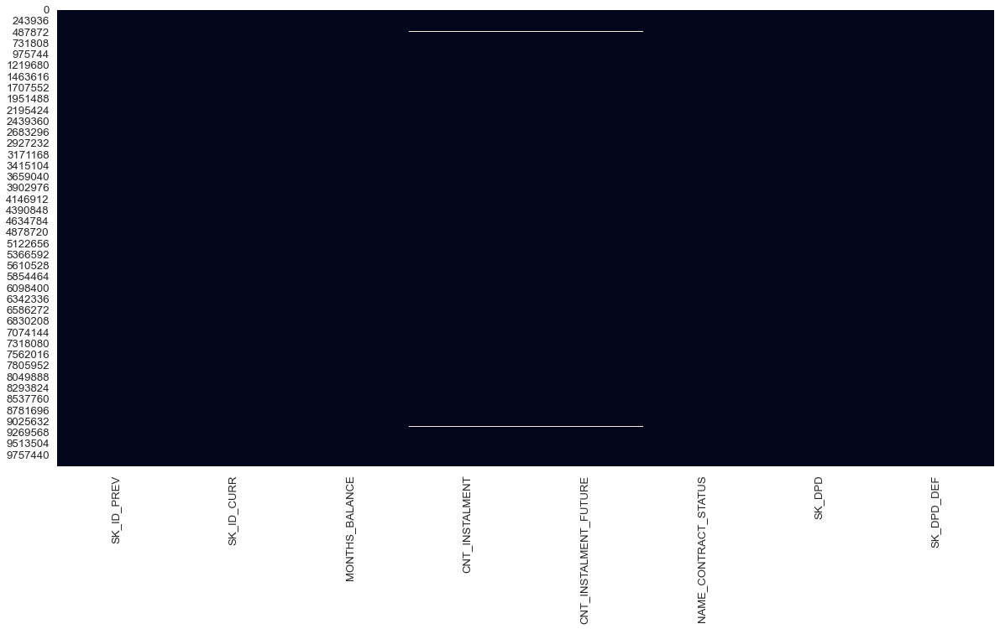

In [189]:
get_missing_values(POS_CASH_balance, True, True)

Nombre de variables avec valeurs manquantes : 2


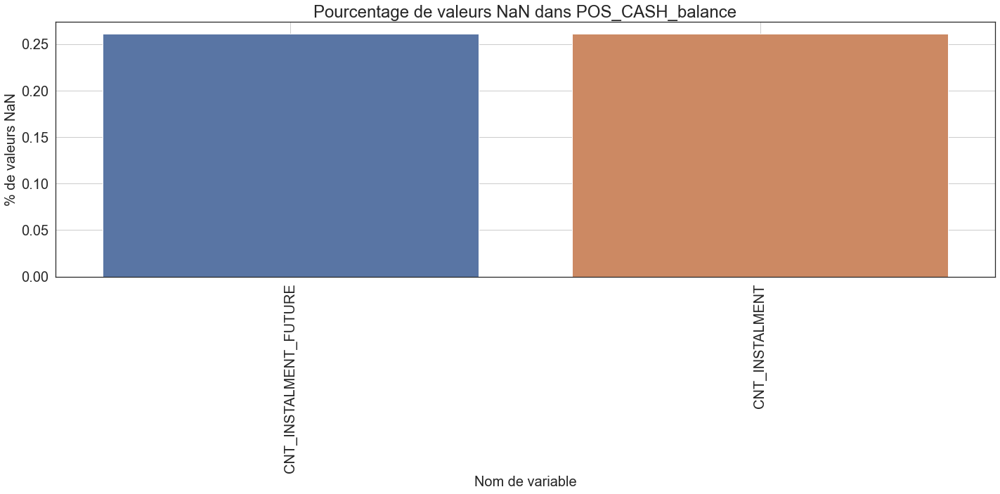

In [190]:
# Réprésentation visuelle des valeurs manquantes
df_nan_posh = nan_df_create(POS_CASH_balance)
plot_nan_percent(df_nan_posh, 'POS_CASH_balance',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

In [191]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
var1 = 'Création dataframe de travail : merge TARGET '
print(var1 + 'avec dataframe POS_CASH_balance')
pos_cash_merged = application_train.iloc[:, :2].merge(POS_CASH_balance,
                                                      on='SK_ID_CURR',
                                                      how='left')
print("-"*79)

-------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe POS_CASH_balance
-------------------------------------------------------------------------------


In [192]:
# Liste des variables qualitatives
cols_cat_posh = \
    pos_cash_merged.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_posh

['NAME_CONTRACT_STATUS']

In [193]:
print_unique_categories(pos_cash_merged,'NAME_CONTRACT_STATUS')

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CONTRACT_STATUS' sont :
['Active' 'Completed' 'Returned to the store' 'Signed' nan 'Approved'
 'Demand' 'Amortized debt' 'Canceled' 'XNA']
-------------------------------------------------------------------------------


Nombre de catégories uniques pour NAME_CONTRACT_STATUS = 10


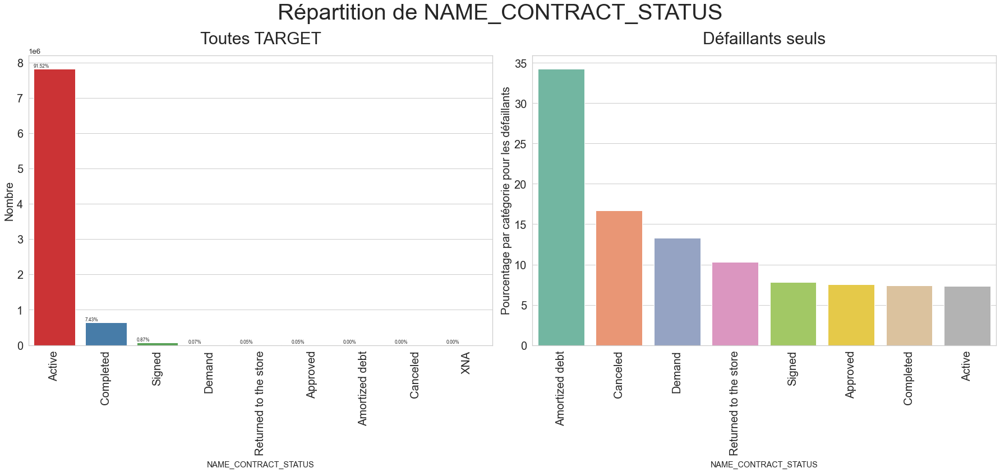

In [194]:
 plot_categorical_variables_bar(pos_cash_merged,
                                   column_name='NAME_CONTRACT_STATUS',
                                   figsize=(25, 12), rotation=90)

In [195]:
# Liste des variables quantitatives
cols_num_posh = \
    pos_cash_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num_posh

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'MONTHS_BALANCE',
 'CNT_INSTALMENT',
 'CNT_INSTALMENT_FUTURE',
 'SK_DPD',
 'SK_DPD_DEF']

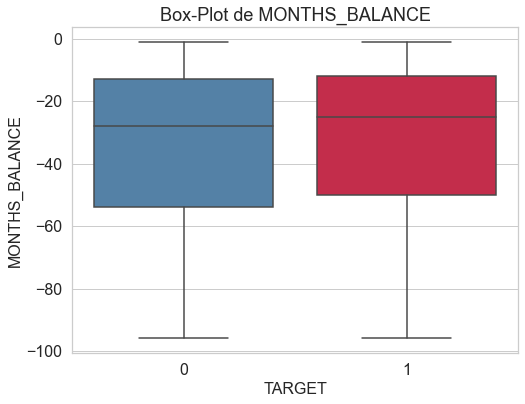

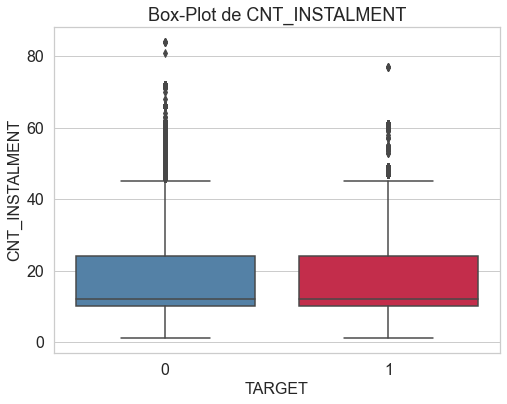

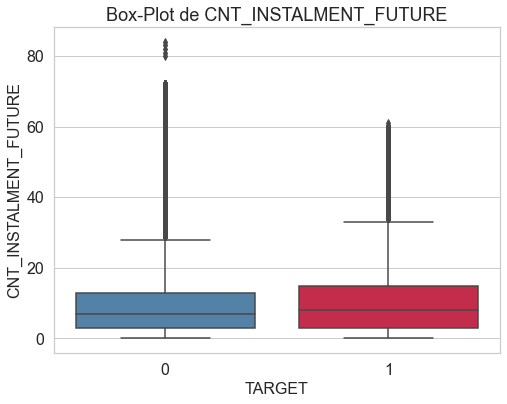

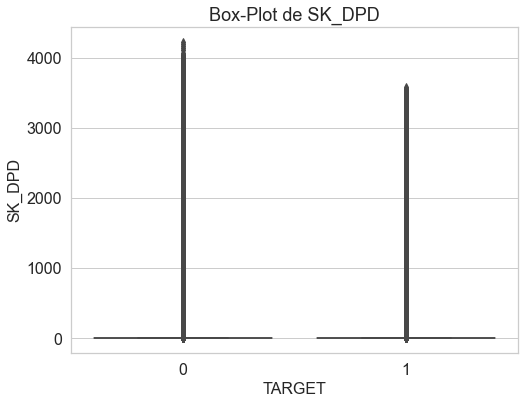

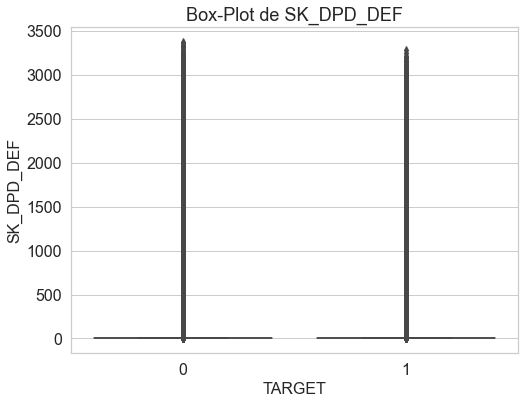

In [196]:
plot_continuous_variables(pos_cash_merged,'MONTHS_BALANCE', plots=['box'],figsize=(8, 6))
plot_continuous_variables(pos_cash_merged,'CNT_INSTALMENT', plots=['box'],figsize=(8, 6))
plot_continuous_variables(pos_cash_merged,'CNT_INSTALMENT_FUTURE', plots=['box'],figsize=(8, 6))
plot_continuous_variables(pos_cash_merged,'SK_DPD', plots=['box'],figsize=(8, 6))
plot_continuous_variables(pos_cash_merged,'SK_DPD_DEF', plots=['box'],figsize=(8, 6))


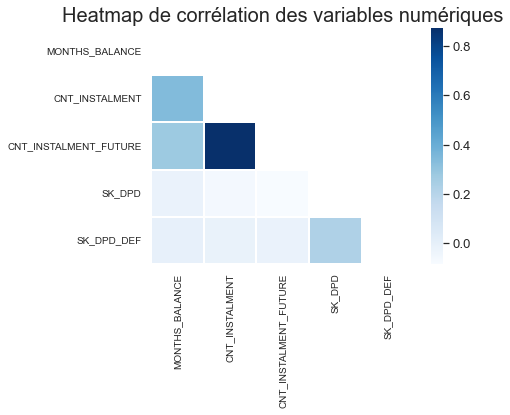

In [197]:
corr_mat = correlation_matrix(pos_cash_merged,
                                            ['SK_ID_CURR', 'SK_ID_PREV'],
                                            cmap='Blues',
                                            figsize=(7, 6))
corr_mat.plot_correlation_matrix()

In [198]:
# Seeing the top columns with highest phik-correlation with the target
# variable in pos_cash_merged table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE']
interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT_FUTURE']
interval columns not set, guessing: ['TARGET', 'SK_DPD']
interval columns not set, guessing: ['TARGET', 'SK_DPD_DEF']
-------------------------------------------------------------------------------
Les variables ayant les valeurs les plus élevées de Phik-corrélation avec la variable cible sont les suivantes :


Column Name,Phik-Correlation
CNT_INSTALMENT_FUTURE,0.033194
CNT_INSTALMENT,0.030947
MONTHS_BALANCE,0.027391
SK_DPD,0.012773
SK_DPD_DEF,0.010539


-------------------------------------------------------------------------------


## 8. Fichier previous_application.csv

In [199]:
df_var_prev = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'previous_application.csv']
df_var_prev.style.hide_index()

Table,Row,Description,Special
previous_application.csv,SK_ID_PREV,"ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loan applications in Home Credit, previous application could, but not necessarily have to lead to credit)",hashed
previous_application.csv,SK_ID_CURR,ID of loan in our sample,hashed
previous_application.csv,NAME_CONTRACT_TYPE,"Contract product type (Cash loan, consumer loan [POS] ,...) of the previous application",nan
previous_application.csv,AMT_ANNUITY,Annuity of previous application,nan
previous_application.csv,AMT_APPLICATION,For how much credit did client ask on the previous application,nan
previous_application.csv,AMT_CREDIT,"Final credit amount on the previous application. This differs from AMT_APPLICATION in a way that the AMT_APPLICATION is the amount for which the client initially applied for, but during our approval process he could have received different amount - AMT_CREDIT",nan
previous_application.csv,AMT_DOWN_PAYMENT,Down payment on the previous application,nan
previous_application.csv,AMT_GOODS_PRICE,Goods price of good that client asked for (if applicable) on the previous application,nan
previous_application.csv,WEEKDAY_APPR_PROCESS_START,On which day of the week did the client apply for previous application,nan
previous_application.csv,HOUR_APPR_PROCESS_START,Approximately at what day hour did the client apply for the previous application,rounded


In [200]:
description_variables(previous_application)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
type,int64,int64,object,float64,float64,float64,float64,float64,object,int64,...,object,float64,object,object,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,372235.0,0.0,1.0,895844.0,385515.0,0.0,0.0,...,0.0,372230.0,0.0,346.0,673065.0,673065.0,673065.0,673065.0,673065.0,673065.0
%_nan,0.0,0.0,0.0,0.602342,0.0,0.000002,1.449635,0.623832,0.0,0.0,...,0.0,0.602334,0.0,0.00056,1.089139,1.089139,1.089139,1.089139,1.089139,1.089139
count,1670214.0,1670214.0,1670214,1297979.0,1670214.0,1670213.0,774370.0,1284699.0,1670214,1670214.0,...,1670214,1297984.0,1670214,1669868,997149.0,997149.0,997149.0,997149.0,997149.0,997149.0
unique,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,7,NaN,...,11,NaN,5,17,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,NaN,NaN,NaN,NaN,NaN,TUESDAY,NaN,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,747553,NaN,NaN,NaN,NaN,NaN,255118,NaN,...,855720,NaN,517215,285990,NaN,NaN,NaN,NaN,NaN,NaN
mean,1923089.135331,278357.174099,NaN,15955.120659,175233.86036,196114.021218,6697.402139,227847.279283,NaN,12.484182,...,NaN,16.054082,NaN,NaN,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.33257
std,532597.958696,102814.823849,NaN,14782.137335,292779.762387,318574.616546,20921.49541,315396.557937,NaN,3.334028,...,NaN,14.567288,NaN,NaN,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1000001.0,100001.0,NaN,0.0,0.0,0.0,-0.9,0.0,NaN,0.0,...,NaN,0.0,NaN,NaN,-2922.0,-2892.0,-2801.0,-2889.0,-2874.0,0.0


Valeurs manquantes : 11109336 NaN pour 61797918 données (17.98 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
RATE_INTEREST_PRIMARY,1664263,99.640000
RATE_INTEREST_PRIVILEGED,1664263,99.640000
AMT_DOWN_PAYMENT,895844,53.640000
RATE_DOWN_PAYMENT,895844,53.640000
NAME_TYPE_SUITE,820405,49.120000
DAYS_FIRST_DRAWING,673065,40.300000
DAYS_FIRST_DUE,673065,40.300000
DAYS_LAST_DUE_1ST_VERSION,673065,40.300000
DAYS_LAST_DUE,673065,40.300000
DAYS_TERMINATION,673065,40.300000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


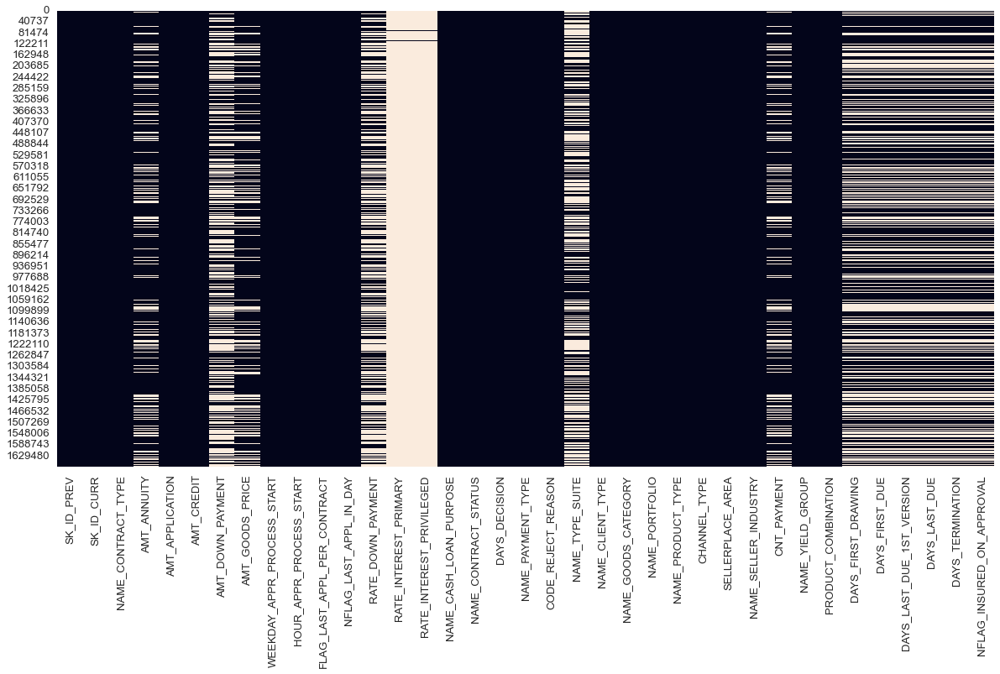

In [201]:
get_missing_values(previous_application, True, True)

Nombre de variables avec valeurs manquantes : 16


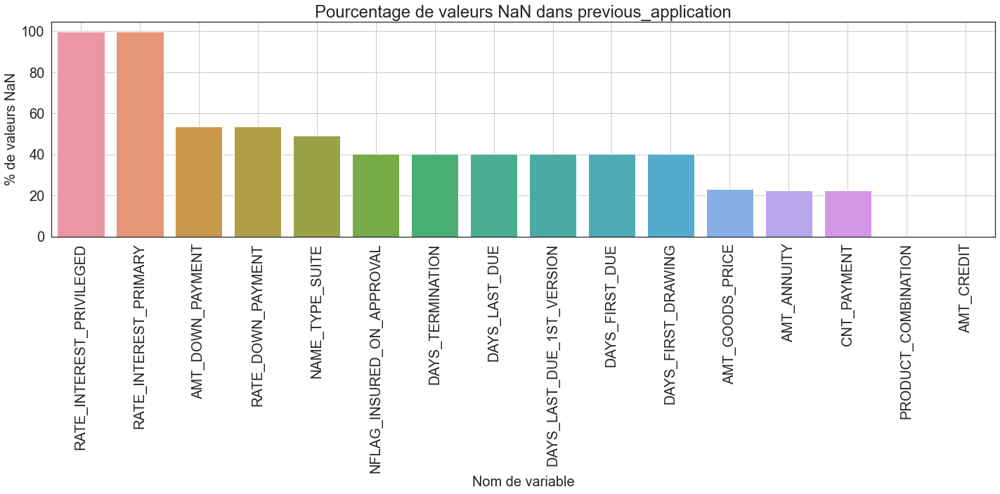

In [202]:
# Réprésentation visuelle des valeurs manquantes
df_nan_prev = nan_df_create(previous_application)
plot_nan_percent(df_nan_prev, 'previous_application',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

In [203]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
var = 'Création dataframe de travail : merge TARGET '
print(var + 'avec dataframe previous_application')
prev_merged = application_train.iloc[:, :2].merge(previous_application,
                                                  on='SK_ID_CURR',
                                                  how='left')
print("-"*79)

-------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe previous_application
-------------------------------------------------------------------------------


In [204]:
# Liste des variables qualitatives
cols_cat_prev = \
    prev_merged.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_prev

['NAME_CONTRACT_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION']

In [205]:
print_unique_categories(prev_merged, 'NAME_CONTRACT_TYPE', show_counts=True)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CONTRACT_TYPE' sont :
['Consumer loans' 'Cash loans' 'Revolving loans' nan 'XNA']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Cash loans         626764
Consumer loans     625256
Revolving loans    161368
XNA                   313
Name: NAME_CONTRACT_TYPE, dtype: int64
-------------------------------------------------------------------------------


Nombre de catégories uniques pour NAME_CONTRACT_TYPE = 5


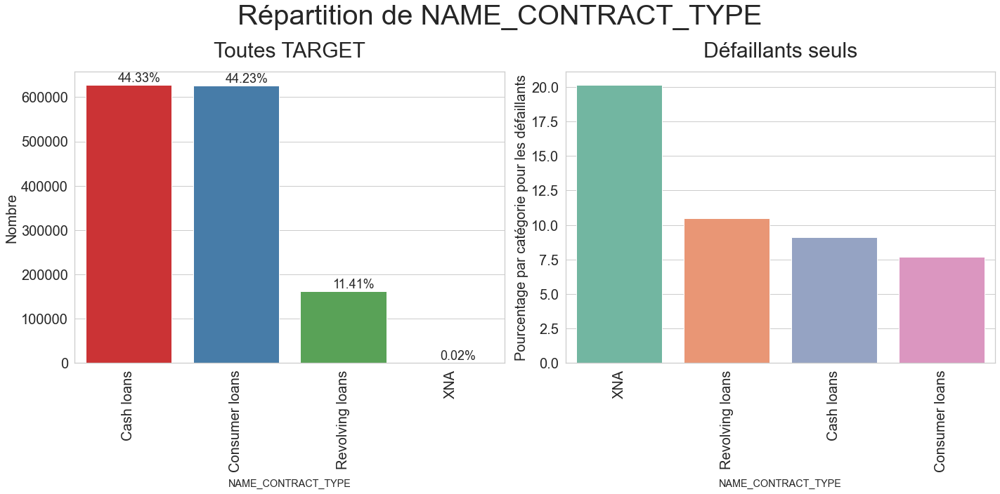

In [206]:
 plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CONTRACT_TYPE',
                                   horizontal_adjust=0.3,
                                   figsize=(20, 10), fontsize_percent=18,
                                   rotation=90)

In [207]:
print_unique_categories(prev_merged, 'NAME_CONTRACT_STATUS', show_counts=True)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CONTRACT_STATUS' sont :
['Approved' 'Canceled' 'Refused' nan 'Unused offer']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: NAME_CONTRACT_STATUS, dtype: int64
-------------------------------------------------------------------------------


Nombre de catégories uniques pour NAME_CONTRACT_STATUS = 5


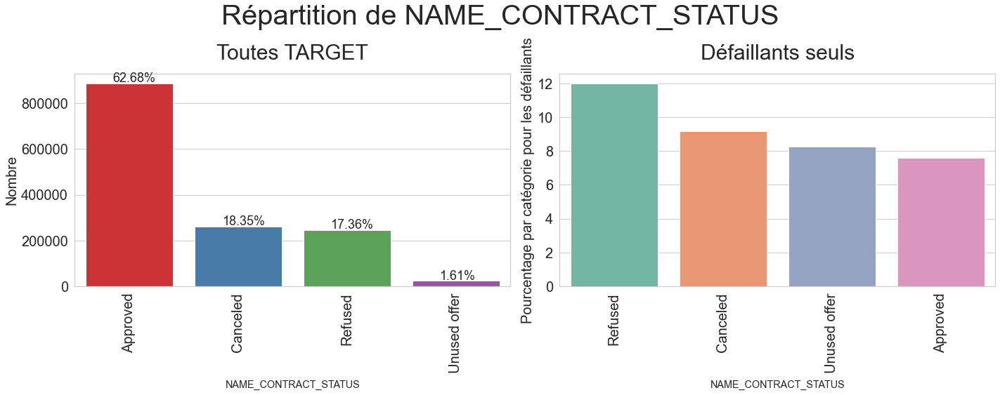

In [209]:
 plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CONTRACT_STATUS',
                                   horizontal_adjust=0.25,
                                   figsize=(20, 8), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CODE_REJECT_REASON' sont :
['XAP' 'LIMIT' nan 'HC' 'SCO' 'SCOFR' 'VERIF' 'CLIENT' 'XNA' 'SYSTEM']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
XAP       1145533
HC         145984
LIMIT       47773
SCO         32636
CLIENT      22771
SCOFR       10875
XNA          4378
VERIF        3079
SYSTEM        672
Name: CODE_REJECT_REASON, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour CODE_REJECT_REASON = 10


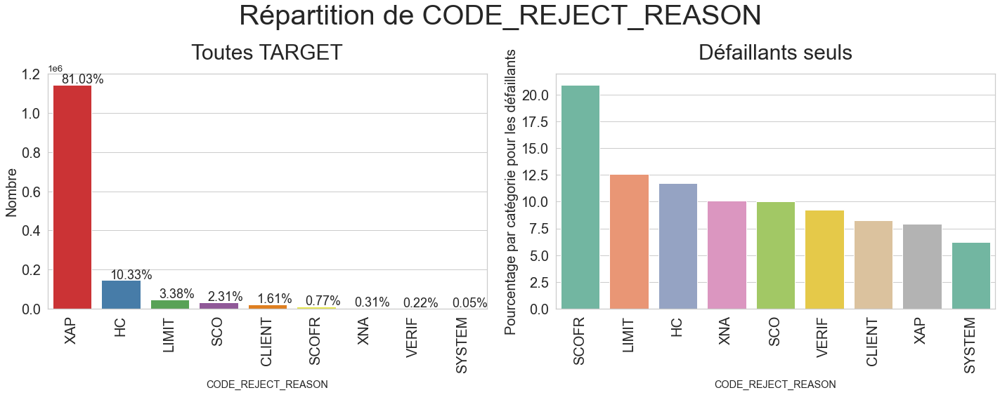

In [210]:
print_unique_categories(prev_merged,'CODE_REJECT_REASON',show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='CODE_REJECT_REASON',
                                   horizontal_adjust=0.18,
                                   figsize=(20, 8), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CHANNEL_TYPE' sont :
['Stone' 'Credit and cash offices' 'Country-wide' 'Regional / Local'
 'AP+ (Cash loan)' 'Contact center' nan 'Channel of corporate sales'
 'Car dealer']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Credit and cash offices       600342
Country-wide                  423062
Stone                         183508
Regional / Local               92472
Contact center                 58891
AP+ (Cash loan)                49624
Channel of corporate sales      5396
Car dealer                       406
Name: CHANNEL_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour CHANNEL_TYPE = 9


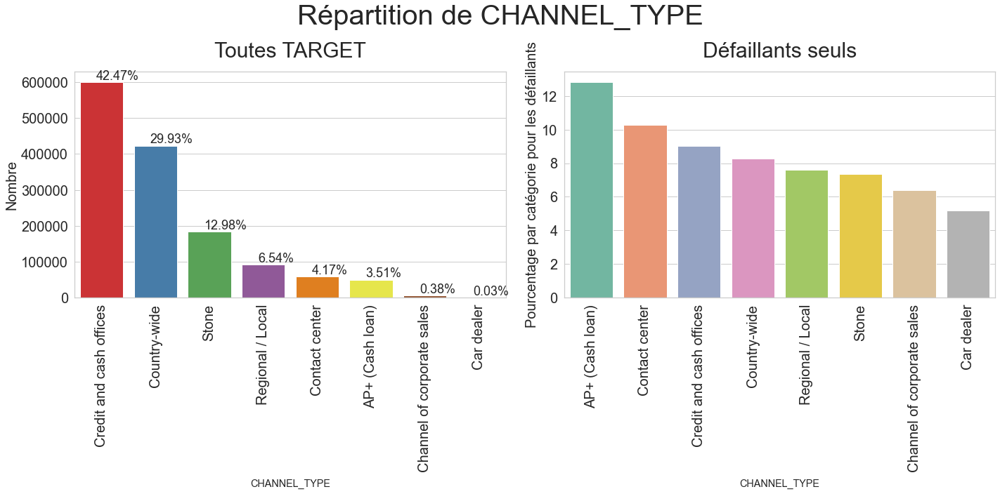

In [211]:
print_unique_categories(prev_merged,'CHANNEL_TYPE', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='CHANNEL_TYPE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'PRODUCT_COMBINATION' sont :
['POS other with interest' 'Cash X-Sell: low' 'POS industry with interest'
 'POS household with interest' 'POS mobile without interest' 'Card Street'
 'Card X-Sell' 'Cash X-Sell: high' 'Cash' 'Cash Street: high'
 'Cash X-Sell: middle' 'POS mobile with interest'
 'POS household without interest' 'POS industry without interest'
 'Cash Street: low' nan 'Cash Street: middle'
 'POS others without interest']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Cash                              235101
POS household with interest       226464
POS mobile with interest          190850
Cash X-Sell: middle               120036
Cash X-Sell: low                  110599
Card Street                        94594
POS industry with interest         83508
POS household without interest     71519
Car

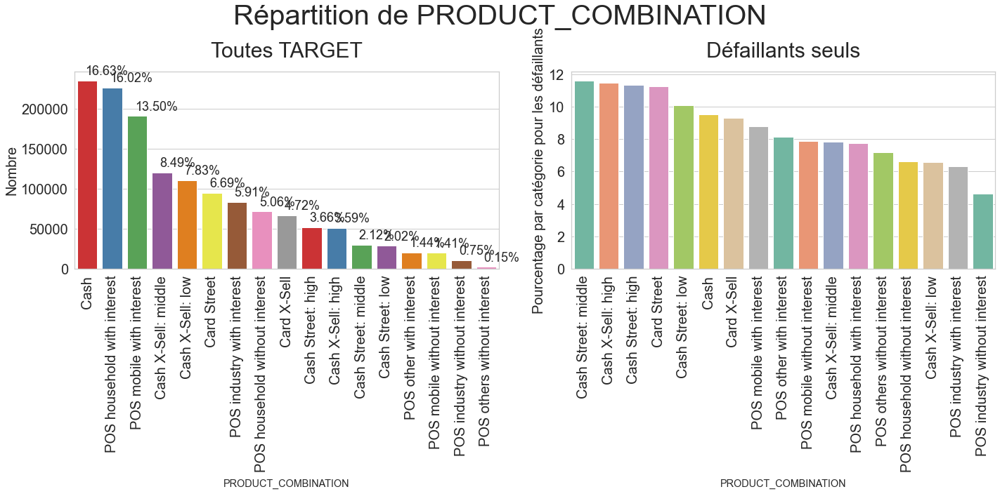

In [212]:
print_unique_categories(prev_merged,'PRODUCT_COMBINATION', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='PRODUCT_COMBINATION',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'WEEKDAY_APPR_PROCESS_START' sont :
['SATURDAY' 'FRIDAY' 'SUNDAY' 'THURSDAY' 'TUESDAY' 'MONDAY' 'WEDNESDAY'
 nan]
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
WEDNESDAY    215519
TUESDAY      215058
MONDAY       214509
FRIDAY       213373
THURSDAY     211005
SATURDAY     204159
SUNDAY       140078
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour WEEKDAY_APPR_PROCESS_START = 8


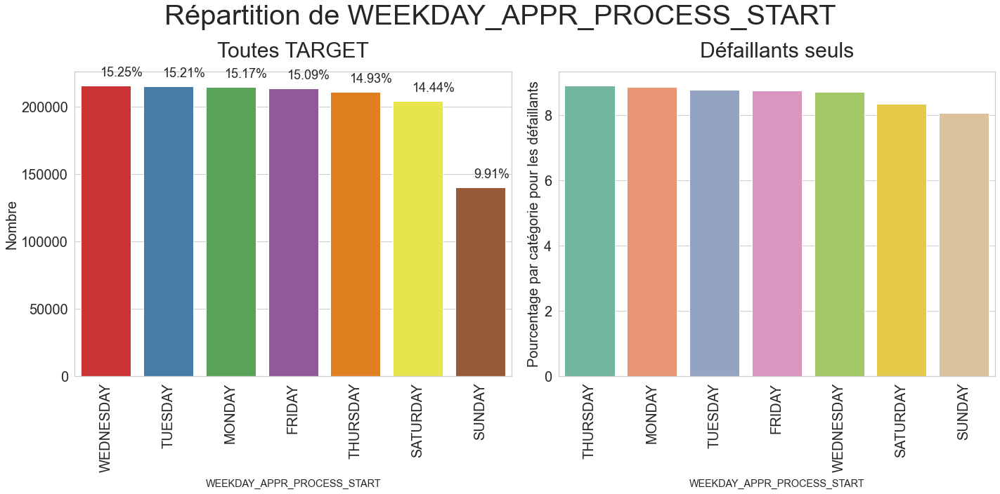

In [213]:
print_unique_categories(prev_merged,'WEEKDAY_APPR_PROCESS_START', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='WEEKDAY_APPR_PROCESS_START',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'FLAG_LAST_APPL_PER_CONTRACT' sont :
['Y' nan 'N']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Y    1406387
N       7314
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour FLAG_LAST_APPL_PER_CONTRACT = 3


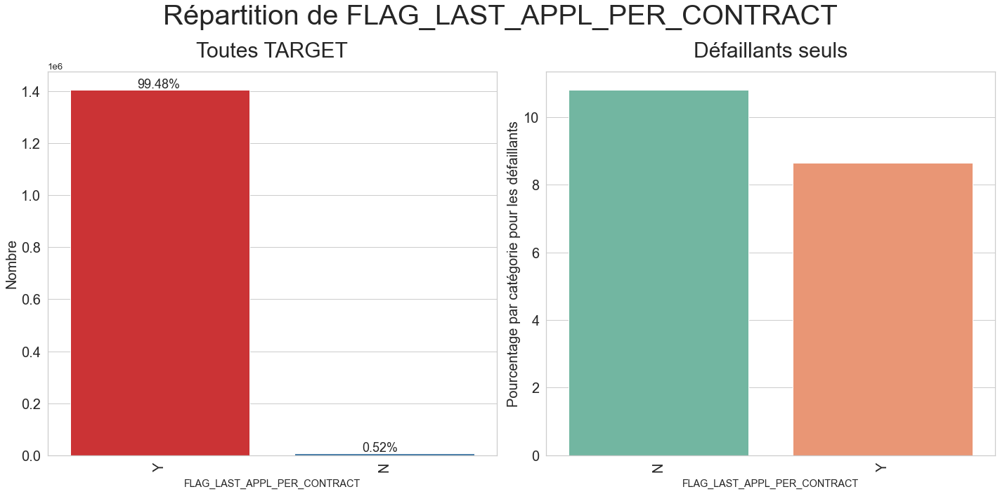

In [214]:
print_unique_categories(prev_merged,'FLAG_LAST_APPL_PER_CONTRACT', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='FLAG_LAST_APPL_PER_CONTRACT',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CASH_LOAN_PURPOSE' sont :
['XAP' 'XNA' nan 'Other' 'Payments on other loans' 'Buying a used car'
 'Repairs' 'Education' 'Buying a new car' 'Everyday expenses' 'Medicine'
 'Car repairs' 'Urgent needs' 'Buying a holiday home / land'
 'Building a house or an annex' 'Furniture' 'Journey'
 'Purchase of electronic equipment' 'Wedding / gift / holiday'
 'Buying a home' 'Business development' 'Gasification / water supply'
 'Buying a garage' 'Hobby' 'Money for a third person'
 'Refusal to name the goal']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
XAP                                 786937
XNA                                 567351
Repairs                              20117
Other                                13432
Urgent needs                          7236
Buying a used car                     2469
B

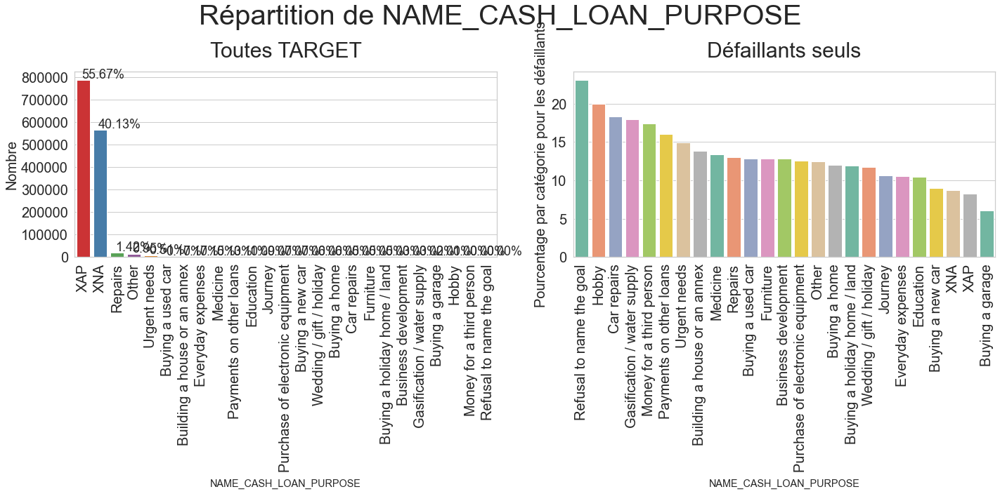

In [215]:
print_unique_categories(prev_merged,'NAME_CASH_LOAN_PURPOSE', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CASH_LOAN_PURPOSE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_PAYMENT_TYPE' sont :
['XNA' 'Cash through the bank' nan 'Non-cash from your account'
 'Cashless from the account of the employer']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Cash through the bank                        882700
XNA                                          522960
Non-cash from your account                     7100
Cashless from the account of the employer       941
Name: NAME_PAYMENT_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_PAYMENT_TYPE = 5


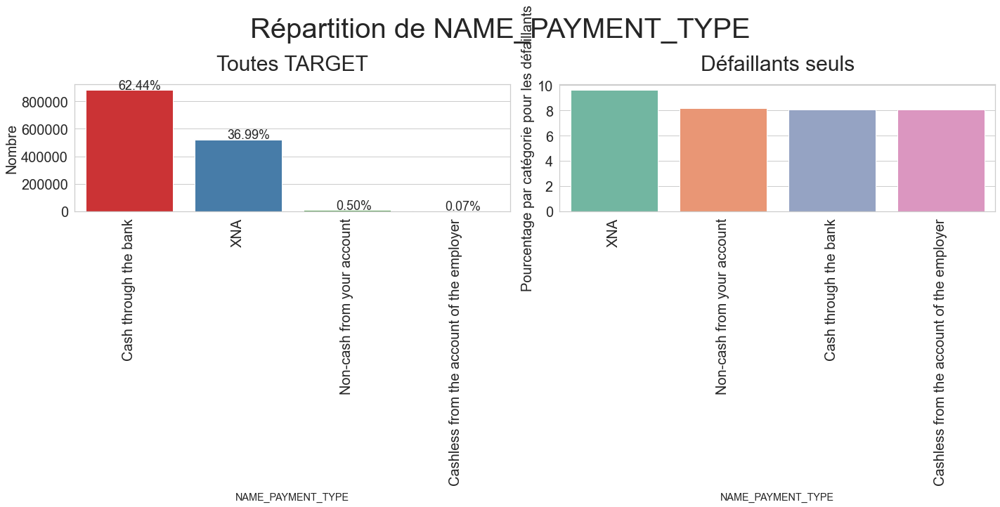

In [216]:
print_unique_categories(prev_merged,'NAME_PAYMENT_TYPE', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_PAYMENT_TYPE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_TYPE_SUITE' sont :
[nan 'Unaccompanied' 'Family' 'Spouse, partner' 'Children' 'Other_A'
 'Other_B' 'Group of people']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Unaccompanied      427635
Family             181880
Spouse, partner     57586
Children            27106
Other_B             15073
Other_A              7820
Group of people      1929
Name: NAME_TYPE_SUITE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_TYPE_SUITE = 8


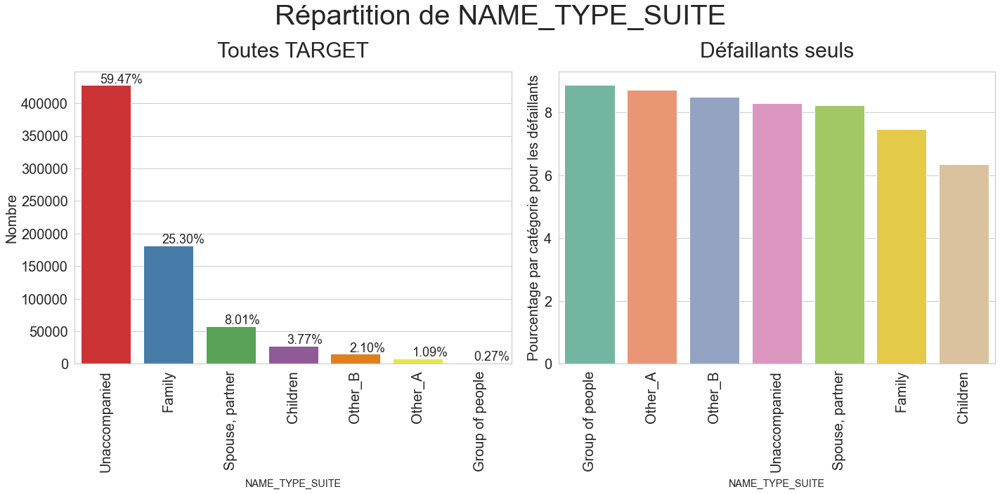

In [217]:
print_unique_categories(prev_merged,'NAME_TYPE_SUITE', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_TYPE_SUITE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CLIENT_TYPE' sont :
['New' 'Repeater' 'Refreshed' 'XNA' nan]
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Repeater     1037682
New           259540
Refreshed     114936
XNA             1543
Name: NAME_CLIENT_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_CLIENT_TYPE = 5


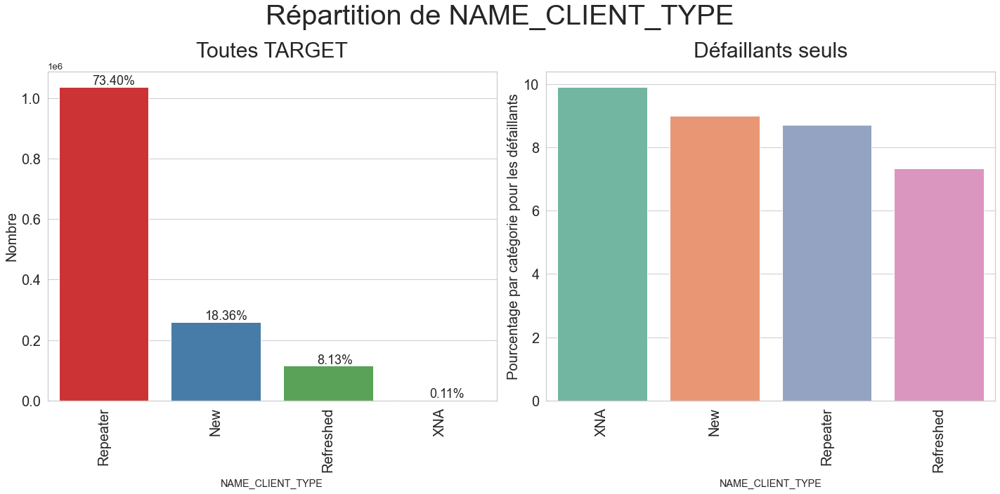

In [218]:
print_unique_categories(prev_merged,'NAME_CLIENT_TYPE', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CLIENT_TYPE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_GOODS_CATEGORY' sont :
['Vehicles' 'XNA' 'Furniture' 'Consumer Electronics' 'Mobile'
 'Audio/Video' 'Construction Materials' 'Gardening'
 'Photo / Cinema Equipment' 'Computers' 'Clothing and Accessories' nan
 'Homewares' 'Medical Supplies' 'Other' 'Jewelry' 'Office Appliances'
 'Tourism' 'Auto Accessories' 'Sport and Leisure' 'Medicine' 'Weapon'
 'Direct Sales' 'Fitness' 'Insurance' 'Additional Service' 'Education'
 'Animals']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
XNA                         797209
Mobile                      193743
Consumer Electronics        104785
Computers                    89923
Audio/Video                  85502
Furniture                    45439
Photo / Cinema Equipment     21707
Construction Materials       21356
Clothing and Accessories     19590
Auto Accessori

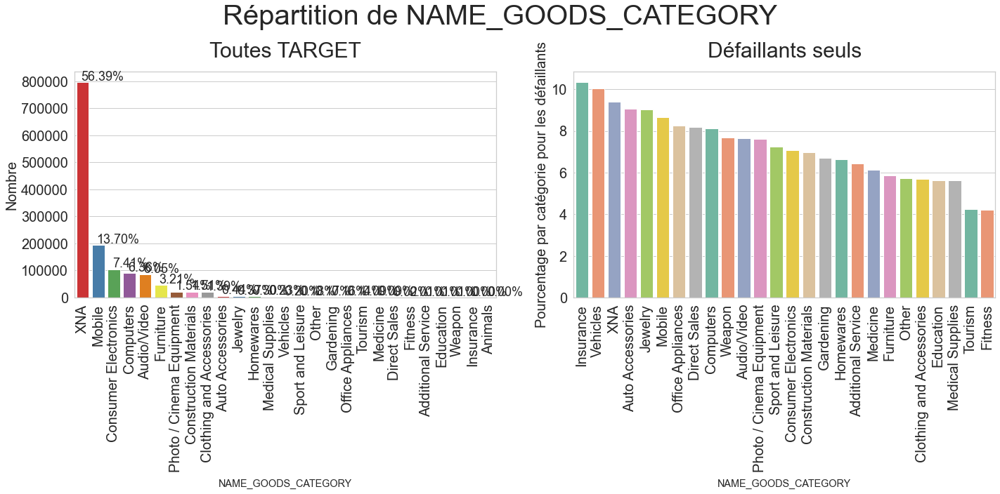

In [219]:
print_unique_categories(prev_merged,'NAME_GOODS_CATEGORY', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_GOODS_CATEGORY',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_PORTFOLIO' sont :
['POS' 'Cash' 'XNA' 'Cards' nan 'Cars']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
POS      592460
Cash     391663
XNA      307213
Cards    121985
Cars        380
Name: NAME_PORTFOLIO, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_PORTFOLIO = 6


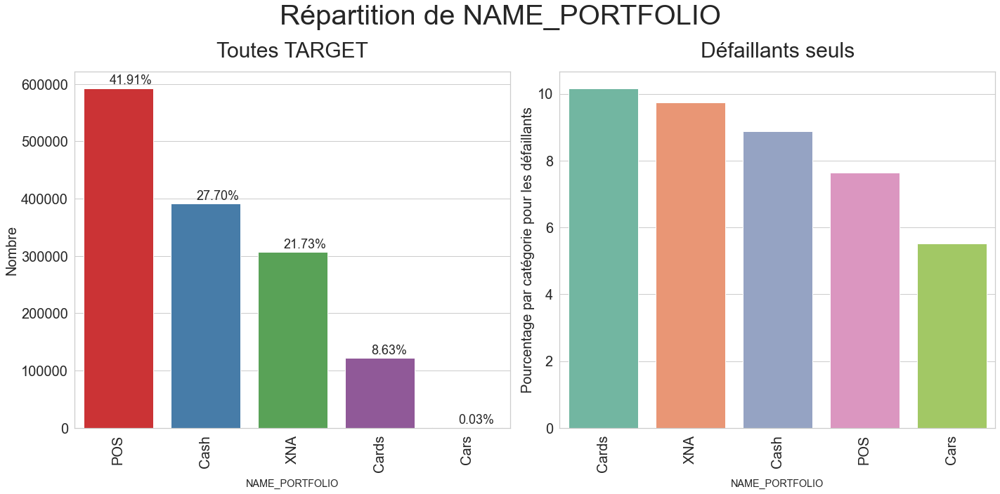

In [221]:
print_unique_categories(prev_merged,'NAME_PORTFOLIO', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_PORTFOLIO',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_PRODUCT_TYPE' sont :
['XNA' 'x-sell' 'walk-in' nan]
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
XNA        900053
x-sell     385394
walk-in    128254
Name: NAME_PRODUCT_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_PRODUCT_TYPE = 4


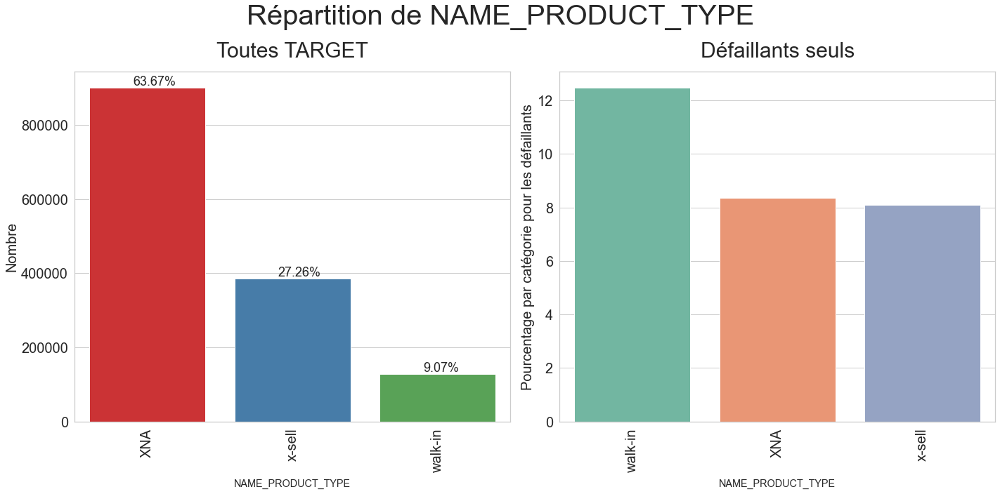

In [222]:
print_unique_categories(prev_merged,'NAME_PRODUCT_TYPE', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_PRODUCT_TYPE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_SELLER_INDUSTRY' sont :
['Auto technology' 'XNA' 'Furniture' 'Consumer electronics' 'Connectivity'
 'Construction' 'Clothing' nan 'Industry' 'Tourism' 'Jewelry'
 'MLM partners']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
XNA                     715322
Consumer electronics    341701
Connectivity            238350
Furniture                48966
Construction             25417
Clothing                 19896
Industry                 16567
Auto technology           4080
Jewelry                   2107
MLM partners               921
Tourism                    374
Name: NAME_SELLER_INDUSTRY, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_SELLER_INDUSTRY = 12


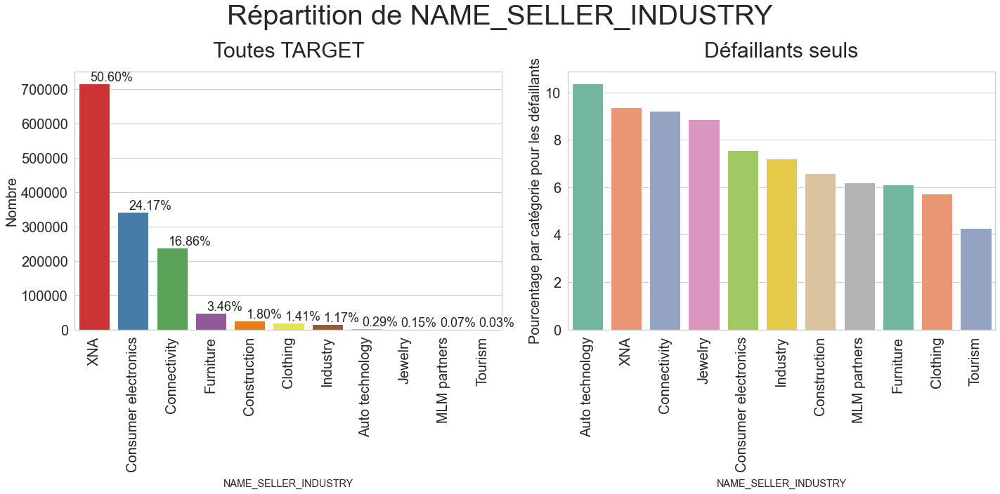

In [223]:
print_unique_categories(prev_merged,'NAME_SELLER_INDUSTRY', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_SELLER_INDUSTRY',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_YIELD_GROUP' sont :
['low_normal' 'middle' 'XNA' 'high' 'low_action' nan]
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
XNA           429198
middle        324971
high          306061
low_normal    274884
low_action     78587
Name: NAME_YIELD_GROUP, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_YIELD_GROUP = 6


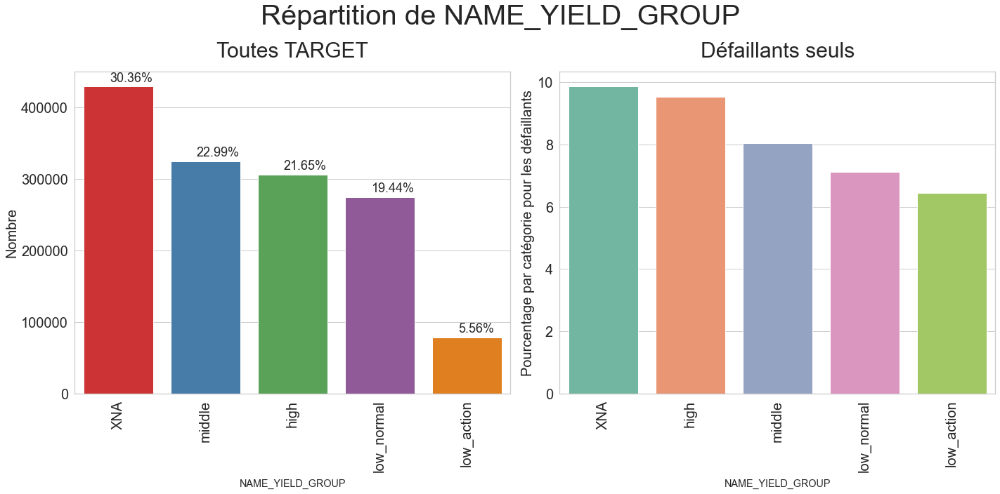

In [224]:
print_unique_categories(prev_merged,'NAME_YIELD_GROUP', show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_YIELD_GROUP',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18)

In [225]:
# Liste des variables quantitatives
cols_num_prev = \
    prev_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num_prev

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'AMT_ANNUITY',
 'AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_DOWN_PAYMENT',
 'AMT_GOODS_PRICE',
 'HOUR_APPR_PROCESS_START',
 'NFLAG_LAST_APPL_IN_DAY',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'DAYS_DECISION',
 'SELLERPLACE_AREA',
 'CNT_PAYMENT',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

In [227]:
def print_percentiles(data, column_name, percentiles=None):
    '''
    Function to print percentile values for given column
    Inputs:
        data: DataFrame
            The DataFrame from which to print percentiles
        column_name: str
            Column's name whose percentiles are to be printed
        percentiles: list, default = None
            The list of percentiles to print, if not given, default are printed
    '''
    print('-' * 79)
    print(f'Pecentiles de la variable {column_name}')
    if not percentiles:
        percentiles = list(range(0, 80, 25)) + list(range(90, 101, 2))
    for i in percentiles:
        
        print(
            f'Pecentile {i} = {np.percentile(data[column_name].dropna(), i)}')
    print("-" * 79)

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_DECISION
Pecentile 0 = -2922.0
Pecentile 2 = -2748.0
Pecentile 4 = -2612.0
Pecentile 6 = -2499.0
Pecentile 8 = -2383.0
Pecentile 10 = -2257.0
Pecentile 25 = -1313.0
Pecentile 50 = -582.0
Pecentile 75 = -271.0
Pecentile 100 = -1.0
-------------------------------------------------------------------------------


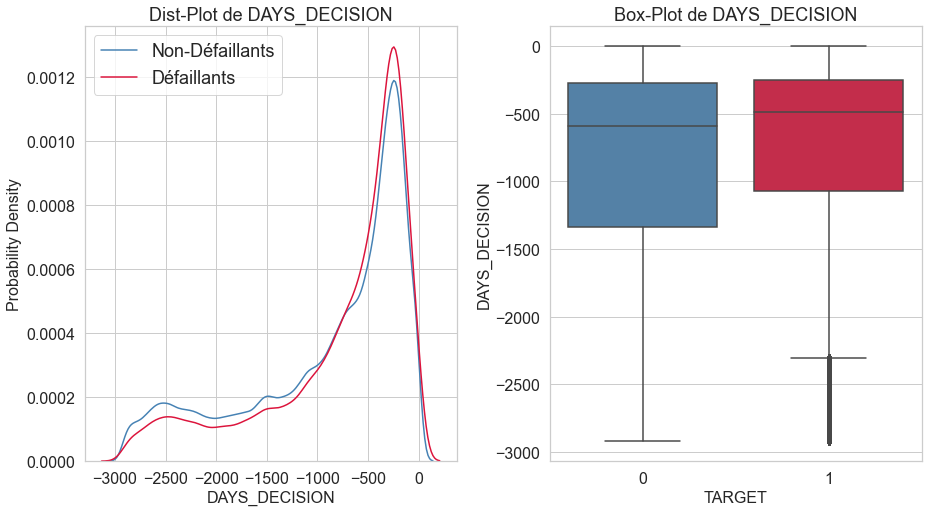

In [228]:
print_percentiles(prev_merged, 'DAYS_DECISION',percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(prev_merged, 'DAYS_DECISION',plots=['distplot', 'box'], figsize=(15, 8))

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_FIRST_DRAWING
Pecentile 0 = -2922.0
Pecentile 2 = -1179.0
Pecentile 4 = -406.0
Pecentile 6 = -156.0
Pecentile 8 = 365243.0
Pecentile 10 = 365243.0
Pecentile 25 = 365243.0
Pecentile 50 = 365243.0
Pecentile 75 = 365243.0
Pecentile 100 = 365243.0
-------------------------------------------------------------------------------


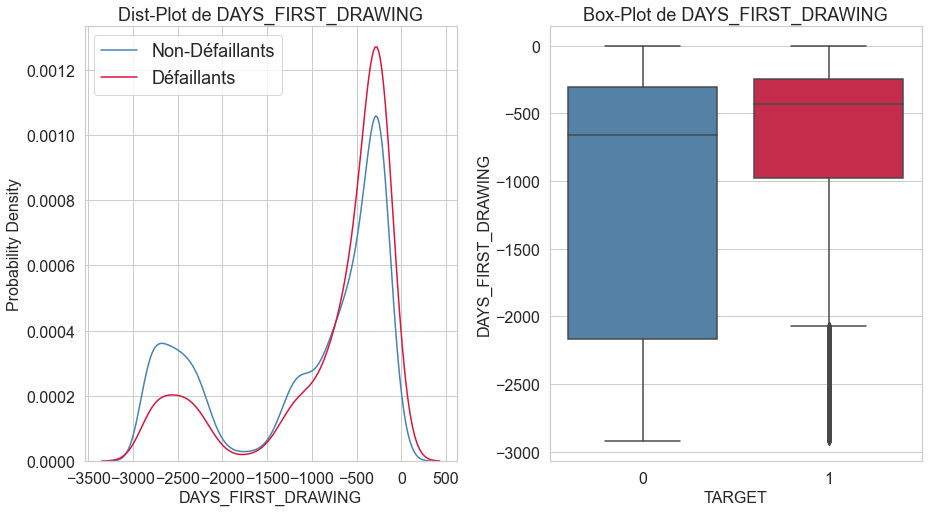

In [230]:
print_percentiles(prev_merged, 'DAYS_FIRST_DRAWING',percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(prev_merged, 'DAYS_FIRST_DRAWING',plots=['distplot', 'box'], figsize=(15, 8),scale_limits=[-3000, 0])

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_FIRST_DRAWING
Pecentile 0 = -2922.0
Pecentile 2 = -1179.0
Pecentile 4 = -406.0
Pecentile 6 = -156.0
Pecentile 8 = 365243.0
Pecentile 10 = 365243.0
Pecentile 25 = 365243.0
Pecentile 50 = 365243.0
Pecentile 75 = 365243.0
Pecentile 100 = 365243.0
-------------------------------------------------------------------------------


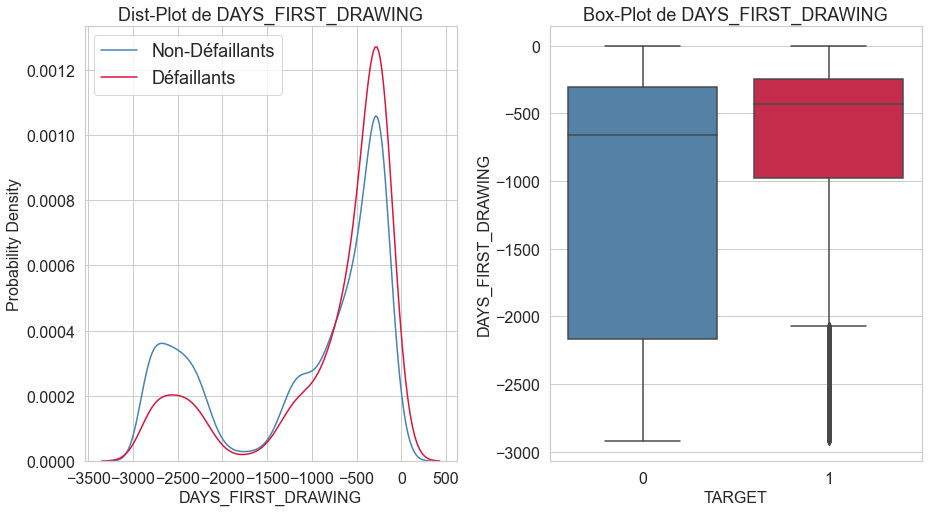

In [232]:
print_percentiles(prev_merged, 'DAYS_FIRST_DRAWING',percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(prev_merged, 'DAYS_FIRST_DRAWING',plots=['distplot', 'box'], figsize=(15, 8),scale_limits=[-3000, 0])

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_FIRST_DUE
Pecentile 0 = -2892.0
Pecentile 2 = -2759.0
Pecentile 4 = -2648.0
Pecentile 6 = -2555.0
Pecentile 8 = -2471.0
Pecentile 10 = -2388.0
Pecentile 25 = -1630.0
Pecentile 50 = -825.0
Pecentile 75 = -408.0
Pecentile 100 = 365243.0
-------------------------------------------------------------------------------


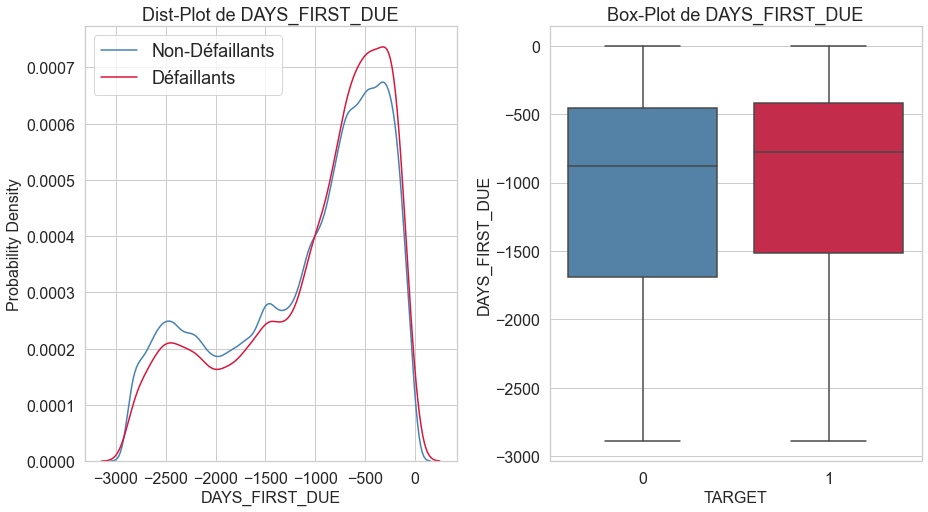

In [233]:
print_percentiles(prev_merged, 'DAYS_FIRST_DUE',percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(prev_merged, 'DAYS_FIRST_DUE',plots=['distplot', 'box'], figsize=(15, 8),scale_limits=[-3000, 0])

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_LAST_DUE
Pecentile 0 = -2889.0
Pecentile 2 = -2534.0
Pecentile 4 = -2400.0
Pecentile 6 = -2290.0
Pecentile 8 = -2186.0
Pecentile 10 = -2079.0
Pecentile 25 = -1316.0
Pecentile 50 = -534.0
Pecentile 75 = -73.0
Pecentile 100 = 365243.0
-------------------------------------------------------------------------------


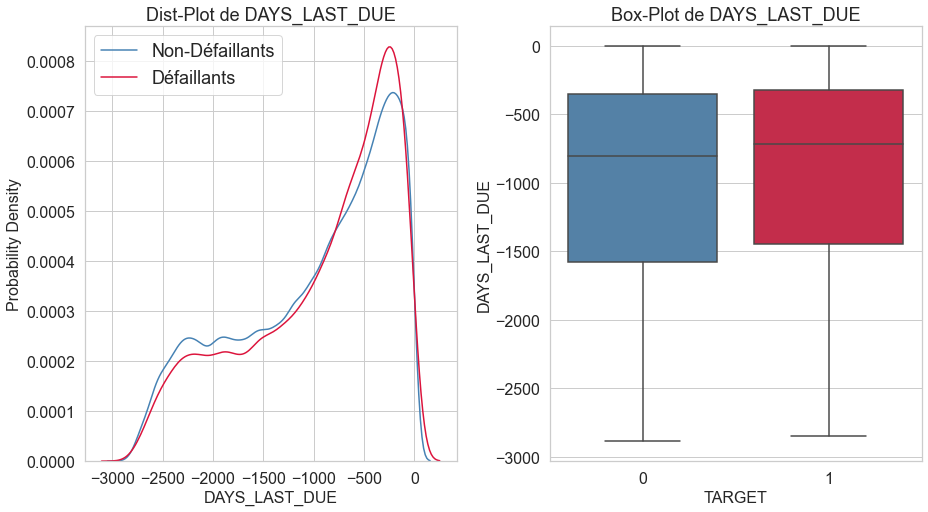

In [234]:
print_percentiles(prev_merged, 'DAYS_LAST_DUE',percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(prev_merged, 'DAYS_LAST_DUE',plots=['distplot', 'box'], figsize=(15, 8),scale_limits=[-3000, 0])

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_LAST_DUE_1ST_VERSION
Pecentile 0 = -2801.0
Pecentile 2 = -2516.0
Pecentile 4 = -2380.0
Pecentile 6 = -2267.0
Pecentile 8 = -2159.0
Pecentile 10 = -2045.0
Pecentile 25 = -1244.0
Pecentile 50 = -358.0
Pecentile 75 = 135.0
Pecentile 100 = 365243.0
-------------------------------------------------------------------------------


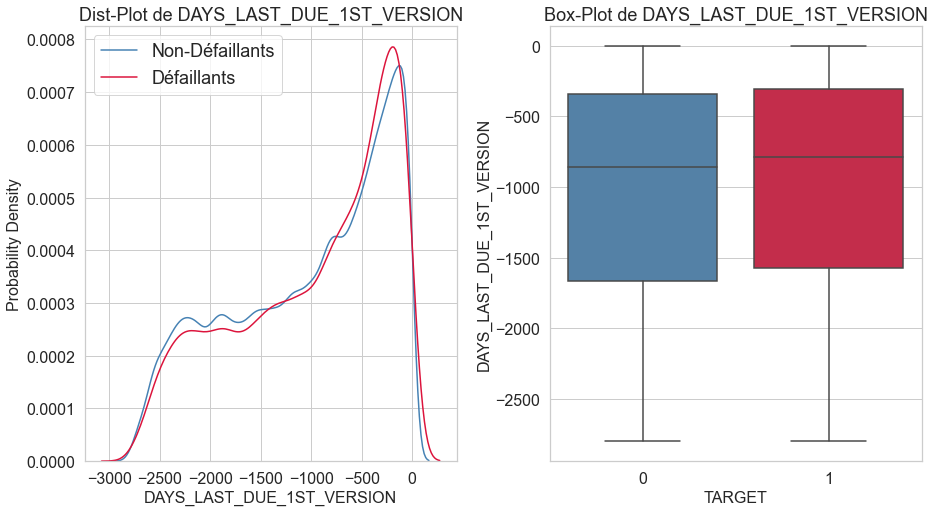

In [235]:
print_percentiles(prev_merged, 'DAYS_LAST_DUE_1ST_VERSION',percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(prev_merged, 'DAYS_LAST_DUE_1ST_VERSION',plots=['distplot', 'box'], figsize=(15, 8),scale_limits=[-3000, 0])

-------------------------------------------------------------------------------
Pecentiles de la variable AMT_ANNUITY
Pecentile 0 = 0.0
Pecentile 2 = 2250.0
Pecentile 4 = 2396.79
Pecentile 6 = 2984.4414
Pecentile 8 = 3375.0
Pecentile 10 = 3790.9890000000005
Pecentile 25 = 6257.8575
Pecentile 50 = 11223.765
Pecentile 75 = 20420.775
Pecentile 100 = 418058.145
-------------------------------------------------------------------------------


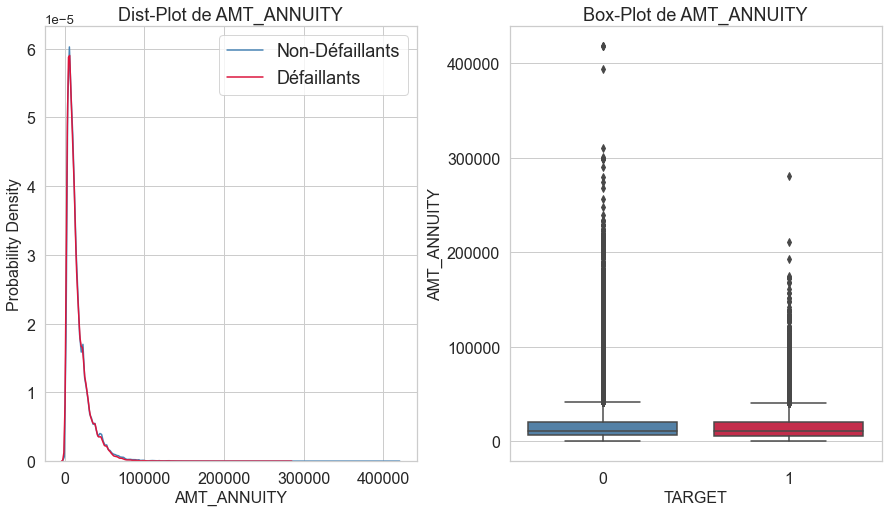

In [237]:
print_percentiles(prev_merged, 'AMT_ANNUITY',percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(prev_merged, 'AMT_ANNUITY',plots=['distplot', 'box'], figsize=(15, 8))

-------------------------------------------------------------------------------
Pecentiles de la variable AMT_APPLICATION
Pecentile 0 = 0.0
Pecentile 2 = 0.0
Pecentile 4 = 0.0
Pecentile 6 = 0.0
Pecentile 8 = 0.0
Pecentile 10 = 0.0
Pecentile 25 = 19750.5
Pecentile 50 = 70870.5
Pecentile 75 = 180000.0
Pecentile 100 = 5850000.0
-------------------------------------------------------------------------------


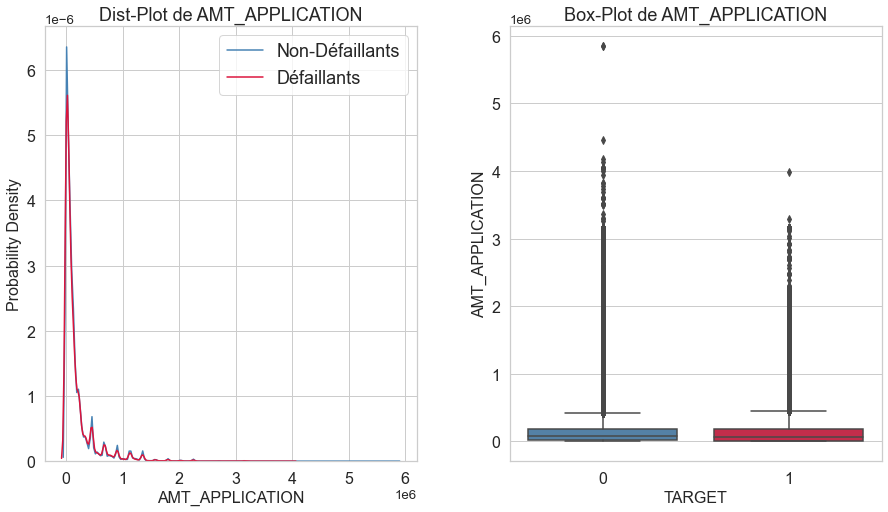

In [238]:
print_percentiles(prev_merged, 'AMT_APPLICATION',percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(prev_merged, 'AMT_APPLICATION',plots=['distplot', 'box'], figsize=(15, 8))

-------------------------------------------------------------------------------
Pecentiles de la variable AMT_CREDIT
Pecentile 0 = 0.0
Pecentile 2 = 0.0
Pecentile 4 = 0.0
Pecentile 6 = 0.0
Pecentile 8 = 0.0
Pecentile 10 = 0.0
Pecentile 25 = 24880.5
Pecentile 50 = 80595.0
Pecentile 75 = 215640.0
Pecentile 100 = 4509688.5
-------------------------------------------------------------------------------


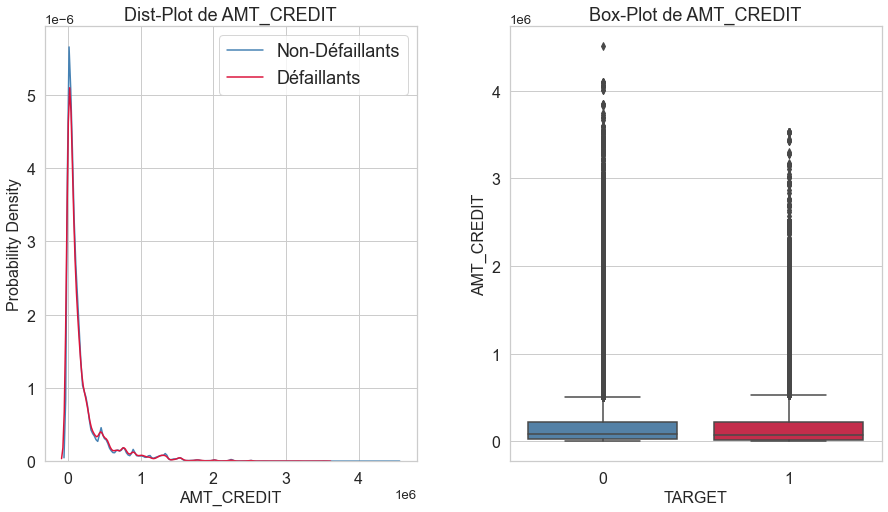

In [239]:
print_percentiles(prev_merged, 'AMT_CREDIT',percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(prev_merged, 'AMT_CREDIT',plots=['distplot', 'box'], figsize=(15, 8))

-------------------------------------------------------------------------------


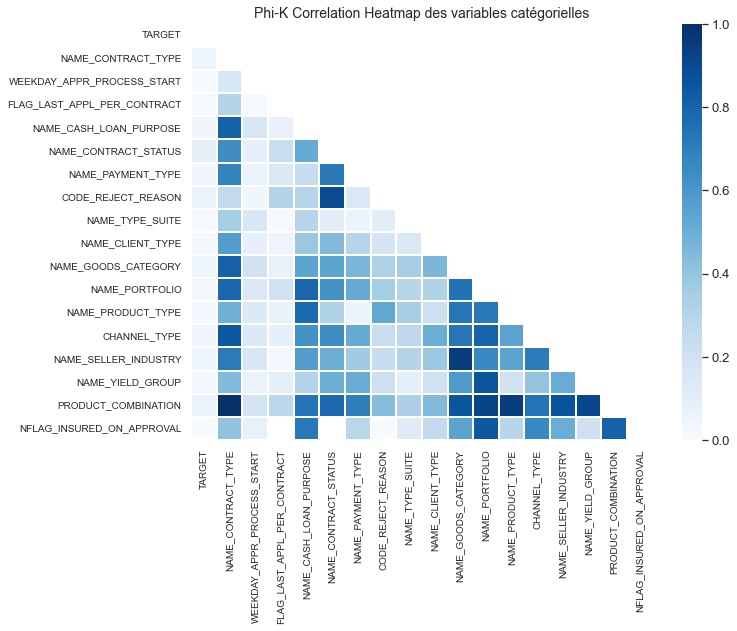

-------------------------------------------------------------------------------
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
NAME_CONTRACT_STATUS,0.088266
PRODUCT_COMBINATION,0.063839
CODE_REJECT_REASON,0.062771
NAME_CONTRACT_TYPE,0.050859
CHANNEL_TYPE,0.050302
NAME_GOODS_CATEGORY,0.042951
NAME_CASH_LOAN_PURPOSE,0.040305
NAME_PAYMENT_TYPE,0.039752
NAME_SELLER_INDUSTRY,0.038077
NAME_YIELD_GROUP,0.034626


-------------------------------------------------------------------------------


In [240]:
cols_for_phik = ['TARGET'] + \
    prev_merged.dtypes[prev_merged.dtypes == 'object'].index.tolist() \
    + ['NFLAG_INSURED_ON_APPROVAL']
plot_phik_matrix(prev_merged, cols_for_phik,
                                      figsize=(11, 9), fontsize=10)

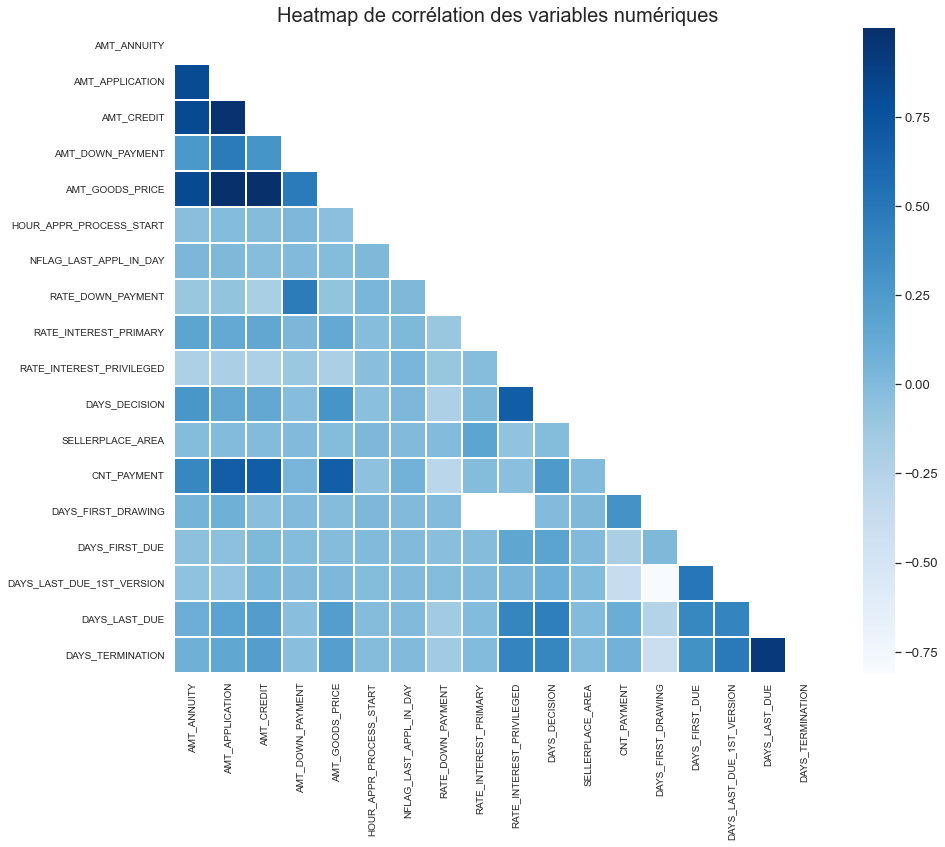

In [241]:
corr_mat = correlation_matrix(prev_merged,
                                            ['SK_ID_CURR', 'SK_ID_PREV',
                                             'NFLAG_INSURED_ON_APPROVAL'],
                                            cmap='Blues',
                                            figsize=(14, 12))
corr_mat.plot_correlation_matrix()

In [242]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_APPLICATION']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'AMT_DOWN_PAYMENT']
interval columns not set, guessing: ['TARGET', 'AMT_GOODS_PRICE']
interval columns not set, guessing: ['TARGET', 'HOUR_APPR_PROCESS_START']
interval columns not set, guessing: ['TARGET', 'NFLAG_LAST_APPL_IN_DAY']
interval columns not set, guessing: ['TARGET', 'RATE_DOWN_PAYMENT']
interval columns not set, guessing: ['TARGET', 'RATE_INTEREST_PRIMARY']
interval columns not set, guessing: ['TARGET', 'RATE_INTEREST_PRIVILEGED']
interval columns not set, guessing: ['TARGET', 'DAYS_DECISION']
interval columns not set, guessing: ['TARGET', 'SELLERPLACE_AREA']
interval columns not set, guessing: ['TARGET', 'CNT_PAYMENT']
interval columns not set, guessing: ['TARGET', 'DAYS_FIRST_DRAWING']
interval columns not set, guessing: ['TARGET', 'DAYS_F

Column Name,Phik-Correlation
CNT_PAYMENT,0.056639
DAYS_DECISION,0.053694
DAYS_FIRST_DRAWING,0.048993
RATE_DOWN_PAYMENT,0.039592
HOUR_APPR_PROCESS_START,0.038121
RATE_INTEREST_PRIVILEGED,0.028204
DAYS_LAST_DUE_1ST_VERSION,0.027878
DAYS_LAST_DUE,0.027320
DAYS_TERMINATION,0.026479
AMT_ANNUITY,0.013808


-------------------------------------------------------------------------------


# CONCLUSION

# trop de données qu'il faudra fusionner 
# Existence de données extrêmes (abberantes? vérifier)
# Existence de corrélations...
# Jeu de données désequilibré 